#**Лабораторное занятие 1** Ощая  информация о библиотеке ETNA. Создание объекта TSDataset

[Документация по ETNA](https://etna-docs.netlify.app/)

In [ ]:
!wget 'https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download' -O monthly_australian_wine_sales.csv
!wget 'https://drive.usercontent.google.com/u/0/uc?id=1mjsrJvL6yNerYgFIWAEwmk1G8RjXylQx&export=download' -O example_dataset.csv

--2024-04-22 10:57:41--  https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 108.177.12.132, 2607:f8b0:400c:c08::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|108.177.12.132|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-22 10:57:41--  https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-22 10:57:41--  https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing exi

In [ ]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install ETNA

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.2/422.2 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.1/354.1 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 3.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 24.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 kB 4.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 23.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 14.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.8/292.8 kB 13.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Функция для генерирования искусственных датафреймов.
from etna.datasets import generate_const_df

# Класс для преобразования датафреймов в формат ETNA.
from etna.datasets.tsdataset import TSDataset



In [ ]:
df = pd.read_csv('monthly_australian_wine_sales.csv')
df.head()

,month,sales
0,1980-01-01,15136
1,1980-02-01,16733
2,1980-03-01,20016
3,1980-04-01,17708
4,1980-05-01,18019


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176 entries, 0 to 175
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   month   176 non-null    object
 1   sales   176 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 2.9+ KB


In [ ]:
df['timestamp'] = pd.to_datetime(df['month'])
df['target'] = df['sales']
df.drop(columns=['month', 'sales'], inplace = True)
df['segment'] = 'main'
df.head()

,timestamp,target,segment
0,1980-01-01,15136,main
1,1980-02-01,16733,main
2,1980-03-01,20016,main
3,1980-04-01,17708,main
4,1980-05-01,18019,main


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176 entries, 0 to 175
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  176 non-null    datetime64[ns]
 1   target     176 non-null    int64         
 2   segment    176 non-null    object        
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 4.2+ KB


In [ ]:
expl = generate_const_df(
    periods =  30,
    start_time = '2000-01-01',
    n_segments = 2,
    scale = 1
)
print(type(expl))
expl.head()

<class 'pandas.core.frame.DataFrame'>


,timestamp,segment,target
0,2000-01-01,segment_0,1.0
1,2000-01-02,segment_0,1.0
2,2000-01-03,segment_0,1.0
3,2000-01-04,segment_0,1.0
4,2000-01-05,segment_0,1.0


In [ ]:
expl.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60 entries, 0 to 59
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  60 non-null     datetime64[ns]
 1   segment    60 non-null     object        
 2   target     60 non-null     float64       
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 1.5+ KB


In [ ]:
expl_ts_format = TSDataset.to_dataset(expl)
expl_ts_format.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 30 entries, 2000-01-01 to 2000-01-30
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   (segment_0, target)  30 non-null     float64
 1   (segment_1, target)  30 non-null     float64
dtypes: float64(2)
memory usage: 720.0 bytes


In [ ]:
expl_ts_format.head()

segment,segment_0,segment_1
feature,target,target
timestamp,,
2000-01-01,1.0,1.0
2000-01-02,1.0,1.0
2000-01-03,1.0,1.0
2000-01-04,1.0,1.0
2000-01-05,1.0,1.0


In [ ]:
fitidx_explt = TSDataset(expl_ts_format, 'D')
print(type(fitidx_explt))


<class 'etna.datasets.tsdataset.TSDataset'>


In [ ]:
fitidx_explt.info()

<class 'etna.datasets.TSDataset'>
num_segments: 2
num_exogs: 0
num_regressors: 0
num_known_future: 0
freq: D
          start_timestamp end_timestamp  length  num_missing
segments                                                    
segment_0      2000-01-01    2000-01-30      30            0
segment_1      2000-01-01    2000-01-30      30            0


In [ ]:
df2 = TSDataset.to_dataset(df)

In [ ]:
df2

segment,main
feature,target
timestamp,
1980-01-01,15136
1980-02-01,16733
1980-03-01,20016
1980-04-01,17708
1980-05-01,18019
...,...
1994-04-01,26323
1994-05-01,23779


In [ ]:
ts = TSDataset(df2, 'MS')

In [ ]:
ts.head()

segment,main
feature,target
timestamp,
1980-01-01,15136
1980-02-01,16733
1980-03-01,20016
1980-04-01,17708
1980-05-01,18019


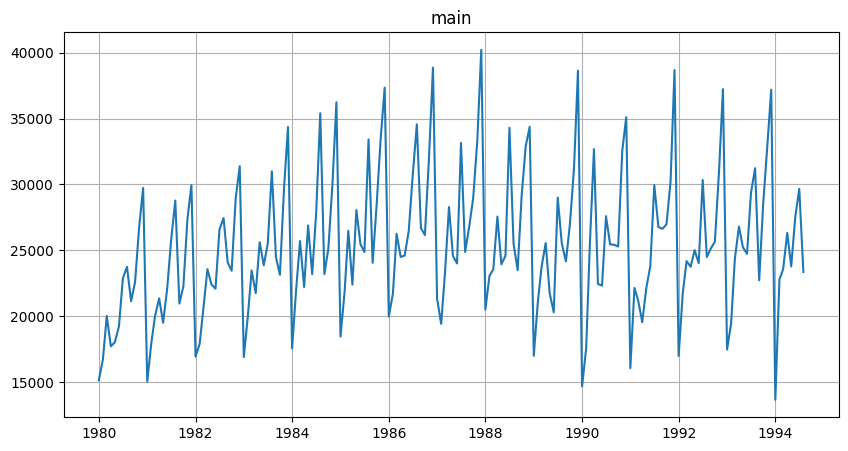

In [ ]:
ts.plot()

In [ ]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
main,1980-01-01,1994-08-01,176,0,1,0,0,0,MS


#**Лабораторное занятие 2** Модель наивного прогноза. Модель скользящего среднего

In [ ]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [ ]:
!pip install ETNA

In [ ]:
# Класс для преобразования датафреймов в формат ETNA.
from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast

In [ ]:
df = pd.read_csv('monthly_australian_wine_sales.csv')
df.head()

df['timestamp'] = pd.to_datetime(df['month'])
df['target'] = df['sales']
df.drop(columns=['month', 'sales'], inplace = True)
df['segment'] = 'main'
df.head()

,timestamp,target,segment
0,1980-01-01,15136,main
1,1980-02-01,16733,main
2,1980-03-01,20016,main
3,1980-04-01,17708,main
4,1980-05-01,18019,main


In [ ]:
df2 = TSDataset.to_dataset(df)
df2.head()

segment,main
feature,target
timestamp,
1980-01-01,15136
1980-02-01,16733
1980-03-01,20016
1980-04-01,17708
1980-05-01,18019


In [ ]:
ts = TSDataset(df2, 'MS')

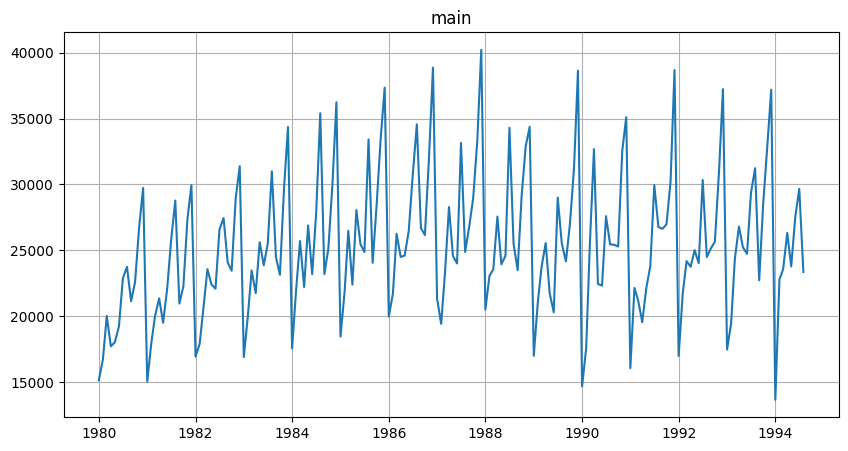

In [ ]:
ts.plot()

In [ ]:
HORIZON = 8
train_ts, test_ts = ts.train_test_split(
    train_start = '1980-01-01',
    train_end = '1993-12-01',
    test_start = '1994-01-01',
    test_end = '1994-08-01'

)

In [ ]:
from etna.models import NaiveModel

In [ ]:
model = NaiveModel()
model.fit(train_ts)

NaiveModel(lag = 1, )

In [ ]:
future_ts = train_ts.make_future(HORIZON, tail_steps = model.context_size)
future_ts

segment,main
feature,target
timestamp,
1993-12-01,37198.0
1994-01-01,NaN
1994-02-01,NaN
1994-03-01,NaN
1994-04-01,NaN
1994-05-01,NaN
1994-06-01,NaN
1994-07-01,NaN


In [ ]:
forecast_ts = model.forecast(future_ts, prediction_size = HORIZON)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,37198.0
1994-02-01,37198.0
1994-03-01,37198.0
1994-04-01,37198.0
1994-05-01,37198.0
1994-06-01,37198.0
1994-07-01,37198.0
1994-08-01,37198.0


In [ ]:
train_ts.tail(3)

segment,main
feature,target
timestamp,
1993-10-01,28496
1993-11-01,32857
1993-12-01,37198


In [ ]:
smape = SMAPE()
smape(y_true = test_ts, y_pred = forecast_ts)

{'main': 45.233722723374306}

In [ ]:
model = NaiveModel(lag = 24)
model.fit(train_ts)
future_ts = train_ts.make_future(HORIZON, tail_steps = model.context_size)
future_ts

segment,main
feature,target
timestamp,
1992-01-01,16974.0
1992-02-01,21697.0
1992-03-01,24179.0
1992-04-01,23757.0
1992-05-01,25013.0
1992-06-01,24019.0
1992-07-01,30345.0
1992-08-01,24488.0


In [ ]:
forecast_ts = model.forecast(future_ts, prediction_size = HORIZON)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,16974.0
1994-02-01,21697.0
1994-03-01,24179.0
1994-04-01,23757.0
1994-05-01,25013.0
1994-06-01,24019.0
1994-07-01,30345.0
1994-08-01,24488.0


In [ ]:
smape = SMAPE()
smape(y_true = test_ts, y_pred = forecast_ts)

{'main': 8.145647043454959}

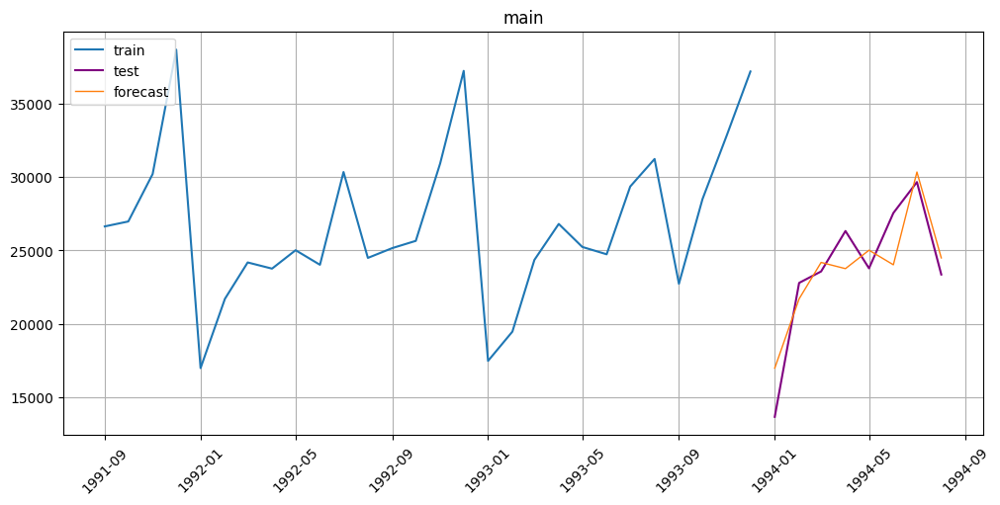

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples = 28)

In [ ]:
ddf = pd.read_csv('example_dataset.csv')

In [ ]:
ddf

,timestamp,segment,target
0,2019-01-01,segment_a,170
1,2019-01-02,segment_a,243
2,2019-01-03,segment_a,267
3,2019-01-04,segment_a,287
4,2019-01-05,segment_a,279
...,...,...,...
1455,2019-12-27,segment_d,1088
1456,2019-12-28,segment_d,889
1457,2019-12-29,segment_d,789
1458,2019-12-30,segment_d,1015


In [ ]:
ddf2 = TSDataset.to_dataset(ddf)

In [ ]:
ddf2

segment,segment_a,segment_b,segment_c,segment_d
feature,target,target,target,target
timestamp,,,,
2019-01-01,170,102,92,238
2019-01-02,243,123,107,358
2019-01-03,267,130,103,366
2019-01-04,287,138,103,385
2019-01-05,279,137,104,384
...,...,...,...,...
2019-12-27,598,287,178,1088
2019-12-28,511,249,154,889


In [ ]:
ts = TSDataset(ddf2,'D')

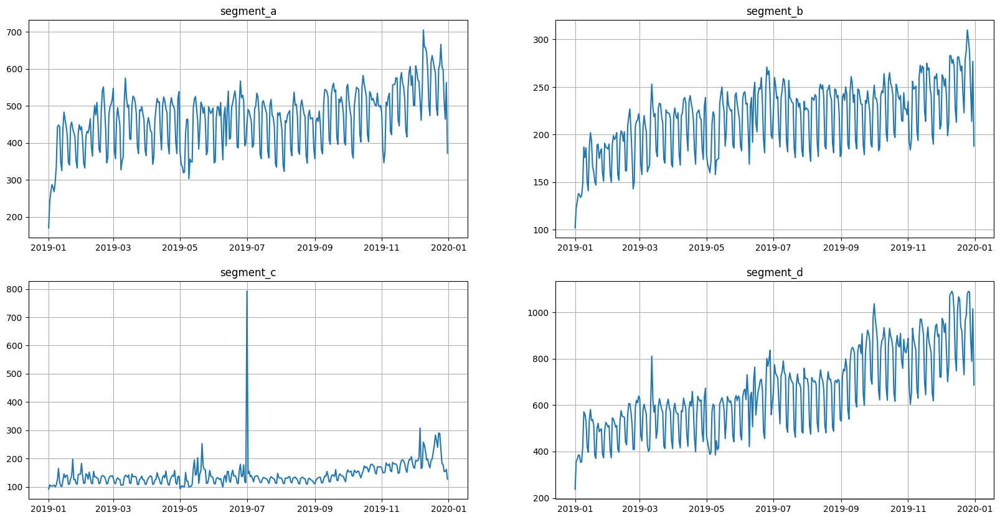

In [ ]:
ts.plot()

In [ ]:
HORIZON = 7

In [ ]:
train_ts, test_ts = ts.train_test_split(
    train_start = '2019-01-01',
    train_end = '2019-12-24',
    test_start = '2019-12-25',
    test_end = '2019-12-31'
)

In [ ]:
model = NaiveModel(lag = 7)
model.fit(train_ts)
future_ts = train_ts.make_future(HORIZON, tail_steps = model.context_size)
future_ts

segment,segment_a,segment_b,segment_c,segment_d
feature,target,target,target,target
timestamp,,,,
2019-12-18,621.0,276.0,222.0,1056.0
2019-12-19,602.0,267.0,247.0,938.0
2019-12-20,589.0,272.0,283.0,920.0
2019-12-21,493.0,243.0,265.0,810.0
2019-12-22,474.0,223.0,240.0,731.0
2019-12-23,600.0,279.0,291.0,963.0
2019-12-24,613.0,288.0,288.0,986.0
2019-12-25,NaN,NaN,NaN,NaN


In [ ]:
forecast_ts = model.forecast(future_ts, prediction_size = HORIZON)
forecast_ts

segment,segment_a,segment_b,segment_c,segment_d
feature,target,target,target,target
timestamp,,,,
2019-12-25,621.0,276.0,222.0,1056.0
2019-12-26,602.0,267.0,247.0,938.0
2019-12-27,589.0,272.0,283.0,920.0
2019-12-28,493.0,243.0,265.0,810.0
2019-12-29,474.0,223.0,240.0,731.0
2019-12-30,600.0,279.0,291.0,963.0
2019-12-31,613.0,288.0,288.0,986.0


In [ ]:
smape(y_true = test_ts, y_pred = forecast_ts)

{'segment_a': 10.00303622603345,
 'segment_b': 11.129326029812358,
 'segment_c': 44.32730651568891,
 'segment_d': 13.129081727387423}

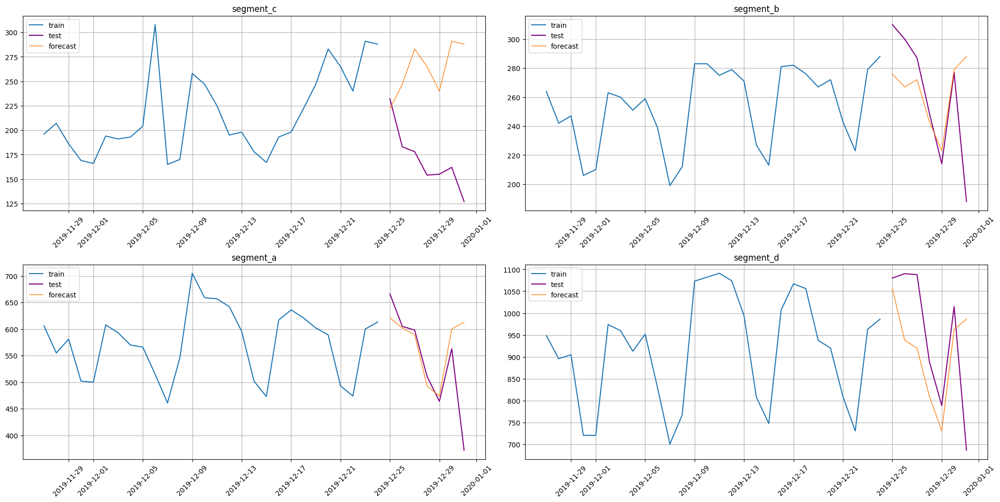

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples = 28)

# Модель скользящего среднего

In [ ]:
from etna.models import MovingAverageModel

In [ ]:
model = MovingAverageModel(window = 7)
HORIZON = 8
ts = TSDataset(df2, 'MS')
train_ts, test_ts = ts.train_test_split(
    train_start = '1980-01-01',
    train_end = '1993-12-01',
    test_start = '1994-01-01',
    test_end = '1994-08-01'

)
model.fit(train_ts)
future_ts = train_ts.make_future(HORIZON, tail_steps = model.context_size)
future_ts

segment,main
feature,target
timestamp,
1993-06-01,24735.0
1993-07-01,29356.0
1993-08-01,31234.0
1993-09-01,22724.0
1993-10-01,28496.0
1993-11-01,32857.0
1993-12-01,37198.0
1994-01-01,NaN


In [ ]:
forecast_ts = model.forecast(future_ts, prediction_size = HORIZON)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,29514.285714
1994-02-01,30197.040816
1994-03-01,30317.189504
1994-04-01,30186.216576
1994-05-01,31252.247516
1994-06-01,31645.997161
1994-07-01,31472.996755
1994-08-01,30655.139149


In [ ]:
smape(y_true = test_ts, y_pred = forecast_ts)

{'main': 26.771907325427378}

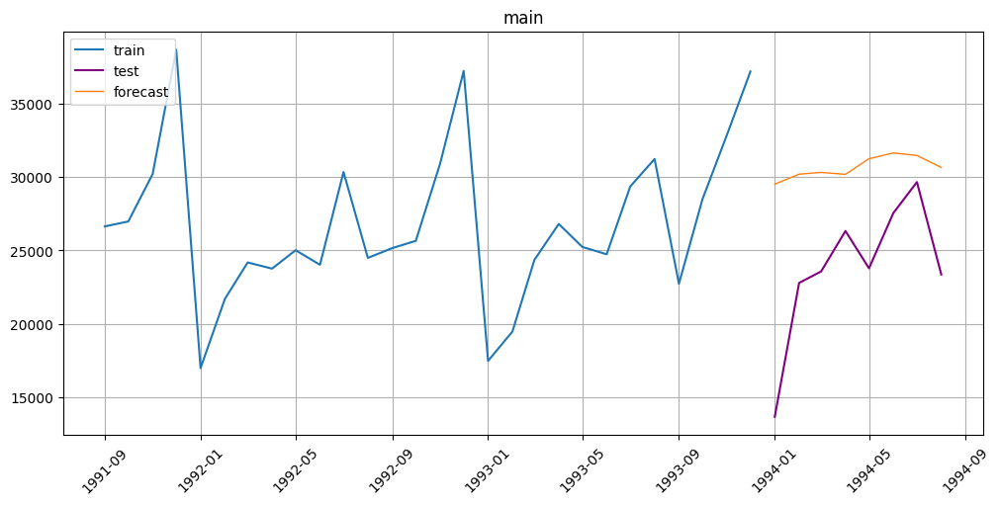

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples = 28)

In [ ]:
from etna.models import SeasonalMovingAverageModel

In [ ]:
model = SeasonalMovingAverageModel(seasonality = 12)
model.fit(train_ts)
HORIZON = 8

In [ ]:
future_ts = train_ts.make_future(HORIZON, tail_steps = model.context_size)
future_ts

segment,main
feature,target
timestamp,
1989-01-01,16991.0
1989-02-01,21109.0
1989-03-01,23740.0
1989-04-01,25552.0
1989-05-01,21752.0
...,...
1994-04-01,NaN
1994-05-01,NaN


In [ ]:
forecast_ts = model.forecast(future_ts, prediction_size = HORIZON)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,16431.0
1994-02-01,20391.6
1994-03-01,23784.4
1994-04-01,25668.0
1994-05-01,23306.8
1994-06-01,23036.0
1994-07-01,29253.2
1994-08-01,26689.2


In [ ]:
smape(y_true = test_ts, y_pred = forecast_ts)

{'main': 8.444354755762415}

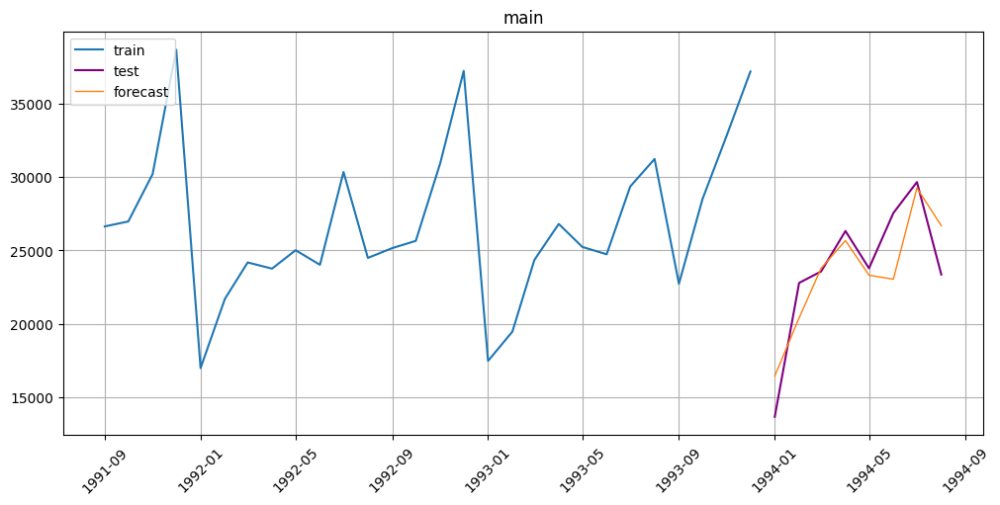

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples = 28)

## РГР (описание данных, построение наивного прогноза и модели скользящего среднего)  
Датасет содержит данные о погоде с 1 января 2013 года по 24 апреля 2017 года в городе Дели, Индия. Признаки:  
средняя температура, влажность, скорость ветра

In [ ]:
!wget 'https://drive.usercontent.google.com/uc?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download' -O DelhiClimate.csv

--2024-05-05 21:19:47--  https://drive.usercontent.google.com/uc?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 142.251.167.132, 2607:f8b0:4004:c1d::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|142.251.167.132|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download [following]
--2024-05-05 21:19:47--  https://drive.usercontent.google.com/download?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 90127 (88K) [application/octet-stream]
Saving to: ‘DelhiClimate.csv’

DelhiClimate.csv    100%[===================>]  88.01K  --.-KB/s    in 0.008s  

2024-05-05 21:19:48 (10.4 MB/s) - ‘DelhiClimate.csv’ saved [90127/90127]



In [ ]:
!pip install etna

In [ ]:
import pandas as pd
from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast
df = pd.read_csv('DelhiClimate.csv', index_col=[0])

In [ ]:
df.drop(index = 1461, inplace = True)

In [ ]:
df1 = df.drop(columns = ['humidity', 'wind_speed', 'meanpressure'])
df2 = df.drop(columns = ['meantemp', 'wind_speed', 'meanpressure'])
df3 = df.drop(columns = ['humidity', 'meantemp', 'meanpressure'])
#df4 = df.drop(columns = ['humidity', 'wind_speed', 'meantemp'])
df1['segment'] = 'meantemp'
df2['segment'] = 'humidity'
df3['segment'] = 'windspeed'
#df4['segment'] = 'meanpressure'
df1.rename(columns={"meantemp": "target"}, inplace = True)
df2.rename(columns={"humidity": "target"}, inplace = True)
df3.rename(columns={"wind_speed": "target"}, inplace = True)
#df4.rename(columns={"meanpressure": "target"}, inplace = True)
df5 = pd.concat([df1, df2, df3])
df5.rename(columns={"date": "timestamp"}, inplace = True)
df5['timestamp'] = pd.to_datetime(df5['timestamp'])

In [ ]:
df5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4725 entries, 0 to 1460
Data columns (total 3 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   timestamp  4725 non-null   datetime64[ns]
 1   target     4725 non-null   float64       
 2   segment    4725 non-null   object        
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 147.7+ KB


In [ ]:
df6 = TSDataset.to_dataset(df5)

In [ ]:
df6

segment,humidity,meantemp,windspeed
feature,target,target,target
timestamp,,,
2013-01-01,84.500000,10.000000,0.000000
2013-01-02,92.000000,7.400000,2.980000
2013-01-03,87.000000,7.166667,4.633333
2013-01-04,71.333333,8.666667,1.233333
2013-01-05,86.833333,6.000000,3.700000
...,...,...,...
2017-04-20,27.500000,34.500000,5.562500
2017-04-21,39.375000,34.250000,6.962500


In [ ]:
ts = TSDataset(df6, 'D')

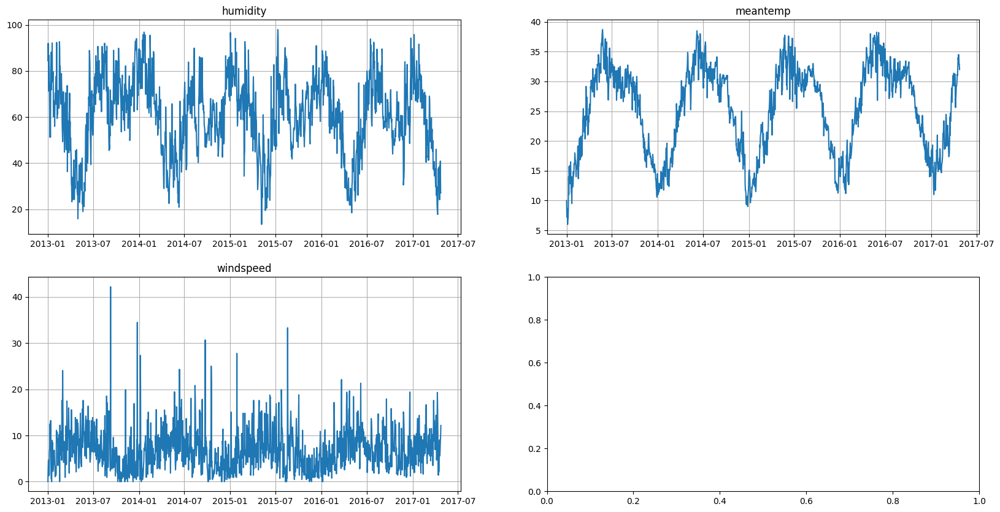

In [ ]:
ts.plot()

In [ ]:
model = NaiveModel(lag = 365)
train_ts, test_ts = ts.train_test_split(
    train_start = '2013-01-01',
    train_end = '2017-01-01',
    test_start = '2017-01-02',
    test_end = '2017-04-24'
)
model.fit(train_ts)

NaiveModel(lag = 365, )

In [ ]:
HORIZON = 113
future_ts = train_ts.make_future(HORIZON, tail_steps = model.context_size)
forecast_ts = model.forecast(future_ts, prediction_size = HORIZON)

In [ ]:

test_ts


segment,humidity,meantemp,windspeed
feature,target,target,target
timestamp,,,
2017-01-02,77.222222,18.500000,2.894444
2017-01-03,81.888889,17.111111,4.016667
2017-01-04,70.050000,18.700000,4.545000
2017-01-05,74.944444,18.388889,3.300000
2017-01-06,79.318182,19.318182,8.681818
...,...,...,...
2017-04-20,27.500000,34.500000,5.562500
2017-04-21,39.375000,34.250000,6.962500


In [ ]:
forecast_ts

segment,humidity,meantemp,windspeed
feature,target,target,target
timestamp,,,
2017-01-02,74.750000,14.375000,5.112500
2017-01-03,77.125000,15.750000,0.000000
2017-01-04,88.833333,15.833333,0.616667
2017-01-05,81.625000,17.375000,2.312500
2017-01-06,87.000000,17.125000,0.000000
...,...,...,...
2017-04-20,25.937500,34.062500,14.018750
2017-04-21,24.666667,34.000000,15.750000


In [ ]:
smape(y_true = test_ts, y_pred = forecast_ts)

{'humidity': 17.751684261546625,
 'meantemp': 13.102552616260605,
 'windspeed': 67.96885050504105}

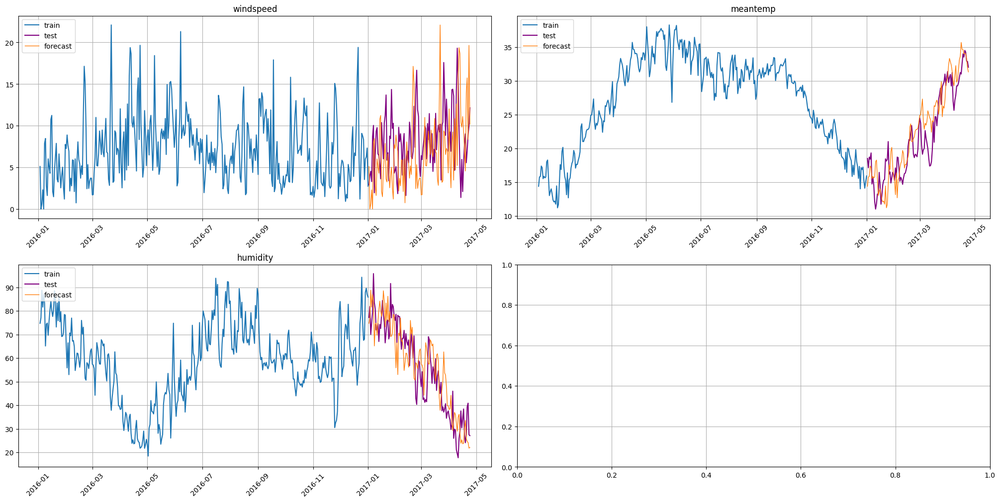

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples = 365)

In [ ]:
model = MovingAverageModel(window = 150)

In [ ]:
model.fit(train_ts)

MovingAverageModel(window = 150, )

In [ ]:
future_ts = train_ts.make_future(HORIZON, tail_steps = model.context_size)
forecast_ts = model.forecast(future_ts, prediction_size = HORIZON)

In [ ]:
smape(y_true = test_ts, y_pred = forecast_ts)

{'humidity': 31.299148772135304,
 'meantemp': 31.322904058115064,
 'windspeed': 40.48179848031898}

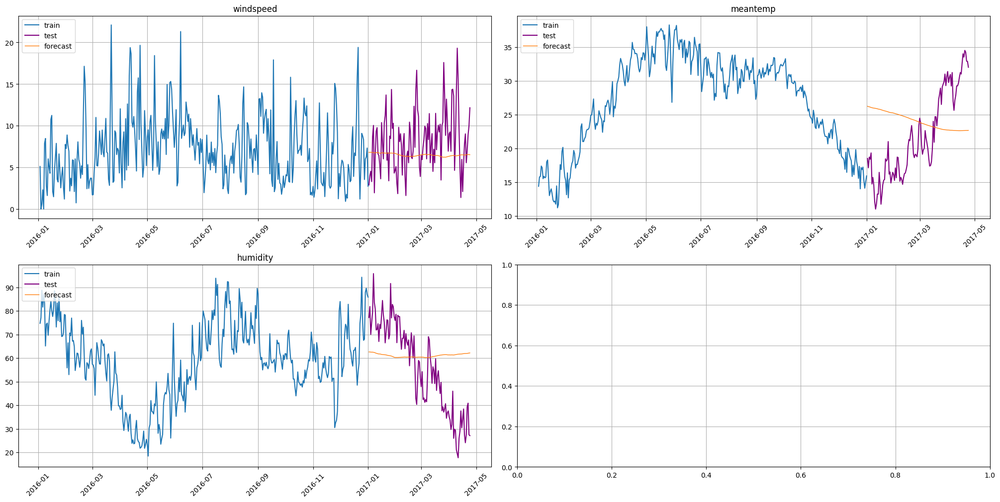

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples = 365)

#**Лабораторное занятие 3**

In [ ]:
!wget 'https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download' -O monthly_australian_wine_sales.csv
!wget 'https://drive.usercontent.google.com/u/0/uc?id=1mjsrJvL6yNerYgFIWAEwmk1G8RjXylQx&export=download' -O example_dataset.csv

--2024-03-25 11:06:27--  https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.135.132, 2607:f8b0:400e:c09::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.135.132|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-03-25 11:06:27--  https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-03-25 11:06:27--  https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing exi

In [ ]:
from etna.transforms import MeanTransform, LagTransform
from etna.analysis import plot_feature_relevance, ModelRelevanceTable
from etna.models import CatBoostPerSegmentModel, CatBoostMultiSegmentModel

In [ ]:
df = pd.read_csv('monthly_australian_wine_sales.csv')
df.head()

df['timestamp'] = pd.to_datetime(df['month'])
df['target'] = df['sales']
df.drop(columns=['month', 'sales'], inplace = True)
df['segment'] = 'main'
df.head()

,timestamp,target,segment
0,1980-01-01,15136,main
1,1980-02-01,16733,main
2,1980-03-01,20016,main
3,1980-04-01,17708,main
4,1980-05-01,18019,main


In [ ]:
dff = TSDataset.to_dataset(df)

In [ ]:
ts = TSDataset(dff, freq = "MS")

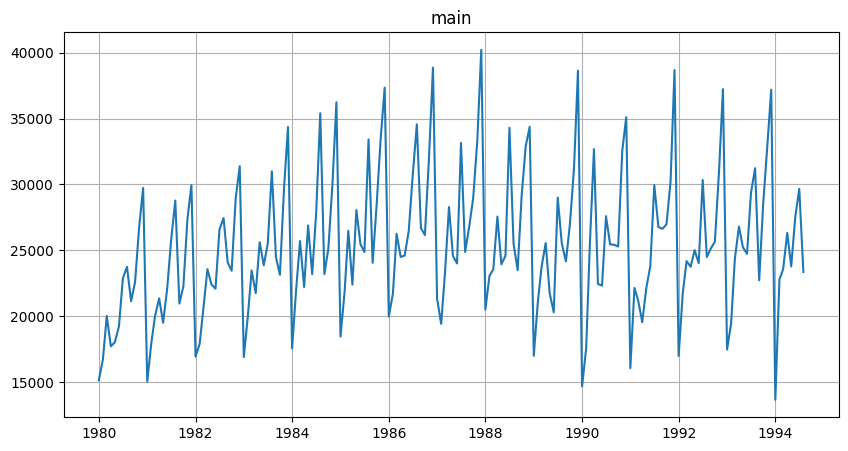

In [ ]:
ts.plot()

In [ ]:
HORIZON = 8

In [ ]:
train_ts, test_ts = ts.train_test_split(
    train_start = '1980-01-01',
    train_end = '1993-08-01',
    test_start = '1994-01-01',
    test_end = '1994-08-01'

)

train_ts, valid_ts = ts.train_test_split(
    train_start = '1980-01-01',
    train_end = '1993-04-01',
    test_start = '1993-05-01',
    test_end = '1993-12-01'
)



In [ ]:
train_ts

segment,main
feature,target
timestamp,
1980-01-01,15136
1980-02-01,16733
1980-03-01,20016
1980-04-01,17708
1980-05-01,18019
...,...
1992-12-01,37240
1993-01-01,17466


In [ ]:
test_ts

segment,main
feature,target
timestamp,
1994-01-01,13652
1994-02-01,22784
1994-03-01,23565
1994-04-01,26323
1994-05-01,23779
1994-06-01,27549
1994-07-01,29660
1994-08-01,23356


In [ ]:
valid_ts

segment,main
feature,target
timestamp,
1993-05-01,25236
1993-06-01,24735
1993-07-01,29356
1993-08-01,31234
1993-09-01,22724
1993-10-01,28496
1993-11-01,32857
1993-12-01,37198


In [ ]:
mean8 = MeanTransform(
    in_column = 'target',
    window = 8,
    out_column = 'mean_08'
)

In [ ]:
lags = LagTransform(
    in_column = 'target',
    lags = list(range(8,24,1)),
    out_column = 'lag'
)

In [ ]:
train_ts.fit_transform((lags, mean8))
train_ts

segment        main                                                        \
feature      lag_10   lag_11   lag_12   lag_13   lag_14   lag_15   lag_16   
timestamp                                                                   
1980-01-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-02-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-03-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-04-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-05-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
...             ...      ...      ...      ...      ...      ...      ...   
1992-12-01  21697.0  16974.0  38687.0  30207.0  26972.0  26635.0  26773.0   
1993-01-01  24179.0  21697.0  16974.0  38687.0  30207.0  26972.0  26635.0   
1993-02-01  23757.0  24179.0  21697.0  16974.0  38687.0  30207.0  26972.0   
1993-03-01  25013.0  23757.0  24179.0  21697.0  16974.0  38687.0  30207.0   
1993-04-01  24019.0  25013.0  23757.0  24179.0  21697.0  16974.0  38687.0   

segment                                                                    \
feature      lag_17   lag_18   lag_19   lag_20   lag_21   lag_22   lag_23   
timestamp                                                                   
1980-01-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-02-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-03-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-04-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
1980-05-01      NaN      NaN      NaN      NaN      NaN      NaN      NaN   
...             ...      ...      ...      ...      ...      ...      ...   
1992-12-01  29961.0  23816.0  22084.0  19543.0  21198.0  22146.0  16052.0   
1993-01-01  26773.0  29961.0  23816.0  22084.0  19543.0  21198.0  22146.0   
1993-02-01  26635.0  26773.0  29961.0  23816.0  22084.0  19543.0  21198.0   
1993-03-01  26972.0  26635.0  26773.0  29961.0  23816.0  22084.0  19543.0   
1993-04-01  30207.0  26972.0  26635.0  26773.0  29961.0  23816.0  22084.0   

segment                                         
feature       lag_8    lag_9    mean_08 target  
timestamp                                       
1980-01-01      NaN      NaN  15136.000  15136  
1980-02-01      NaN      NaN  15934.500  16733  
1980-03-01      NaN      NaN  17295.000  20016  
1980-04-01      NaN      NaN  17398.250  17708  
1980-05-01      NaN      NaN  17522.400  18019  
...             ...      ...        ...    ...  
1992-12-01  23757.0  24179.0  27854.250  37240  
1993-01-01  25013.0  23757.0  26910.875  17466  
1993-02-01  24019.0  25013.0  26341.375  19463  
1993-03-01  30345.0  24019.0  25592.250  24352  
1993-04-01  24488.0  30345.0  25881.875  26805  

[160 rows x 18 columns]

In [ ]:
train_ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
main,1980-01-01,1993-04-01,160,0,1,17,16,0,MS


In [ ]:
from sklearn.ensemble import RandomForestRegressor

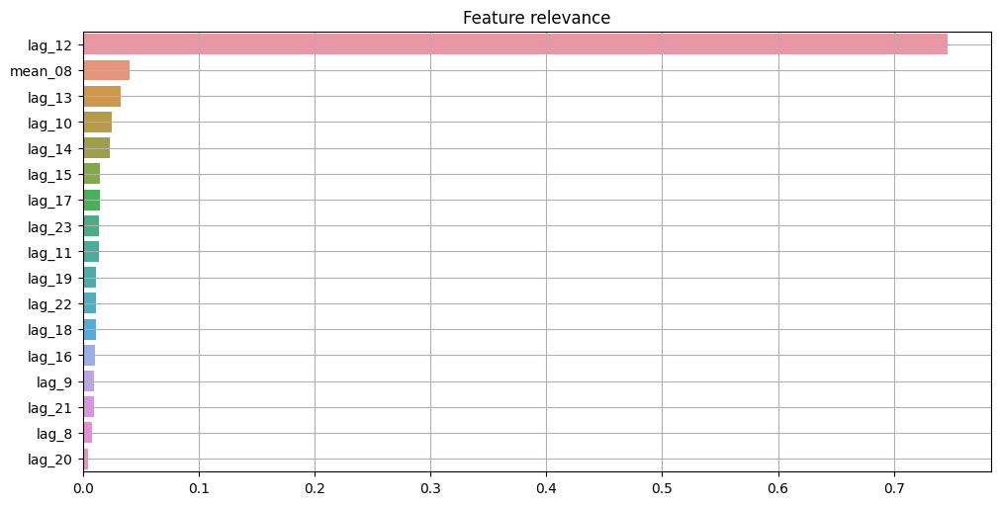

In [ ]:
plot_feature_relevance(
    ts = train_ts,
    relevance_table = ModelRelevanceTable(),
    normalized = True,
    top_k = 20,
    relevance_params = dict(model = RandomForestRegressor(n_estimators = 100))
    )

In [ ]:
model = CatBoostMultiSegmentModel(loss_function = 'MAE',
                                  n_estimators = 600,
                                  learning_rate = 0.05,
                                  depth = 9,
                                  random_seed = 42)

In [ ]:
model.fit(train_ts)

CatBoostMultiSegmentModel(iterations = None, depth = 9, learning_rate = 0.05, logging_level = 'Silent', l2_leaf_reg = None, thread_count = None, loss_function = 'MAE', n_estimators = 600, random_seed = 42, )

In [ ]:
future_ts = train_ts.make_future(
    HORIZON,
    transforms = (lags, mean8)
)
future_ts

segment        main                                                        \
feature      lag_10   lag_11   lag_12   lag_13   lag_14   lag_15   lag_16   
timestamp                                                                   
1993-05-01  30345.0  24019.0  25013.0  23757.0  24179.0  21697.0  16974.0   
1993-06-01  24488.0  30345.0  24019.0  25013.0  23757.0  24179.0  21697.0   
1993-07-01  25156.0  24488.0  30345.0  24019.0  25013.0  23757.0  24179.0   
1993-08-01  25650.0  25156.0  24488.0  30345.0  24019.0  25013.0  23757.0   
1993-09-01  30923.0  25650.0  25156.0  24488.0  30345.0  24019.0  25013.0   
1993-10-01  37240.0  30923.0  25650.0  25156.0  24488.0  30345.0  24019.0   
1993-11-01  17466.0  37240.0  30923.0  25650.0  25156.0  24488.0  30345.0   
1993-12-01  19463.0  17466.0  37240.0  30923.0  25650.0  25156.0  24488.0   

segment                                                                    \
feature      lag_17   lag_18   lag_19   lag_20   lag_21   lag_22   lag_23   
timestamp                                                                   
1993-05-01  38687.0  30207.0  26972.0  26635.0  26773.0  29961.0  23816.0   
1993-06-01  16974.0  38687.0  30207.0  26972.0  26635.0  26773.0  29961.0   
1993-07-01  21697.0  16974.0  38687.0  30207.0  26972.0  26635.0  26773.0   
1993-08-01  24179.0  21697.0  16974.0  38687.0  30207.0  26972.0  26635.0   
1993-09-01  23757.0  24179.0  21697.0  16974.0  38687.0  30207.0  26972.0   
1993-10-01  25013.0  23757.0  24179.0  21697.0  16974.0  38687.0  30207.0   
1993-11-01  24019.0  25013.0  23757.0  24179.0  21697.0  16974.0  38687.0   
1993-12-01  30345.0  24019.0  25013.0  23757.0  24179.0  21697.0  16974.0   

segment                                            
feature       lag_8    lag_9       mean_08 target  
timestamp                                          
1993-05-01  25156.0  24488.0  25985.571429    NaN  
1993-06-01  25650.0  25156.0  26041.500000    NaN  
1993-07-01  30923.0  25650.0  25065.200000    NaN  
1993-08-01  37240.0  30923.0  22021.500000    NaN  
1993-09-01  17466.0  37240.0  23540.000000    NaN  
1993-10-01  19463.0  17466.0  25578.500000    NaN  
1993-11-01  24352.0  19463.0  26805.000000    NaN  
1993-12-01  26805.0  24352.0      0.000000    NaN

In [ ]:
forecast_ts = model.forecast(future_ts)

In [ ]:
forecast_ts

segment        main                                                        \
feature      lag_10   lag_11   lag_12   lag_13   lag_14   lag_15   lag_16   
timestamp                                                                   
1993-05-01  30345.0  24019.0  25013.0  23757.0  24179.0  21697.0  16974.0   
1993-06-01  24488.0  30345.0  24019.0  25013.0  23757.0  24179.0  21697.0   
1993-07-01  25156.0  24488.0  30345.0  24019.0  25013.0  23757.0  24179.0   
1993-08-01  25650.0  25156.0  24488.0  30345.0  24019.0  25013.0  23757.0   
1993-09-01  30923.0  25650.0  25156.0  24488.0  30345.0  24019.0  25013.0   
1993-10-01  37240.0  30923.0  25650.0  25156.0  24488.0  30345.0  24019.0   
1993-11-01  17466.0  37240.0  30923.0  25650.0  25156.0  24488.0  30345.0   
1993-12-01  19463.0  17466.0  37240.0  30923.0  25650.0  25156.0  24488.0   

segment                                                                    \
feature      lag_17   lag_18   lag_19   lag_20   lag_21   lag_22   lag_23   
timestamp                                                                   
1993-05-01  38687.0  30207.0  26972.0  26635.0  26773.0  29961.0  23816.0   
1993-06-01  16974.0  38687.0  30207.0  26972.0  26635.0  26773.0  29961.0   
1993-07-01  21697.0  16974.0  38687.0  30207.0  26972.0  26635.0  26773.0   
1993-08-01  24179.0  21697.0  16974.0  38687.0  30207.0  26972.0  26635.0   
1993-09-01  23757.0  24179.0  21697.0  16974.0  38687.0  30207.0  26972.0   
1993-10-01  25013.0  23757.0  24179.0  21697.0  16974.0  38687.0  30207.0   
1993-11-01  24019.0  25013.0  23757.0  24179.0  21697.0  16974.0  38687.0   
1993-12-01  30345.0  24019.0  25013.0  23757.0  24179.0  21697.0  16974.0   

segment                                                   
feature       lag_8    lag_9       mean_08        target  
timestamp                                                 
1993-05-01  25156.0  24488.0  25985.571429  24397.784607  
1993-06-01  25650.0  25156.0  26041.500000  24468.180414  
1993-07-01  30923.0  25650.0  25065.200000  29486.358038  
1993-08-01  37240.0  30923.0  22021.500000  25610.674932  
1993-09-01  17466.0  37240.0  23540.000000  25678.835218  
1993-10-01  19463.0  17466.0  25578.500000  26956.092037  
1993-11-01  24352.0  19463.0  26805.000000  31476.207918  
1993-12-01  26805.0  24352.0      0.000000  31400.839115

In [ ]:
smape = SMAPE()
smape(y_true = valid_ts, y_pred = forecast_ts)

{'main': 7.955966593676093}

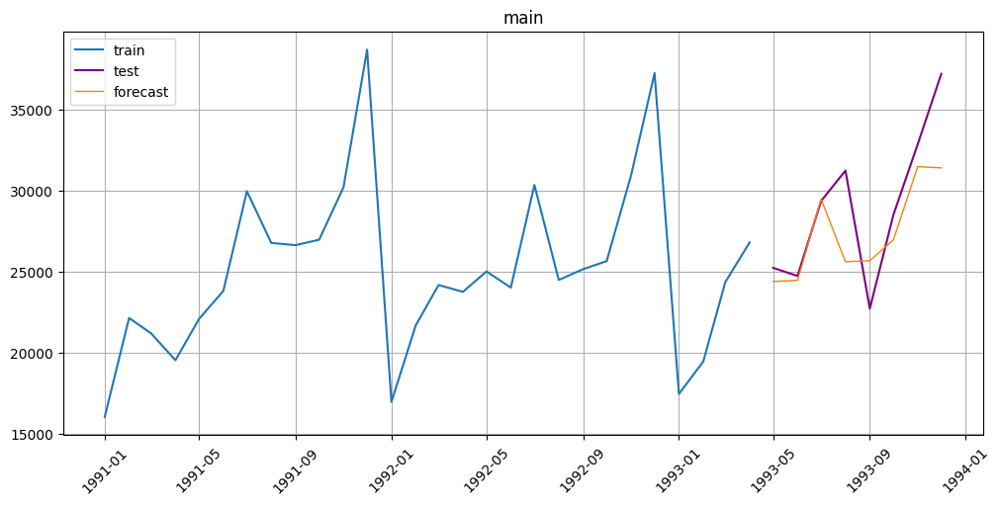

In [ ]:
plot_forecast(forecast_ts, valid_ts, train_ts, n_train_samples = 28)

In [ ]:
train_ts, valid_ts = ts.train_test_split(
    train_start = '1980-01-01',
    train_end = '1993-04-01',
    test_start = '1993-05-01',
    test_end = '1993-12-01'
)

In [ ]:
lags2 = LagTransform(
    in_column = 'target',
    lags = list(range(8,13,1)),
    out_column = 'lag'
)

In [ ]:
from etna.pipeline import Pipeline

In [ ]:
pipeline = Pipeline(
    model = model,
    transforms = (lags2, mean8),
    horizon = HORIZON
)

In [ ]:
pipeline.fit(train_ts)

Pipeline(model = CatBoostMultiSegmentModel(iterations = None, depth = 9, learning_rate = 0.05, logging_level = 'Silent', l2_leaf_reg = None, thread_count = None, loss_function = 'MAE', n_estimators = 600, random_seed = 42, ), transforms = (LagTransform(in_column = 'target', lags = [8, 9, 10, 11, 12], out_column = 'lag', ), MeanTransform(in_column = 'target', window = 8, seasonality = 1, alpha = 1, min_periods = 1, fillna = 0, out_column = 'mean_08', )), horizon = 8, )

In [ ]:
forecast_ts = pipeline.forecast()

In [ ]:
smape(y_true = valid_ts, y_pred = forecast_ts)

{'main': 10.204354075542287}

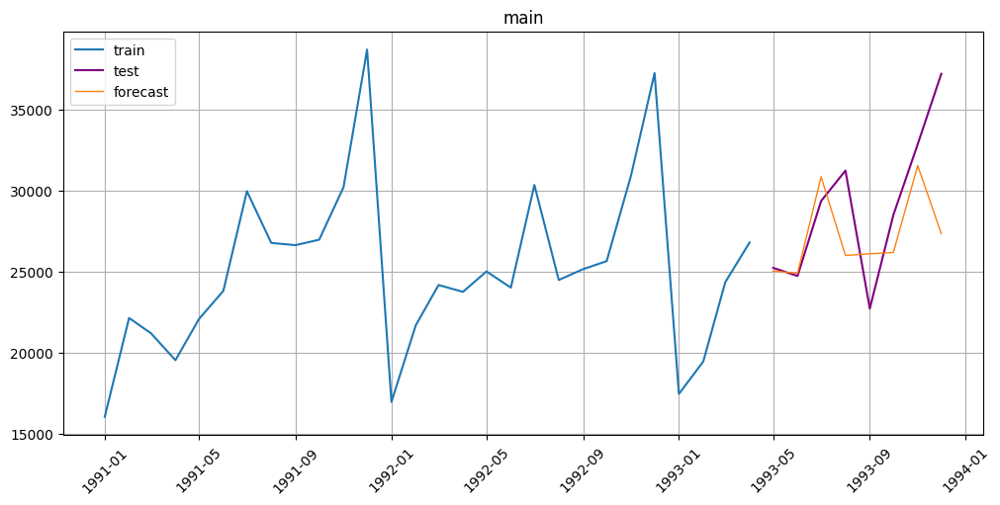

In [ ]:
plot_forecast(forecast_ts, valid_ts, train_ts, n_train_samples = 28)

## РГР

In [ ]:
!wget 'https://drive.usercontent.google.com/uc?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download' -O DelhiClimate.csv
!pip install etna

import pandas as pd
from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast
df = pd.read_csv('DelhiClimate.csv', index_col=[0])

--2024-03-24 21:03:48--  https://drive.usercontent.google.com/uc?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 74.125.196.132, 2607:f8b0:400c:c36::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|74.125.196.132|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download [following]
--2024-03-24 21:03:48--  https://drive.usercontent.google.com/download?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 90127 (88K) [application/octet-stream]
Saving to: ‘DelhiClimate.csv’

DelhiClimate.csv    100%[===================>]  88.01K  --.-KB/s    in 0.001s  

2024-03-24 21:03:49 (76.3 MB/s) - ‘DelhiClimate.csv’ saved [90127/90127]



/usr/local/lib/python3.10/dist-packages/etna/settings.py:37: UserWarning: etna[torch] is not available, to install it, run `pip install etna[torch]`
  warnings.warn("etna[torch] is not available, to install it, run `pip install etna[torch]`")
/usr/local/lib/python3.10/dist-packages/etna/settings.py:45: UserWarning: wandb is not available, to install it, run `pip install etna[wandb]`
  warnings.warn("wandb is not available, to install it, run `pip install etna[wandb]`")
/usr/local/lib/python3.10/dist-packages/etna/settings.py:62: UserWarning: etna[classification] is not available, to install it, run `pip install etna[classification]`
  warnings.warn("etna[classification] is not available, to install it, run `pip install etna[classification]`")
/usr/local/lib/python3.10/dist-packages/etna/settings.py:71: UserWarning: etna[auto] is not available, to install it, run `pip install etna[auto]`
  warnings.warn("etna[auto] is not available, to install it, run `pip install etna[auto]`")
/usr/loc

In [ ]:
df.drop(index = 1461, inplace = True)
df1 = df.drop(columns = ['humidity', 'wind_speed', 'meanpressure'])
df2 = df.drop(columns = ['meantemp', 'wind_speed', 'meanpressure'])
df3 = df.drop(columns = ['humidity', 'meantemp', 'meanpressure'])
#df4 = df.drop(columns = ['humidity', 'wind_speed', 'meantemp'])
df1['segment'] = 'meantemp'
df2['segment'] = 'humidity'
df3['segment'] = 'windspeed'
#df4['segment'] = 'meanpressure'
df1.rename(columns={"meantemp": "target"}, inplace = True)
df2.rename(columns={"humidity": "target"}, inplace = True)
df3.rename(columns={"wind_speed": "target"}, inplace = True)
#df4.rename(columns={"meanpressure": "target"}, inplace = True)
df5 = pd.concat([df1, df2, df3])
df5.rename(columns={"date": "timestamp"}, inplace = True)
df5['timestamp'] = pd.to_datetime(df5['timestamp'])

In [ ]:
df6 = TSDataset.to_dataset(df5)

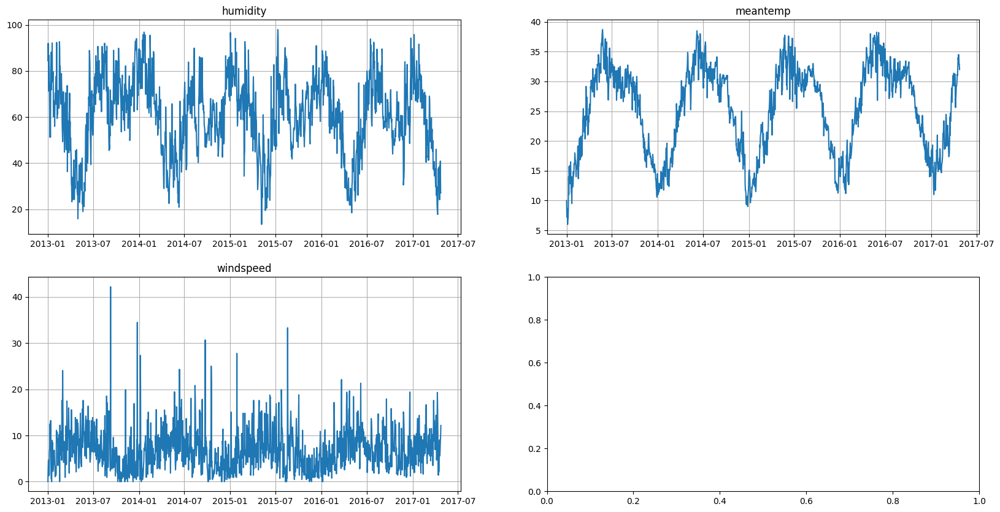

In [ ]:
ts = TSDataset(df6, 'D')
ts.plot()

In [ ]:
from etna.models import NaiveModel
HORIZON = 365
train_ts, test_ts = ts.train_test_split(test_size=HORIZON)
train_ts, valid_ts = train_ts.train_test_split(test_size=HORIZON)

In [ ]:
from etna.transforms import MeanTransform, LagTransform

mean8 = MeanTransform(
    in_column='target',
    window=365,
    out_column='mean_08'
)

lags = LagTransform(
    in_column='target',
    lags = list(range(128,365,1)),
    out_column='lag'
)

In [ ]:
train_ts.fit_transform([lags,mean8])
train_ts

segment    humidity                                                        \
feature     lag_128 lag_129 lag_130 lag_131 lag_132    lag_133    lag_134   
timestamp                                                                   
2013-01-01      NaN     NaN     NaN     NaN     NaN        NaN        NaN   
2013-01-02      NaN     NaN     NaN     NaN     NaN        NaN        NaN   
2013-01-03      NaN     NaN     NaN     NaN     NaN        NaN        NaN   
2013-01-04      NaN     NaN     NaN     NaN     NaN        NaN        NaN   
2013-01-05      NaN     NaN     NaN     NaN     NaN        NaN        NaN   
...             ...     ...     ...     ...     ...        ...        ...   
2015-04-21   86.625  71.875  65.625  70.500  65.500  67.571429  49.875000   
2015-04-22   75.750  86.625  71.875  65.625  70.500  65.500000  67.571429   
2015-04-23   72.375  75.750  86.625  71.875  65.625  70.500000  65.500000   
2015-04-24   72.125  72.375  75.750  86.625  71.875  65.625000  70.500000   
2015-04-25   79.750  72.125  72.375  75.750  86.625  71.875000  65.625000   

segment                                      ... windspeed                    \
feature       lag_135    lag_136    lag_137  ...   lag_357  lag_358  lag_359   
timestamp                                    ...                               
2013-01-01        NaN        NaN        NaN  ...       NaN      NaN      NaN   
2013-01-02        NaN        NaN        NaN  ...       NaN      NaN      NaN   
2013-01-03        NaN        NaN        NaN  ...       NaN      NaN      NaN   
2013-01-04        NaN        NaN        NaN  ...       NaN      NaN      NaN   
2013-01-05        NaN        NaN        NaN  ...       NaN      NaN      NaN   
...               ...        ...        ...  ...       ...      ...      ...   
2015-04-21  48.375000  48.875000  59.875000  ...    8.3250  10.1875   8.3500   
2015-04-22  49.875000  48.375000  48.875000  ...    5.3375   8.3250  10.1875   
2015-04-23  67.571429  49.875000  48.375000  ...    9.7375   5.3375   8.3250   
2015-04-24  65.500000  67.571429  49.875000  ...    6.4875   9.7375   5.3375   
2015-04-25  70.500000  65.500000  67.571429  ...    6.4750   6.4875   9.7375   

segment                                                                      
feature     lag_360  lag_361  lag_362 lag_363  lag_364   mean_08     target  
timestamp                                                                    
2013-01-01      NaN      NaN      NaN     NaN      NaN  0.000000   0.000000  
2013-01-02      NaN      NaN      NaN     NaN      NaN  1.490000   2.980000  
2013-01-03      NaN      NaN      NaN     NaN      NaN  2.537778   4.633333  
2013-01-04      NaN      NaN      NaN     NaN      NaN  2.211667   1.233333  
2013-01-05      NaN      NaN      NaN     NaN      NaN  2.509333   3.700000  
...             ...      ...      ...     ...      ...       ...        ...  
2015-04-21   8.1125   8.1125   7.8750  6.0250  12.5000  6.663097  11.112500  
2015-04-22   8.3500   8.1125   8.1125  7.8750   6.0250  6.659946  11.350000  
2015-04-23  10.1875   8.3500   8.1125  8.1125   7.8750  6.665631   8.100000  
2015-04-24   8.3250  10.1875   8.3500  8.1125   8.1125  6.651042   2.550000  
2015-04-25   5.3375   8.3250  10.1875  8.3500   8.1125  6.664364  12.975000  

[845 rows x 717 columns]

In [ ]:
train_ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
humidity,2013-01-01,2015-04-25,845,0,3,238,237,0,D
meantemp,2013-01-01,2015-04-25,845,0,3,238,237,0,D
windspeed,2013-01-01,2015-04-25,845,0,3,238,237,0,D


In [ ]:
from etna.analysis import plot_feature_relevance, ModelRelevanceTable
from sklearn.ensemble import RandomForestRegressor

/usr/local/lib/python3.10/dist-packages/etna/analysis/feature_relevance/relevance_table.py:33: UserWarning: Exogenous or target data contains None! It will be dropped for calculating relevance.
  warnings.warn("Exogenous or target data contains None! It will be dropped for calculating relevance.")
/usr/local/lib/python3.10/dist-packages/etna/analysis/feature_relevance/relevance_table.py:33: UserWarning: Exogenous or target data contains None! It will be dropped for calculating relevance.
  warnings.warn("Exogenous or target data contains None! It will be dropped for calculating relevance.")
/usr/local/lib/python3.10/dist-packages/etna/analysis/feature_relevance/relevance_table.py:33: UserWarning: Exogenous or target data contains None! It will be dropped for calculating relevance.
  warnings.warn("Exogenous or target data contains None! It will be dropped for calculating relevance.")


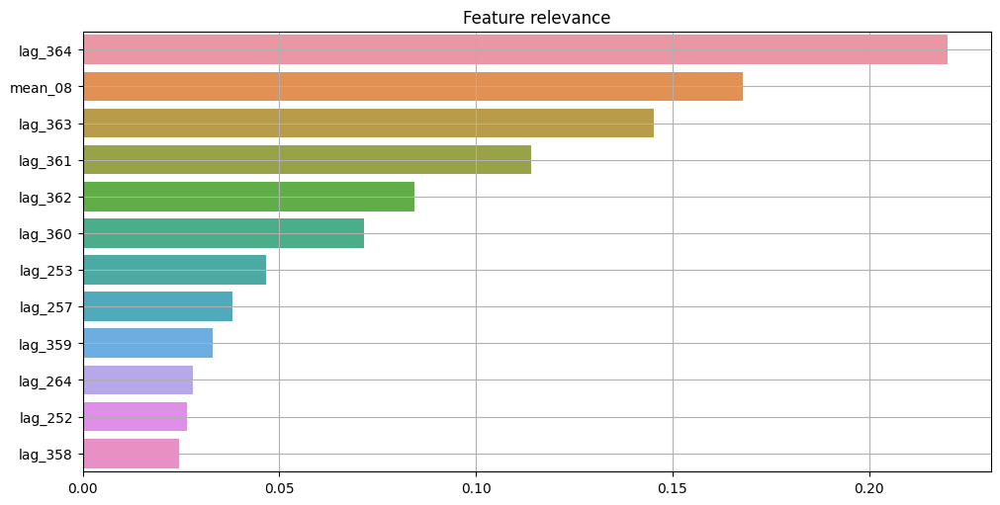

In [ ]:
plot_feature_relevance(
    ts=train_ts,
    relevance_table = ModelRelevanceTable(),
    normalized = True,
    top_k=12,
    relevance_params=dict(model=RandomForestRegressor(n_estimators=100))
)

In [ ]:
from etna.models import CatBoostPerSegmentModel, CatBoostMultiSegmentModel

In [ ]:
model = CatBoostMultiSegmentModel(loss_function='MAE',
                                  n_estimators=600,
                                  learning_rate=0.05,
                                  depth=9,
                                  random_seed=42
                                  )

In [ ]:
model.fit(train_ts)

CatBoostMultiSegmentModel(iterations = None, depth = 9, learning_rate = 0.05, logging_level = 'Silent', l2_leaf_reg = None, thread_count = None, loss_function = 'MAE', n_estimators = 600, random_seed = 42, )

In [ ]:
future_ts = train_ts.make_future(
    HORIZON,
    transforms=[lags,mean8]
)
future_ts

/usr/local/lib/python3.10/dist-packages/etna/datasets/tsdataset.py:282: FutureWarning: Argument `closed` is deprecated in favor of `inclusive`.
  future_dates = pd.date_range(


segment    humidity                                                          \
feature     lag_128 lag_129 lag_130 lag_131 lag_132 lag_133 lag_134 lag_135   
timestamp                                                                     
2015-04-26   81.750  79.750  72.125  72.375  75.750  86.625  71.875  65.625   
2015-04-27   77.000  81.750  79.750  72.125  72.375  75.750  86.625  71.875   
2015-04-28   79.125  77.000  81.750  79.750  72.125  72.375  75.750  86.625   
2015-04-29   85.000  79.125  77.000  81.750  79.750  72.125  72.375  75.750   
2015-04-30   78.625  85.000  79.125  77.000  81.750  79.750  72.125  72.375   
...             ...     ...     ...     ...     ...     ...     ...     ...   
2016-04-20      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-21      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-22      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-23      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-24      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

segment                     ...  windspeed                              \
feature    lag_136 lag_137  ...    lag_357   lag_358   lag_359 lag_360   
timestamp                   ...                                          
2015-04-26  70.500  65.500  ...   5.800000  6.475000  6.487500  9.7375   
2015-04-27  65.625  70.500  ...   9.037500  5.800000  6.475000  6.4875   
2015-04-28  71.875  65.625  ...   6.885714  9.037500  5.800000  6.4750   
2015-04-29  86.625  71.875  ...   1.850000  6.885714  9.037500  5.8000   
2015-04-30  75.750  86.625  ...  10.662500  1.850000  6.885714  9.0375   
...            ...     ...  ...        ...       ...       ...     ...   
2016-04-20     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-21     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-22     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-23     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-24     NaN     NaN  ...        NaN       NaN       NaN     NaN   

segment                                                           
feature     lag_361  lag_362  lag_363  lag_364    mean_08 target  
timestamp                                                         
2015-04-26   5.3375   8.3250  10.1875   8.3500   6.660385    NaN  
2015-04-27   9.7375   5.3375   8.3250  10.1875   6.655731    NaN  
2015-04-28   6.4875   9.7375   5.3375   8.3250   6.645975    NaN  
2015-04-29   6.4750   6.4875   9.7375   5.3375   6.641324    NaN  
2015-04-30   5.8000   6.4750   6.4875   9.7375   6.644945    NaN  
...             ...      ...      ...      ...        ...    ...  
2016-04-20  12.9750   2.5500   8.1000  11.3500   8.743750    NaN  
2016-04-21      NaN  12.9750   2.5500   8.1000   7.875000    NaN  
2016-04-22      NaN      NaN  12.9750   2.5500   7.762500    NaN  
2016-04-23      NaN      NaN      NaN  12.9750  12.975000    NaN  
2016-04-24      NaN      NaN      NaN      NaN   0.000000    NaN  

[365 rows x 717 columns]

In [ ]:
forecast_ts=model.forecast(future_ts)

In [ ]:
forecast_ts

segment    humidity                                                          \
feature     lag_128 lag_129 lag_130 lag_131 lag_132 lag_133 lag_134 lag_135   
timestamp                                                                     
2015-04-26   81.750  79.750  72.125  72.375  75.750  86.625  71.875  65.625   
2015-04-27   77.000  81.750  79.750  72.125  72.375  75.750  86.625  71.875   
2015-04-28   79.125  77.000  81.750  79.750  72.125  72.375  75.750  86.625   
2015-04-29   85.000  79.125  77.000  81.750  79.750  72.125  72.375  75.750   
2015-04-30   78.625  85.000  79.125  77.000  81.750  79.750  72.125  72.375   
...             ...     ...     ...     ...     ...     ...     ...     ...   
2016-04-20      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-21      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-22      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-23      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
2016-04-24      NaN     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

segment                     ...  windspeed                              \
feature    lag_136 lag_137  ...    lag_357   lag_358   lag_359 lag_360   
timestamp                   ...                                          
2015-04-26  70.500  65.500  ...   5.800000  6.475000  6.487500  9.7375   
2015-04-27  65.625  70.500  ...   9.037500  5.800000  6.475000  6.4875   
2015-04-28  71.875  65.625  ...   6.885714  9.037500  5.800000  6.4750   
2015-04-29  86.625  71.875  ...   1.850000  6.885714  9.037500  5.8000   
2015-04-30  75.750  86.625  ...  10.662500  1.850000  6.885714  9.0375   
...            ...     ...  ...        ...       ...       ...     ...   
2016-04-20     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-21     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-22     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-23     NaN     NaN  ...        NaN       NaN       NaN     NaN   
2016-04-24     NaN     NaN  ...        NaN       NaN       NaN     NaN   

segment                                                              
feature     lag_361  lag_362  lag_363  lag_364    mean_08    target  
timestamp                                                            
2015-04-26   5.3375   8.3250  10.1875   8.3500   6.660385  8.569042  
2015-04-27   9.7375   5.3375   8.3250  10.1875   6.655731  7.926523  
2015-04-28   6.4875   9.7375   5.3375   8.3250   6.645975  8.207053  
2015-04-29   6.4750   6.4875   9.7375   5.3375   6.641324  6.334190  
2015-04-30   5.8000   6.4750   6.4875   9.7375   6.644945  7.346374  
...             ...      ...      ...      ...        ...       ...  
2016-04-20  12.9750   2.5500   8.1000  11.3500   8.743750  8.188185  
2016-04-21      NaN  12.9750   2.5500   8.1000   7.875000  7.679935  
2016-04-22      NaN      NaN  12.9750   2.5500   7.762500  7.392154  
2016-04-23      NaN      NaN      NaN  12.9750  12.975000  7.584548  
2016-04-24      NaN      NaN      NaN      NaN   0.000000  7.308737  

[365 rows x 717 columns]

In [ ]:
smape = SMAPE()
smape(y_true=valid_ts, y_pred=forecast_ts)

{'humidity': 49.66957550207552,
 'meantemp': 25.110527629444768,
 'windspeed': 66.62692983774924}

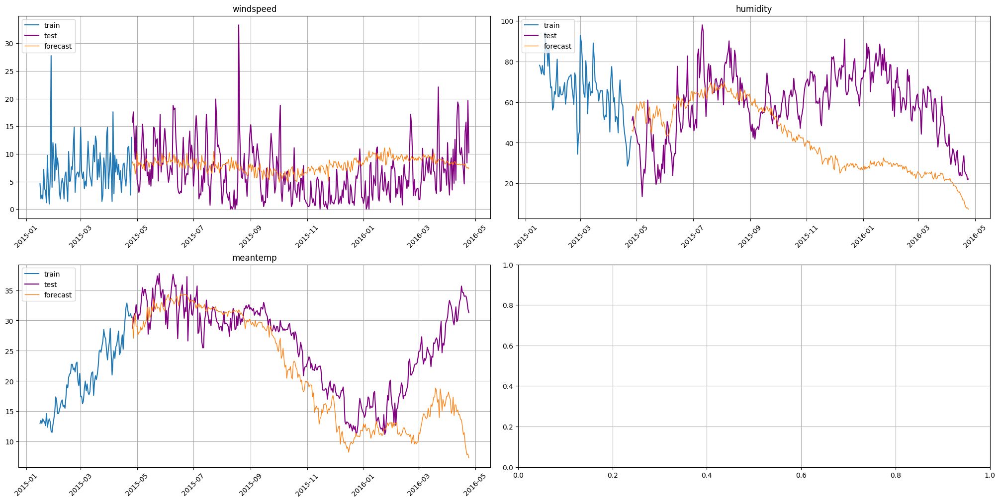

In [ ]:
plot_forecast(forecast_ts, valid_ts, train_ts, n_train_samples=100)

In [ ]:
train_ts, valid_ts = train_ts.train_test_split(test_size=HORIZON)

In [ ]:
lags2 = LagTransform(
    in_column='target',
    lags = list(range(365,460,1)),
    out_column='lag'
)

In [ ]:
from etna.pipeline import Pipeline

In [ ]:
pipeline = Pipeline(
    model=model,
    transforms = [lags2, mean8],
    horizon=HORIZON
    )

In [ ]:
pipeline.fit(train_ts)

Pipeline(model = CatBoostMultiSegmentModel(iterations = None, depth = 9, learning_rate = 0.05, logging_level = 'Silent', l2_leaf_reg = None, thread_count = None, loss_function = 'MAE', n_estimators = 600, random_seed = 42, ), transforms = [LagTransform(in_column = 'target', lags = [365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384, 385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 422, 423, 424, 425, 426, 427, 428, 429, 430, 431, 432, 433, 434, 435, 436, 437, 438, 439, 440, 441, 442, 443, 444, 445, 446, 447, 448, 449, 450, 451, 452, 453, 454, 455, 456, 457, 458, 459], out_column = 'lag', ), MeanTransform(in_column = 'target', window = 365, seasonality = 1, alpha = 1, min_periods = 1, fillna = 0, out_column = 'mean_08', )], horizon = 365, )

In [ ]:
forecast_ts = pipeline.forecast()

/usr/local/lib/python3.10/dist-packages/etna/datasets/tsdataset.py:282: FutureWarning: Argument `closed` is deprecated in favor of `inclusive`.
  future_dates = pd.date_range(


In [ ]:
smape(y_true=valid_ts, y_pred=forecast_ts)

{'humidity': 42.56416275650345,
 'meantemp': 23.913913957717277,
 'windspeed': 75.33847743722167}

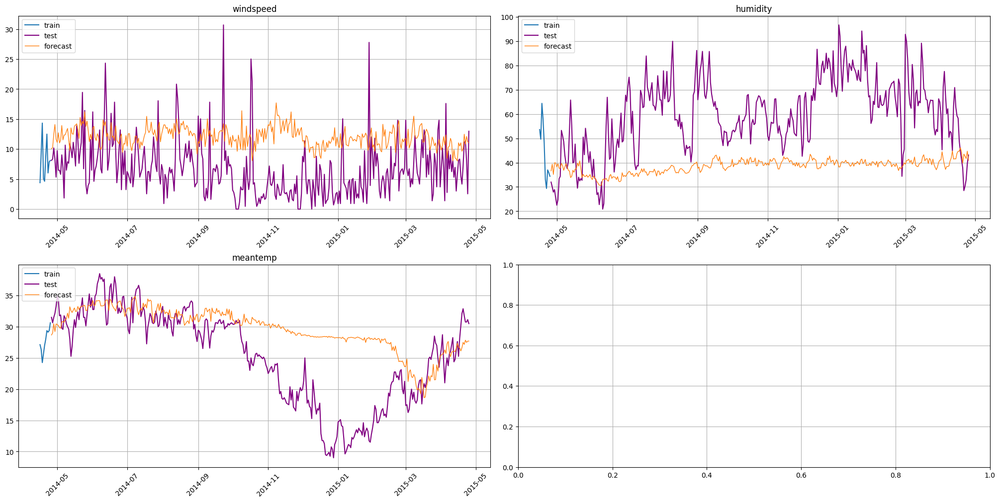

In [ ]:
plot_forecast(forecast_ts, valid_ts, train_ts, n_train_samples=10)

#**Лабораторное занятие 4**

In [ ]:
!pip install etna

In [ ]:
import warnings
warnings.filterwarnings("ignore")
import pandas as pd
from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast, plot_backtest
from etna.pipeline import Pipeline
from etna.transforms import MeanTransform, LagTransform
from etna.models import CatBoostMultiSegmentModel

In [ ]:
!wget 'https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download' -O monthly_australian_wine_sales.csv

--2024-04-07 21:17:25--  https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.194.132, 2607:f8b0:4001:c10::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.194.132|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-07 21:17:25--  https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-07 21:17:25--  https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing e

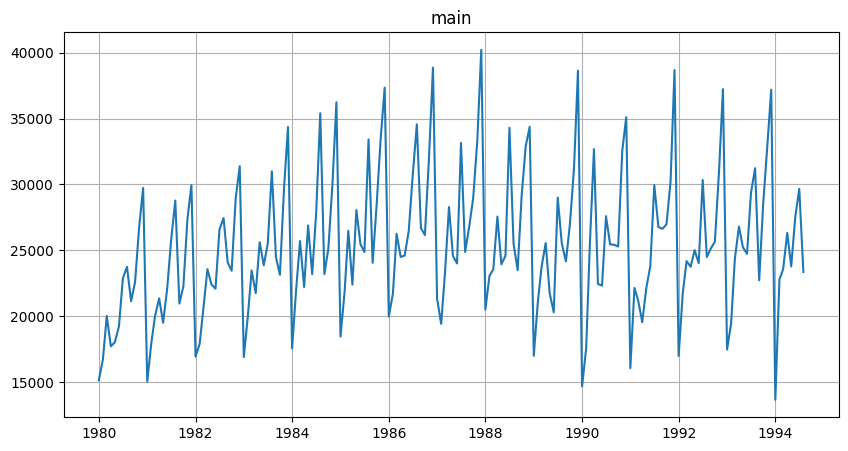

In [ ]:
df = pd.read_csv('monthly_australian_wine_sales.csv')
df.head()

df['timestamp'] = pd.to_datetime(df['month'])
df['target'] = df['sales']
df.drop(columns=['month', 'sales'], inplace = True)
df['segment'] = 'main'
df.head()
dff = TSDataset.to_dataset(df)
ts = TSDataset(dff, freq = "MS")
ts.plot()

In [ ]:
mean8 = MeanTransform(
    in_column = 'target',
    window = 8,
    out_column = 'mean_08'
)

In [ ]:
lags = LagTransform(
    in_column = 'target',
    lags = list(range(8,24,1)),
    out_column = 'lag'
)

In [ ]:
lags2 = LagTransform(
    in_column = 'target',
    lags = list(range(8,13,1)),
    out_column = 'lag'
)

In [ ]:
model = CatBoostMultiSegmentModel(loss_function='MAE',
                                  n_estimators=600,
                                  learning_rate=0.05,
                                  depth=9,
                                  random_seed=42
                                  )

In [ ]:
transforms = [lags, mean8]

In [ ]:
HORIZON = 8
pipeline = Pipeline(model = model, transforms = transforms, horizon = HORIZON)

In [ ]:
train_ts, test_ts = ts.train_test_split(train_start = '1980-01-01',
                                        train_end = '1993-12-01',
                                        test_start = '1994-01-01',
                                        test_end = '1994-08-01')

In [ ]:
smape = SMAPE()

In [ ]:
metrics_df, forecast_df, fold_info_df = pipeline.backtest(
    mode = 'expand',
    ts = train_ts,
    metrics = [smape]
)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    5.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   16.0s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   21.5s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   27.7s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   27.7s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Do

In [ ]:
fold_info_df

,train_start_time,train_end_time,test_start_time,test_end_time,fold_number
0,1980-01-01,1990-08-01,1990-09-01,1991-04-01,0
1,1980-01-01,1991-04-01,1991-05-01,1991-12-01,1
2,1980-01-01,1991-12-01,1992-01-01,1992-08-01,2
3,1980-01-01,1992-08-01,1992-09-01,1993-04-01,3
4,1980-01-01,1993-04-01,1993-05-01,1993-12-01,4


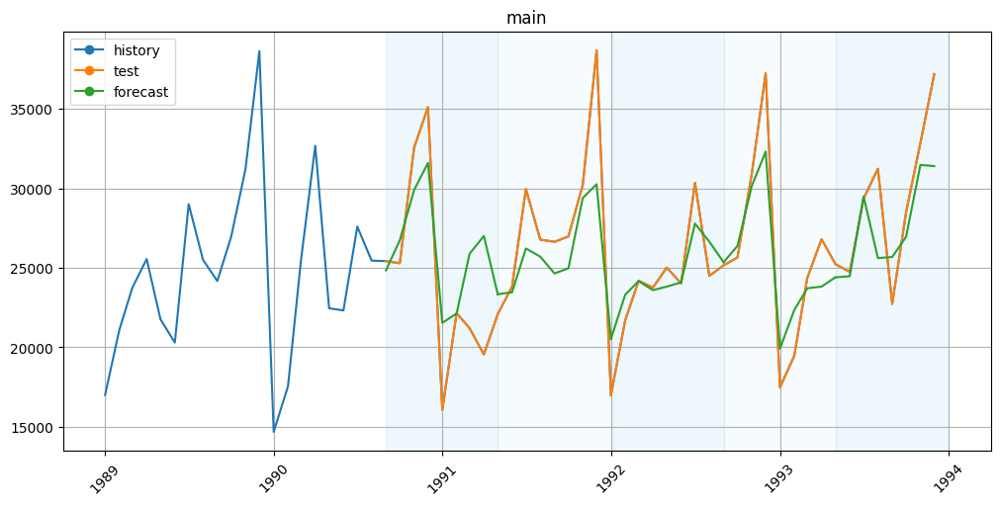

In [ ]:
plot_backtest(forecast_df, ts = train_ts, history_len = 20)

In [ ]:
metrics_df

,segment,SMAPE,fold_number
0,main,13.524289,0
0,main,8.387370,1
0,main,6.158660,2
0,main,7.704558,3
0,main,7.955967,4


In [ ]:
print(metrics_df["SMAPE"].mean())
print(metrics_df["SMAPE"].std())


8.746168790146212
2.8001672699916154


In [ ]:
transforms2 = [lags2, mean8]

In [ ]:
HORIZON = 8
pipeline = Pipeline(model = model, transforms = transforms2, horizon = HORIZON)

In [ ]:
train_ts, test_ts = ts.train_test_split(train_start = '1980-01-01',
                                        train_end = '1993-12-01',
                                        test_start = '1994-01-01',
                                        test_end = '1994-08-01')

In [ ]:
smape = SMAPE()

In [ ]:
metrics_df, forecast_df, fold_info_df = pipeline.backtest(
    mode = 'expand',
    ts = train_ts,
    metrics = [smape]
)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   15.1s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   15.1s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Do

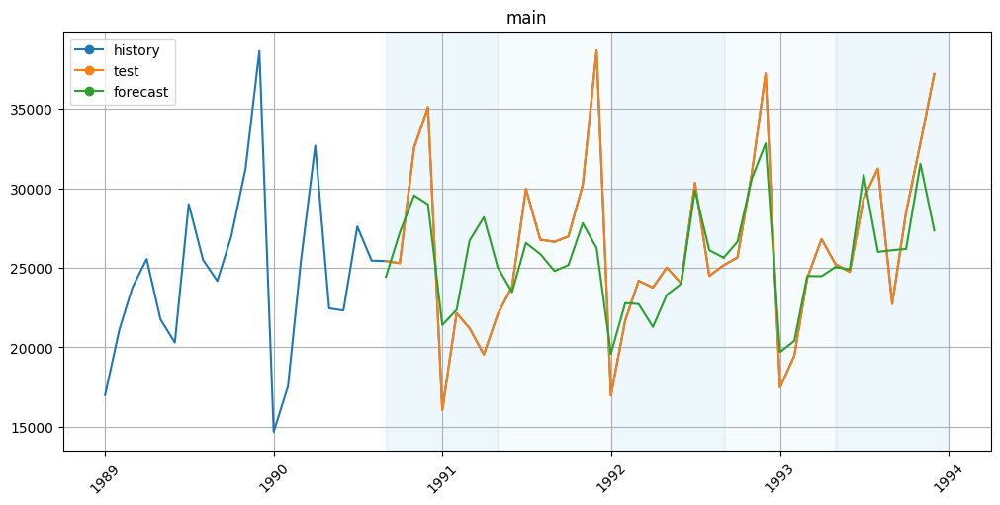

In [ ]:
plot_backtest(forecast_df, ts = train_ts, history_len = 20)

In [ ]:
metrics_df

,segment,SMAPE,fold_number
0,main,16.109081,0
0,main,11.264537,1
0,main,6.455346,2
0,main,5.699620,3
0,main,10.204354,4


In [ ]:
print(metrics_df["SMAPE"].mean())
print(metrics_df["SMAPE"].std())

9.946587571595813
4.183457137940414


In [ ]:
import math
def etna_cv_optimize(ts, model, HORIZON, transforms, n_folds, mode, metrics):
  bestmetric = math.inf
  besttrans = transforms[0]

  for transform in transforms:
    pipeline = Pipeline(model=model,
                      transforms=transform,
                      horizon=HORIZON)
    train_ts, test_ts = ts.train_test_split(test_size=HORIZON)
    metrics_df, forecast_df, fold_info_df = pipeline.backtest(
      mode= mode,
      ts=train_ts,
      n_folds = n_folds,
      metrics=metrics
    )

    print(transform)
    print(metrics[0].name,": ", metrics_df[metrics[0].name].mean())

    if(bestmetric> metrics_df[metrics[0].name].mean()):
      bestmetric = metrics_df[metrics[0].name].mean()
      besttrans = transform

  print("best ", metrics[0].name, ":", bestmetric)
  print("best transform: ", besttrans)


In [ ]:
etna_cv_optimize(ts, model, HORIZON, [transforms, transforms2], n_folds=5, mode='expand', metrics = [SMAPE()])

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    5.5s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:   16.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:   21.6s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   27.8s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   27.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Do

[LagTransform(in_column = 'target', lags = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], out_column = 'lag', ), MeanTransform(in_column = 'target', window = 8, seasonality = 1, alpha = 1, min_periods = 1, fillna = 0, out_column = 'mean_08', )]
SMAPE :  8.746168790146212


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    5.7s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    8.4s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   10.7s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:   10.7s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.2s


[LagTransform(in_column = 'target', lags = [8, 9, 10, 11, 12], out_column = 'lag', ), MeanTransform(in_column = 'target', window = 8, seasonality = 1, alpha = 1, min_periods = 1, fillna = 0, out_column = 'mean_08', )]
SMAPE :  9.946587571595813
best  SMAPE : 8.746168790146212
best transform:  [LagTransform(in_column = 'target', lags = [8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23], out_column = 'lag', ), MeanTransform(in_column = 'target', window = 8, seasonality = 1, alpha = 1, min_periods = 1, fillna = 0, out_column = 'mean_08', )]


[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   3 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   4 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 tasks      | elapsed:    0.1s


## РГР

In [ ]:
!pip install ETNA

In [ ]:
import torch
import warnings
import pandas as pd

warnings.filterwarnings('ignore')

from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast, plot_backtest
from etna.pipeline import Pipeline
import copy


from etna.transforms import MeanTransform, LagTransform
from etna.analysis import plot_feature_relevance, ModelRelevanceTable
from etna.models import CatBoostPerSegmentModel, CatBoostMultiSegmentModel

In [ ]:
df = pd.read_csv('DelhiClimate.csv', index_col=[0])

In [ ]:
df1 = df.drop(columns = ['humidity', 'wind_speed', 'meanpressure'])
df2 = df.drop(columns = ['meantemp', 'wind_speed', 'meanpressure'])
df3 = df.drop(columns = ['humidity', 'meantemp', 'meanpressure'])
#df4 = df.drop(columns = ['humidity', 'wind_speed', 'meantemp'])
df1['segment'] = 'meantemp'
df2['segment'] = 'humidity'
df3['segment'] = 'windspeed'
#df4['segment'] = 'meanpressure'
df1.rename(columns={"meantemp": "target"}, inplace = True)
df2.rename(columns={"humidity": "target"}, inplace = True)
df3.rename(columns={"wind_speed": "target"}, inplace = True)
#df4.rename(columns={"meanpressure": "target"}, inplace = True)
df5 = pd.concat([df1, df2, df3])
df5.rename(columns={"date": "timestamp"}, inplace = True)
df5['timestamp'] = pd.to_datetime(df5['timestamp'])

In [ ]:
df6 = TSDataset.to_dataset(df5)

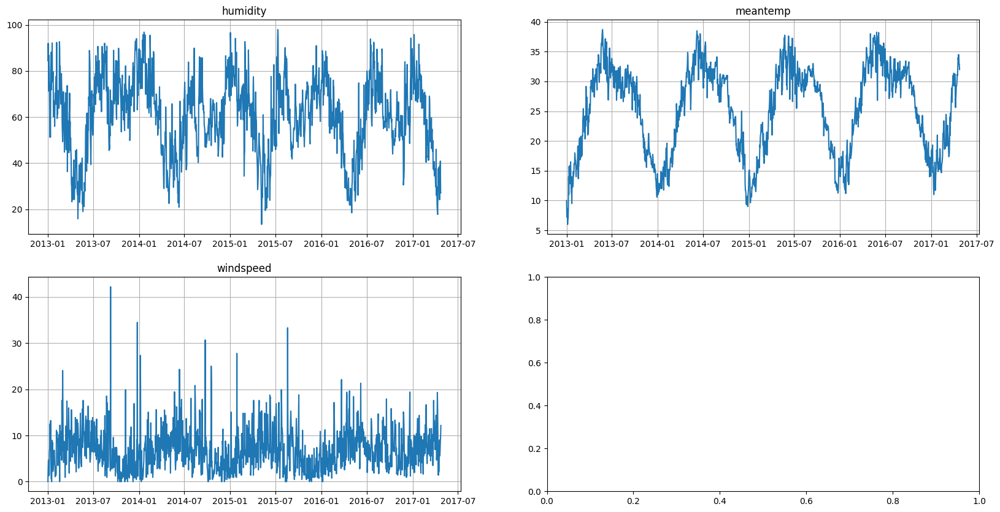

In [ ]:
ts = TSDataset(df6, 'D')
ts.plot()

In [ ]:
HORIZON = 365

In [ ]:
mean8 = MeanTransform(
    in_column='target',
    window=365,
    out_column='mean_08'
)

In [ ]:
lags = LagTransform(
    in_column='target',
    lags = list(range(128,365,1)),
    out_column='lag'
)

In [ ]:
lags2 = LagTransform(
    in_column='target',
    lags = list(range(1,128,1)),
    out_column='lag'
)

In [ ]:
model = CatBoostMultiSegmentModel(loss_function='MAE',
                                  n_estimators=200,
                                  learning_rate=0.05,
                                  depth=6,
                                  random_seed=42
                                  )

In [ ]:

transforms=[lags,mean8]
pipeline = Pipeline(model=model,
                    transforms=transforms,
                    horizon=HORIZON)

In [ ]:
transforms2 = [lags2, mean8]

pipeline2 = Pipeline(model=model,
                    transforms=transforms2,
                    horizon=HORIZON)

In [ ]:
train_ts, test_ts = ts.train_test_split(test_size=HORIZON)

In [ ]:
smape = SMAPE()

In [ ]:
metrics_df, forecast_df, fold_info_df = pipeline.backtest(
    mode='expand',
    ts=train_ts,
    metrics=[smape],
    n_folds=2
)

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   13.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   26.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   26.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s


In [ ]:
fold_info_df

,train_start_time,train_end_time,test_start_time,test_end_time,fold_number
0,2013-01-01,2014-04-25,2014-04-26,2015-04-25,0
1,2013-01-01,2015-04-25,2015-04-26,2016-04-24,1


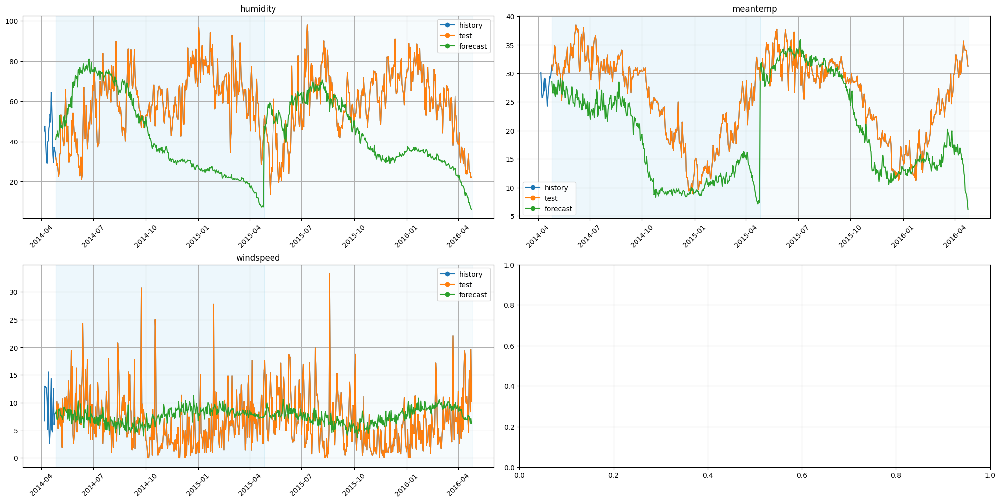

In [ ]:
plot_backtest(forecast_df, ts=train_ts,history_len=20)

In [ ]:
metrics_df

,segment,SMAPE,fold_number
0,humidity,60.468115,0
0,humidity,46.658532,1
1,meantemp,42.264628,0
1,meantemp,23.054472,1
2,windspeed,59.457029,0
2,windspeed,65.052868,1


In [ ]:
print(metrics_df['SMAPE'].mean())
print(metrics_df['SMAPE'].std())

49.4926072531361
15.627692336365177


In [ ]:
etna_cv_optimize(ts, model, HORIZON, [transforms, transforms2], n_folds=2, mode='expand', metrics = [SMAPE()])


[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   26.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   26.0s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s


[LagTransform(in_column = 'target', lags = [128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280, 281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293, 294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306, 307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 3

[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    6.9s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.3s


[LagTransform(in_column = 'target', lags = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127], out_column = 'lag', ), MeanTransform(in_column = 'target', window = 365, seasonality = 1, alpha = 1, min_periods = 1, fillna = 0, out_column = 'mean_08', )]
SMAPE :  123.88169514442399
best  SMAPE : 49.4926072531361
best transform:  [LagTransform(in_column = 'target', lags = [128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 1

[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 tasks      | elapsed:    0.1s


#**Лабораторное занятие 5**

In [ ]:
!wget 'https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download' -O monthly_australian_wine_sales.csv

--2024-04-08 11:38:36--  https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 172.253.122.132, 2607:f8b0:4004:c06::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|172.253.122.132|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-08 11:38:36--  https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-08 11:38:36--  https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing e

In [ ]:
import torch
import warnings
import pandas as pd

warnings.filterwarnings('ignore')

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

from itertools import product

from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast, plot_backtest
from etna.pipeline import Pipeline

In [ ]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [ ]:
import statsmodels

In [ ]:
wine_data = pd.read_csv('monthly_australian_wine_sales.csv', index_col = ['month'], dayfirst = 1)
wine_data

,sales
month,
1980-01-01,15136
1980-02-01,16733
1980-03-01,20016
1980-04-01,17708
1980-05-01,18019
...,...
1994-04-01,26323
1994-05-01,23779
1994-06-01,27549


In [ ]:
wine_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 176 entries, 1980-01-01 to 1994-08-01
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   sales   176 non-null    int64
dtypes: int64(1)
memory usage: 2.8+ KB


<Axes: xlabel='month'>

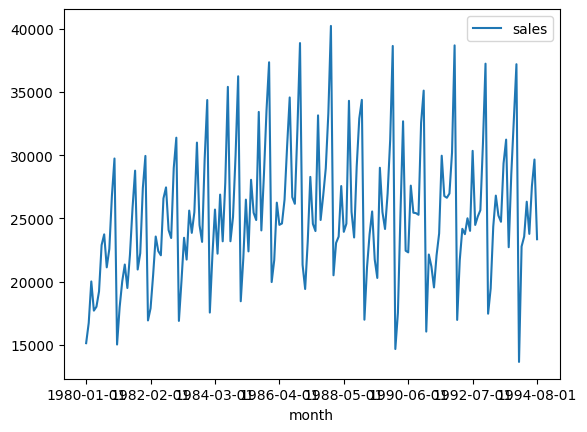

In [ ]:
wine_data.plot()

In [ ]:
result = adfuller(wine_data)
print('Значение Дикки-Фуллера:', result[1])

Значение Дикки-Фуллера: 0.05116115205187666


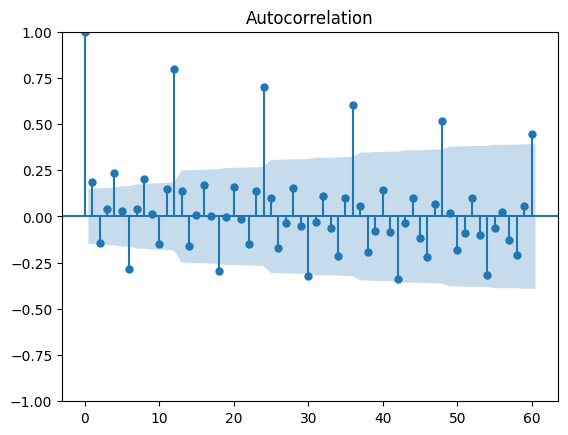

In [ ]:
plot_acf(wine_data, lags = 60);

In [ ]:
wine_data['diff_s'] = wine_data - wine_data.shift(12)

In [ ]:
wine_data

,sales,diff_s
month,,
1980-01-01,15136,NaN
1980-02-01,16733,NaN
1980-03-01,20016,NaN
1980-04-01,17708,NaN
1980-05-01,18019,NaN
...,...,...
1994-04-01,26323,-482.0
1994-05-01,23779,-1457.0
1994-06-01,27549,2814.0


In [ ]:
result = adfuller(wine_data.diff_s[12:])
print('Значение Дикки-Фуллера:', result[1])

Значение Дикки-Фуллера: 0.08851811614166566


<Axes: xlabel='month'>

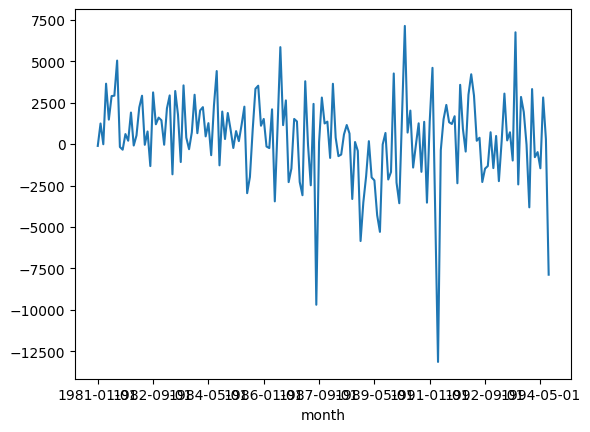

In [ ]:
wine_data.diff_s[12:].plot()

In [ ]:
wine_data['diff_s_diff'] = wine_data.diff_s - wine_data.diff_s.shift(1)
print(f'p-значение Дики-Фуллера: {adfuller(wine_data.diff_s_diff[13:])[1]}')


p-значение Дики-Фуллера: 1.8629014556951128e-06


<Axes: xlabel='month'>

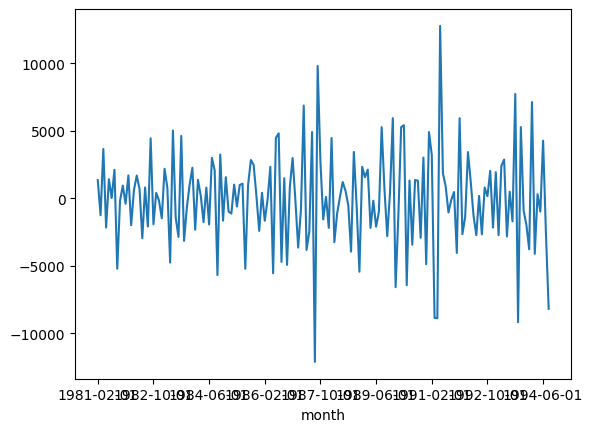

In [ ]:
wine_data.diff_s_diff[13:].plot()

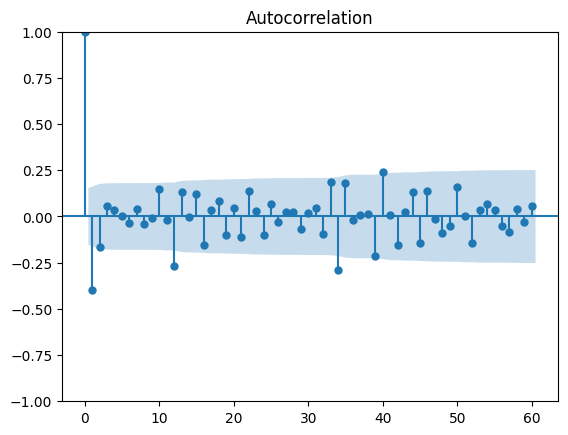

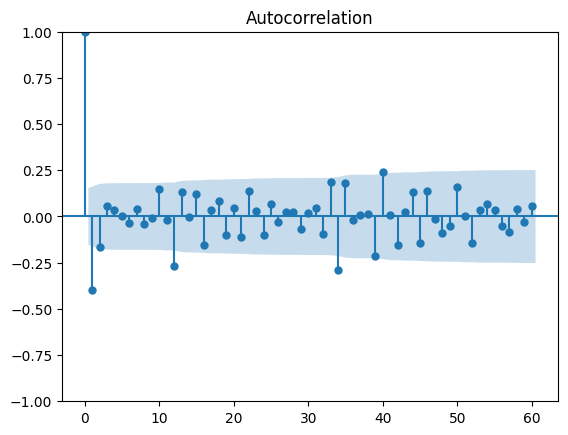

In [ ]:
plot_acf(wine_data.diff_s_diff[13:],lags=60)

In [ ]:
D = 1
d = 1
Q = range(2)
q = range(3)
P = range(2)
p = range(5)

In [ ]:
parameters = list(product(p, q, P, Q))
print(len(parameters))
print(parameters[20])


60
(1, 2, 0, 0)


In [ ]:
results = []
best_aic = float('inf')

for param in parameters:
    model = SARIMAX(wine_data.sales,
                                      order=(param[0], d, param[1]), # несезонная компонента
                                      seasonal_order=(param[2], D, param[3], 12)).fit(disp=-1) # сезонная компонента

    aic = model.aic
    if aic < best_aic:
      best_model = model
      best_aic = aic
      best_param = param
    results.append([param, model.aic])

In [ ]:
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by='aic'))

      parameters          aic
9   (0, 2, 0, 1)  3065.532812
11  (0, 2, 1, 1)  3066.238777
5   (0, 1, 0, 1)  3066.329480
21  (1, 2, 0, 1)  3066.423532
17  (1, 1, 0, 1)  3066.491614
29  (2, 1, 0, 1)  3066.929562
19  (1, 1, 1, 1)  3067.331457
23  (1, 2, 1, 1)  3067.354153
7   (0, 1, 1, 1)  3067.457081
31  (2, 1, 1, 1)  3067.860118
33  (2, 2, 0, 1)  3068.312447
41  (3, 1, 0, 1)  3068.839322
35  (2, 2, 1, 1)  3069.263474
49  (4, 0, 0, 1)  3069.590911
43  (3, 1, 1, 1)  3069.797503
45  (3, 2, 0, 1)  3070.287506
53  (4, 1, 0, 1)  3070.442736
51  (4, 0, 1, 1)  3070.624486
10  (0, 2, 1, 0)  3070.727831
37  (3, 0, 0, 1)  3070.775046
47  (3, 2, 1, 1)  3071.221071
39  (3, 0, 1, 1)  3071.277599
55  (4, 1, 1, 1)  3071.396162
18  (1, 1, 1, 0)  3071.441355
6   (0, 1, 1, 0)  3071.631068
30  (2, 1, 1, 0)  3071.884024
22  (1, 2, 1, 0)  3072.020867
57  (4, 2, 0, 1)  3072.265682
59  (4, 2, 1, 1)  3073.218890
34  (2, 2, 1, 0)  3073.838075
42  (3, 1, 1, 0)  3073.878315
25  (2, 0, 0, 1)  3073.963643
27  (2, 0,

In [ ]:
df_result = pd.DataFrame(results)


In [ ]:
print(best_model.summary())

                                      SARIMAX Results                                       
Dep. Variable:                                sales   No. Observations:                  176
Model:             SARIMAX(0, 1, 2)x(0, 1, [1], 12)   Log Likelihood               -1528.766
Date:                              Mon, 08 Apr 2024   AIC                           3065.533
Time:                                      12:13:07   BIC                           3077.908
Sample:                                  01-01-1980   HQIC                          3070.557
                                       - 08-01-1994                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1         -0.5756      0.041    -13.952      0.000      -0.656      -0.495
ma.L2         -0.10

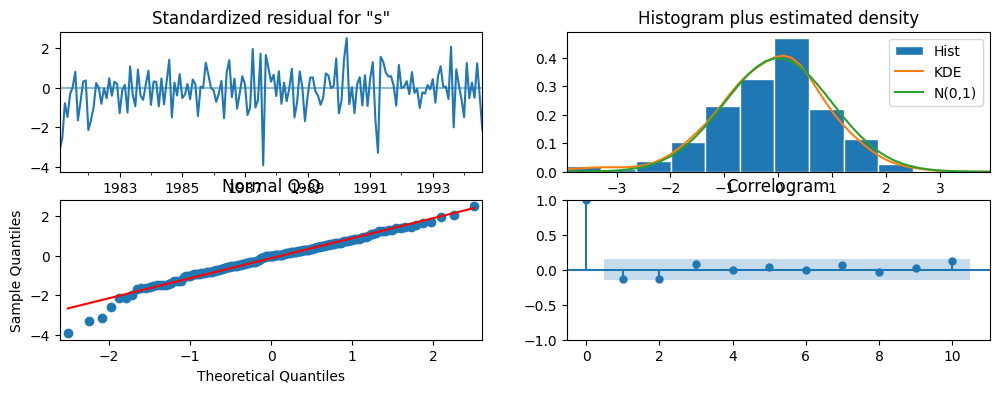

In [ ]:
best_model.plot_diagnostics(figsize=(12,4));

In [ ]:
from etna.models import SARIMAXModel

In [ ]:
!wget 'https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download' -O monthly_australian_wine_sales.csv

--2024-04-08 12:22:49--  https://drive.usercontent.google.com/u/0/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 142.251.167.132, 2607:f8b0:4004:c09::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|142.251.167.132|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-08 12:22:49--  https://drive.usercontent.google.com/uc?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download [following]
--2024-04-08 12:22:49--  https://drive.usercontent.google.com/download?id=1RyUfkX6N0v0_m_6dQSH3h3imcvmJiSwy&export=download
Reusing e

In [ ]:
df = pd.read_csv('monthly_australian_wine_sales.csv')
df.head()

df['timestamp'] = pd.to_datetime(df['month'])
df['target'] = df['sales']
df.drop(columns=['month', 'sales'], inplace = True)
df['segment'] = 'main'
df.head()

,timestamp,target,segment
0,1980-01-01,15136,main
1,1980-02-01,16733,main
2,1980-03-01,20016,main
3,1980-04-01,17708,main
4,1980-05-01,18019,main


In [ ]:
df2 = TSDataset.to_dataset(df)
df2.head()

segment,main
feature,target
timestamp,
1980-01-01,15136
1980-02-01,16733
1980-03-01,20016
1980-04-01,17708
1980-05-01,18019


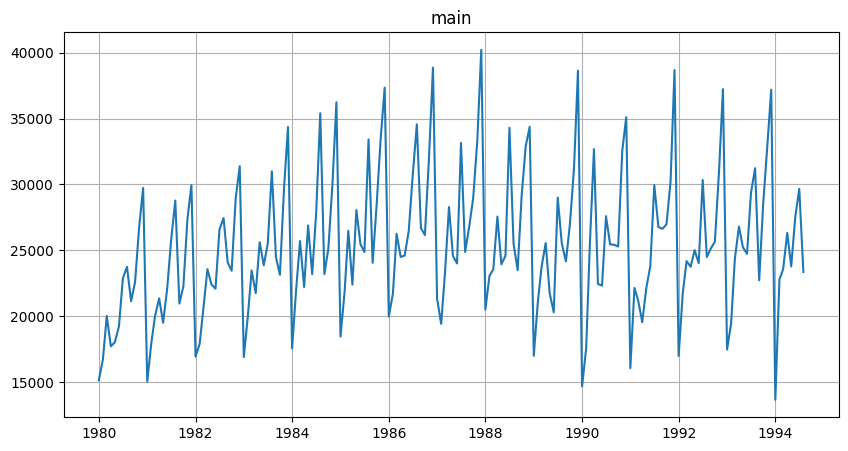

In [ ]:
ts = TSDataset(df2, 'MS')
ts.plot()

In [ ]:
HORIZON = 8
train_ts, test_ts = ts.train_test_split(test_size=HORIZON)


In [ ]:
model = SARIMAXModel(order = (0,1,2),
                    seasonal_order = (0,1,1,12))
model.fit(train_ts)

SARIMAXModel(order = (0, 1, 2), seasonal_order = (0, 1, 1, 12), trend = None, measurement_error = False, time_varying_regression = False, mle_regression = True, simple_differencing = False, enforce_stationarity = True, enforce_invertibility = True, hamilton_representation = False, concentrate_scale = False, trend_offset = 1, use_exact_diffuse = False, dates = None, freq = None, missing = 'none', validate_specification = True, fit_params = {}, )

In [ ]:
future_ts = train_ts.make_future(HORIZON)
future_ts

segment,main
feature,target
timestamp,
1994-01-01,NaN
1994-02-01,NaN
1994-03-01,NaN
1994-04-01,NaN
1994-05-01,NaN
1994-06-01,NaN
1994-07-01,NaN
1994-08-01,NaN


In [ ]:
forecast_ts = model.forecast(future_ts)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,17856.793080
1994-02-01,21036.312348
1994-03-01,24954.923232
1994-04-01,26557.167946
1994-05-01,25687.773263
1994-06-01,25258.575711
1994-07-01,30471.517895
1994-08-01,29967.000013


In [ ]:
smape = SMAPE()
smape(y_true = test_ts, y_pred = forecast_ts)

{'main': 10.64605000748546}

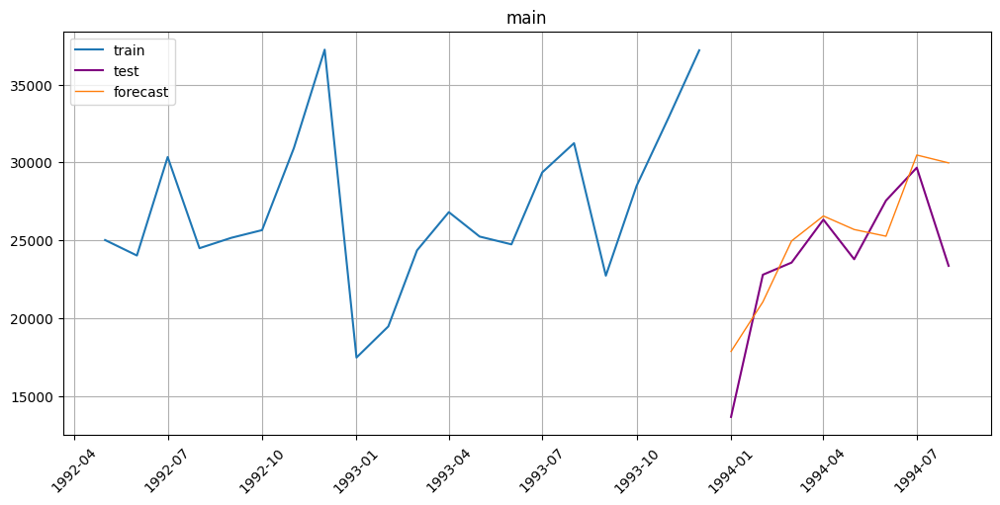

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts , n_train_samples = 20)

## РГР

In [ ]:
!wget 'https://drive.usercontent.google.com/uc?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download' -O DelhiClimate.csv

--2024-04-25 18:43:00--  https://drive.usercontent.google.com/uc?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download
Resolving drive.usercontent.google.com (drive.usercontent.google.com)... 173.194.198.132, 2607:f8b0:4001:c1c::84
Connecting to drive.usercontent.google.com (drive.usercontent.google.com)|173.194.198.132|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://drive.usercontent.google.com/download?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download [following]
--2024-04-25 18:43:00--  https://drive.usercontent.google.com/download?id=1BMYoVafISsWsLUAw86QnwItOfqgKDuoG&export=download
Reusing existing connection to drive.usercontent.google.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 90127 (88K) [application/octet-stream]
Saving to: ‘DelhiClimate.csv’

DelhiClimate.csv    100%[===================>]  88.01K  --.-KB/s    in 0.001s  

2024-04-25 18:43:01 (89.9 MB/s) - ‘DelhiClimate.csv’ saved [90127/90127]



In [ ]:
pip install etna

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 422.2/422.2 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 354.1/354.1 kB 9.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 2.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 5.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.2/57.2 kB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 2.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 22.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 14.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 292.8/292.8 kB 10.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import torch
import warnings
import pandas as pd

warnings.filterwarnings('ignore')

from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast, plot_backtest
from etna.pipeline import Pipeline
import copy

from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX

from etna.transforms import MeanTransform, LagTransform
from etna.analysis import plot_feature_relevance, ModelRelevanceTable
from etna.models import CatBoostPerSegmentModel, CatBoostMultiSegmentModel
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('DelhiClimate.csv', index_col=[0])

In [ ]:
df.drop(index = 1461, inplace = True)
df1 = df.drop(columns = ['humidity', 'wind_speed', 'meanpressure'])
df2 = df.drop(columns = ['meantemp', 'wind_speed', 'meanpressure'])
df3 = df.drop(columns = ['humidity', 'meantemp', 'meanpressure'])
df1['segment'] = 'meantemp'
df2['segment'] = 'humidity'
df3['segment'] = 'windspeed'
df1.rename(columns={"meantemp": "target"}, inplace = True)
df2.rename(columns={"humidity": "target"}, inplace = True)
df3.rename(columns={"wind_speed": "target"}, inplace = True)
df5 = pd.concat([df1, df2, df3])
df5.rename(columns={"date": "timestamp"}, inplace = True)
df5['timestamp'] = pd.to_datetime(df5['timestamp'])

In [ ]:
df6 = TSDataset.to_dataset(df5)

In [ ]:
ts = TSDataset(df6, 'D')

In [ ]:
HORIZON = 60
train_ts, test_ts = ts.train_test_split(test_size=HORIZON)

In [ ]:
climate_data = pd.read_csv('DelhiClimate.csv', index_col=['date'],parse_dates=['date'], dayfirst=True)

In [ ]:
rgr_df = []
rgr_df.append(climate_data.humidity)
rgr_df.append(climate_data.meantemp)
rgr_df.append(climate_data.wind_speed)


In [ ]:
climate_data = climate_data.drop(columns = ['meanpressure', 'wind_speed', 'humidity', 'Unnamed: 0'])

In [ ]:
climate_data

,meantemp
date,
2017-01-01,15.913043
2017-01-02,18.500000
2017-01-03,17.111111
2017-01-04,18.700000
2017-01-05,18.388889
...,...
2016-12-28,17.217391
2016-12-29,15.238095
2016-12-30,14.095238


In [ ]:
for segment in rgr_df:
  dk_fuller = adfuller(segment)
  print ('p-value: ', dk_fuller[1])
  if dk_fuller[0]> dk_fuller[4]['5%']:
      print ('ряд не стационарен')
  else:
      print ('ряд стационарен')

p-value:  0.001123590645613618
ряд стационарен
p-value:  0.11577219866043487
ряд не стационарен
p-value:  0.0011671800082410488
ряд стационарен


In [ ]:
data = climate_data

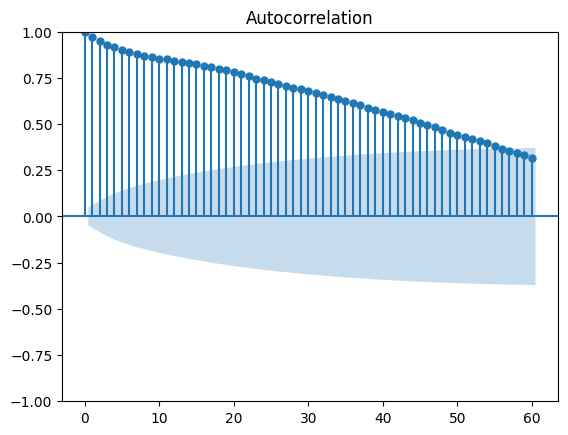

In [ ]:
plot_acf(data, lags=60);


In [ ]:
data['diff_s'] = data - data.shift(1)

p-значение Дики-Фуллера: 1.7284492027788638e-29


<Axes: xlabel='date'>

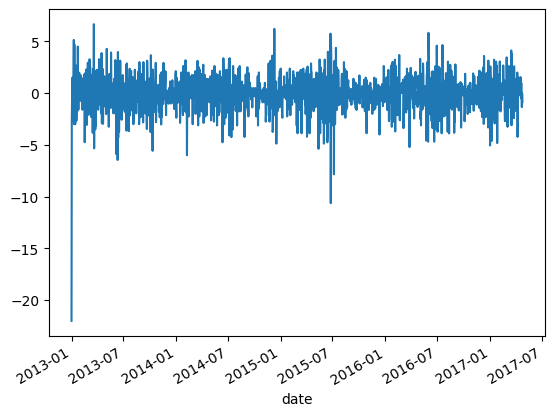

In [ ]:
print(f'p-значение Дики-Фуллера: {adfuller(data.diff_s[1:])[1]}')
data.diff_s[1:].plot()

In [ ]:
data['diff_s_diff'] = data.diff_s - data.diff_s.shift(12)


p-значение Дики-Фуллера: 1.898829625866564e-29


<Axes: xlabel='date'>

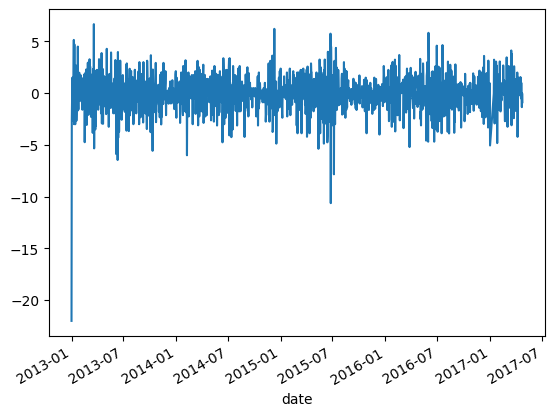

In [ ]:
print(f'p-значение Дики-Фуллера: {adfuller(data.diff_s[13:])[1]}')
data.diff_s[13:].plot()


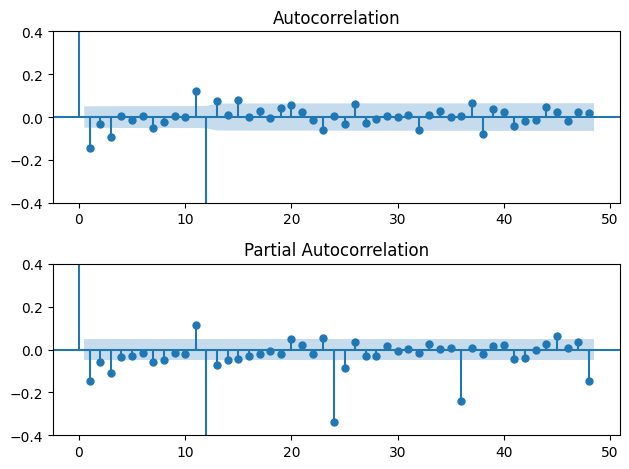

In [ ]:
ax = plt.subplot(211)
plot_acf(data.diff_s_diff[13:].values.squeeze(), lags=48, ax=ax)
plt.ylim([-0.4, 0.4])

ax = plt.subplot(212)
plot_pacf(data.diff_s_diff[13:].values.squeeze(), lags=48, ax=ax)
plt.ylim([-0.4, 0.4])

plt.tight_layout()

In [ ]:
D = 1
d = 1
Q = range(1)
q = range(3)
P = range(1)
p = range(7)

In [ ]:
from itertools import product
import statsmodels.api as sm


In [ ]:
parameters = list(product(p, q, P, Q))
print(len(parameters))
print(parameters[20])

21
(6, 2, 0, 0)


In [ ]:
results = []
best_aic = float('inf')

for param in parameters:
    model = sm.tsa.statespace.SARIMAX(data.meantemp,
                                      order=(param[0], d, param[1]), # несезонная компонента
                                      seasonal_order=(param[2], D, param[3], 12)).fit(disp=-1) # сезонная компонента

    aic = model.aic
    if aic < best_aic:
      best_model = model
      best_aic = aic
      best_param = param
    results.append([param, model.aic])

In [ ]:
result_table = pd.DataFrame(results)
result_table.columns = ['parameters', 'aic']
print(result_table.sort_values(by='aic', ascending=True))

      parameters          aic
20  (6, 2, 0, 0)  7058.826230
17  (5, 2, 0, 0)  7070.145547
14  (4, 2, 0, 0)  7079.200367
11  (3, 2, 0, 0)  7084.629261
8   (2, 2, 0, 0)  7095.943612
7   (2, 1, 0, 0)  7139.965660
5   (1, 2, 0, 0)  7140.235210
19  (6, 1, 0, 0)  7140.238855
16  (5, 1, 0, 0)  7140.750783
13  (4, 1, 0, 0)  7140.895330
10  (3, 1, 0, 0)  7140.922939
4   (1, 1, 0, 0)  7142.504029
9   (3, 0, 0, 0)  7241.550569
12  (4, 0, 0, 0)  7241.801004
15  (5, 0, 0, 0)  7242.289955
18  (6, 0, 0, 0)  7243.968702
2   (0, 2, 0, 0)  7251.641625
1   (0, 1, 0, 0)  7257.291395
6   (2, 0, 0, 0)  7259.168137
3   (1, 0, 0, 0)  7262.254125
0   (0, 0, 0, 0)  7294.357231


In [ ]:
print(best_model.summary())


                                      SARIMAX Results                                      
Dep. Variable:                            meantemp   No. Observations:                 1576
Model:             SARIMAX(6, 1, 2)x(0, 1, [], 12)   Log Likelihood               -3520.413
Date:                             Thu, 25 Apr 2024   AIC                           7058.826
Time:                                     19:16:22   BIC                           7107.015
Sample:                                          0   HQIC                          7076.742
                                            - 1576                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1816      0.019     -9.393      0.000      -0.220      -0.144
ar.L2          0.7920      

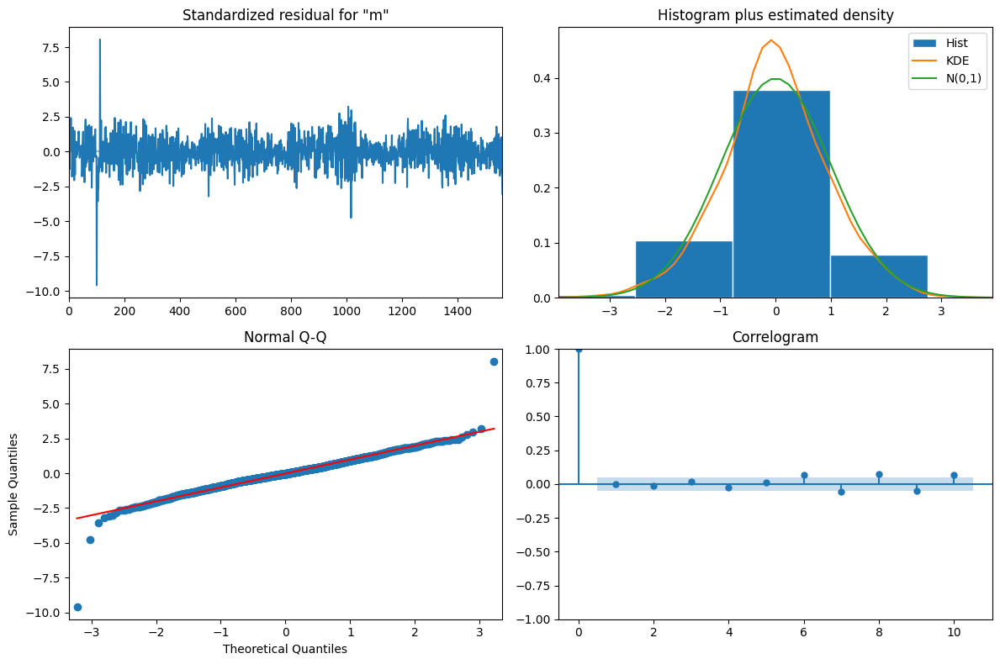

In [ ]:
best_model.plot_diagnostics(figsize=(12, 8))
plt.tight_layout()

In [ ]:
from etna.models import SARIMAXModel

In [ ]:
df = pd.read_csv('DelhiClimate.csv', index_col=[0])

In [ ]:
df.drop(index = 1461, inplace = True)
df1 = df.drop(columns = ['humidity', 'wind_speed', 'meanpressure'])
df2 = df.drop(columns = ['meantemp', 'wind_speed', 'meanpressure'])
df3 = df.drop(columns = ['humidity', 'meantemp', 'meanpressure'])
df1['segment'] = 'meantemp'
df2['segment'] = 'humidity'
df3['segment'] = 'windspeed'
df1.rename(columns={"meantemp": "target"}, inplace = True)
df2.rename(columns={"humidity": "target"}, inplace = True)
df3.rename(columns={"wind_speed": "target"}, inplace = True)
df5 = pd.concat([df1, df2, df3])
df5.rename(columns={"date": "timestamp"}, inplace = True)
df5['timestamp'] = pd.to_datetime(df5['timestamp'])

In [ ]:
df6 = TSDataset.to_dataset(df5)
ts = TSDataset(df6, 'D')

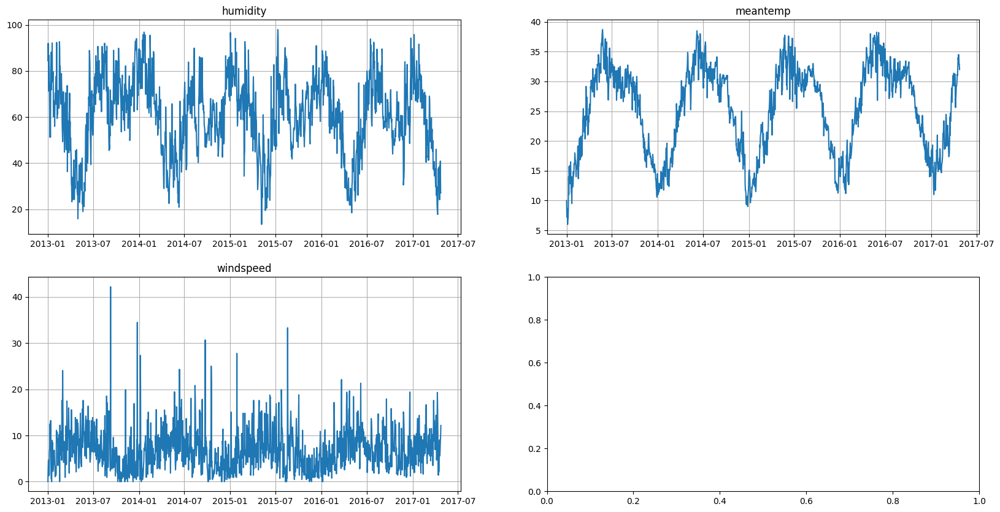

In [ ]:
ts.plot()

In [ ]:
train_ts, test_ts = ts.train_test_split(test_size=HORIZON)


In [ ]:
model = SARIMAXModel(order=(3, 1, 1), seasonal_order=(0, 1, 1, 30))
model.fit(train_ts)

SARIMAXModel(order = (3, 1, 1), seasonal_order = (0, 1, 1, 30), trend = None, measurement_error = False, time_varying_regression = False, mle_regression = True, simple_differencing = False, enforce_stationarity = True, enforce_invertibility = True, hamilton_representation = False, concentrate_scale = False, trend_offset = 1, use_exact_diffuse = False, dates = None, freq = None, missing = 'none', validate_specification = True, fit_params = {}, )

In [ ]:
future_ts = train_ts.make_future(HORIZON, tail_steps=model.context_size)
future_ts

segment,humidity,meantemp,windspeed
feature,target,target,target
timestamp,,,
2017-02-24,NaN,NaN,NaN
2017-02-25,NaN,NaN,NaN
2017-02-26,NaN,NaN,NaN
2017-02-27,NaN,NaN,NaN
2017-02-28,NaN,NaN,NaN
2017-03-01,NaN,NaN,NaN
2017-03-02,NaN,NaN,NaN
2017-03-03,NaN,NaN,NaN


In [ ]:
forecast_ts = model.forecast(future_ts, HORIZON)
forecast_ts

segment      humidity                             meantemp               \
feature        target target_0.025 target_0.975     target target_0.025   
timestamp                                                                 
2017-02-24  48.198857    32.794336    63.603378  19.165944    15.985165   
2017-02-25  54.960134    35.497171    74.423097  19.010629    14.973000   
2017-02-26  59.328553    37.951608    80.705498  19.102342    14.534085   
2017-02-27  61.336971    39.054078    83.619864  19.281135    14.402345   
2017-02-28  62.944716    40.080252    85.809181  19.285328    14.170092   
2017-03-01  62.282497    38.930572    85.634422  19.260202    13.938582   
2017-03-02  61.907389    38.080108    85.734669  19.314745    13.796188   
2017-03-03  61.305869    36.995964    85.615775  19.380531    13.669492   
2017-03-04  60.436422    35.638780    85.234065  19.211458    13.311733   
2017-03-05  60.225917    34.942044    85.509790  19.549144    13.465172   
2017-03-06  60.635506    34.871626    86.399386  19.646180    13.382797   
2017-03-07  59.945522    33.709923    86.181121  19.727882    13.289946   
2017-03-08  59.866537    33.167874    86.565200  19.679876    13.072019   
2017-03-09  58.016739    30.863361    85.170116  19.661485    12.888028   
2017-03-10  57.301115    29.700949    84.901280  19.522464    12.587410   
2017-03-11  56.942340    28.902983    84.981697  19.634904    12.541998   
2017-03-12  58.437443    29.965230    86.909657  19.522752    12.275423   
2017-03-13  58.627666    29.729075    87.526257  19.550007    12.151480   
2017-03-14  58.623989    29.305212    87.942767  19.703656    12.156957   
2017-03-15  58.527649    28.794615    88.260683  19.975361    12.283344   
2017-03-16  58.164848    28.023248    88.306448  19.840282    12.005641   
2017-03-17  57.028151    26.483447    87.572854  19.413183    11.438469   
2017-03-18  55.170373    24.227817    86.112929  19.674242    11.561872   
2017-03-19  55.628687    24.293330    86.964044  19.765118    11.517389   
2017-03-20  56.460358    24.737063    88.183653  19.804356    11.423455   
2017-03-21  57.081633    24.975088    89.188178  19.873335    11.361345   
2017-03-22  58.847817    26.362542    91.333092  20.038362    11.397271   
2017-03-23  58.513784    25.654145    91.373423  20.247809    11.479518   
2017-03-24  59.483705    26.253919    92.713491  19.631943    10.738271   
2017-03-25  57.452636    23.856780    91.048491  19.924757    10.907447   
2017-03-26  57.350118    23.346817    91.353418  20.079712    10.929644   
2017-03-27  59.303000    24.907510    93.698490  19.569777    10.291209   
2017-03-28  60.353216    25.578828    95.127603  19.412868    10.008721   
2017-03-29  60.947389    25.805445    96.089333  19.486400     9.959717   
2017-03-30  62.174340    26.671899    97.676782  19.459594     9.812495   
2017-03-31  61.559250    25.700977    97.417523  19.435802     9.669993   
2017-04-01  61.318421    25.107843    97.528999  19.498649     9.615577   
2017-04-02  60.818116    24.258402    97.377829  19.571132     9.572144   
2017-04-03  59.999484    23.093744    96.905224  19.405556     9.291950   
2017-04-04  59.805992    22.557337    97.054646  19.744520     9.517564   
2017-04-05  60.216969    22.628487    97.805451  19.841759     9.502688   
2017-04-06  59.523838    21.598545    97.449130  19.923317     9.473328   
2017-04-07  59.441857    21.182667    97.701048  19.875142     9.315392   
2017-04-08  57.590342    19.000072    96.180613  19.856645     9.188248   
2017-04-09  56.874037    17.955497    95.792577  19.717578     8.941620   
2017-04-10  56.515126    17.271162    95.759090  19.830006     8.947547   
2017-04-11  58.010287    18.443982    97.576592  19.717854     8.730077   
2017-04-12  58.200594    18.314553    98.086635  19.745113     8.653017   
2017-04-13  58.196972    17.993738    98.400206  19.898765     8.703323   
2017-04-14  58.100657    17.582712    98.618602  20.170471     8.872628   
2017-04-15  57.737863    

In [ ]:
smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'humidity': 39.30621706815119,
 'meantemp': 27.660594551659685,
 'windspeed': 35.53304348361902}

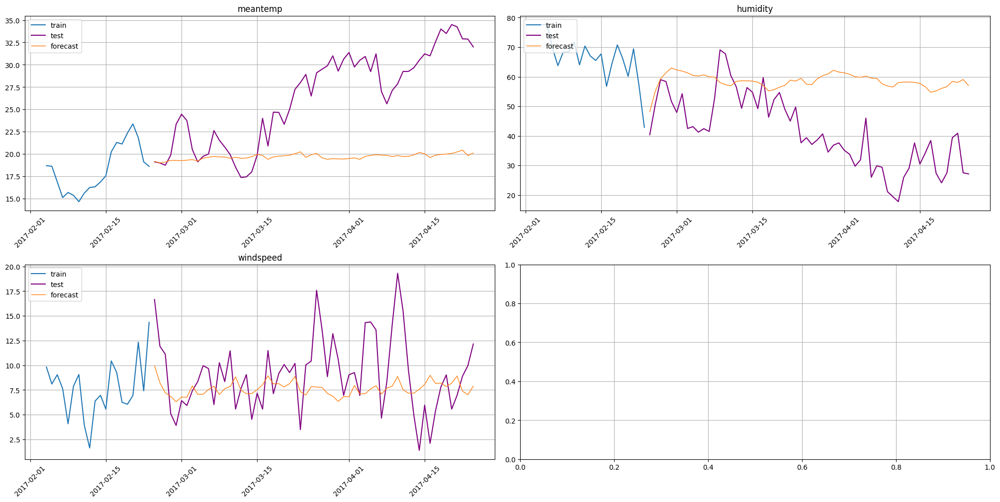

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=20)

#**Лабораторное занятие 6**

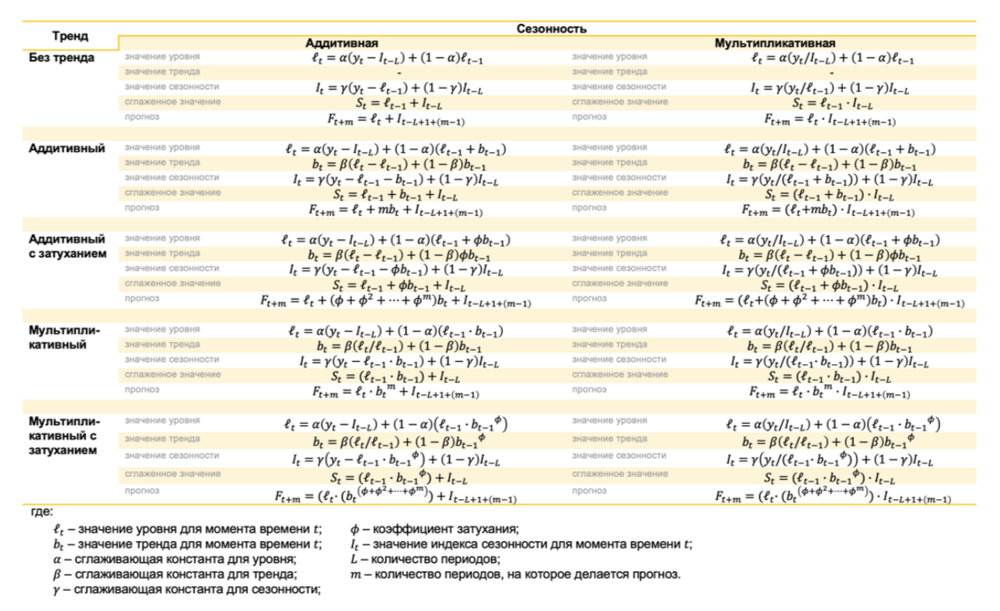

## statsmodels

[Экспоненциальное сглаживание в statsmodels](https://www.statsmodels.org/stable/examples/notebooks/generated/exponential_smoothing.html#)

### Работа с примерами в statsmodels

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt

%matplotlib inline

data = [
    446.6565,
    454.4733,
    455.663,
    423.6322,
    456.2713,
    440.5881,
    425.3325,
    485.1494,
    506.0482,
    526.792,
    514.2689,
    494.211,
]
index = pd.date_range(start="1996", end="2008", freq="A")
oildata = pd.Series(data, index)

data = [
    17.5534,
    21.86,
    23.8866,
    26.9293,
    26.8885,
    28.8314,
    30.0751,
    30.9535,
    30.1857,
    31.5797,
    32.5776,
    33.4774,
    39.0216,
    41.3864,
    41.5966,
]
index = pd.date_range(start="1990", end="2005", freq="A")
air = pd.Series(data, index)

data = [
    263.9177,
    268.3072,
    260.6626,
    266.6394,
    277.5158,
    283.834,
    290.309,
    292.4742,
    300.8307,
    309.2867,
    318.3311,
    329.3724,
    338.884,
    339.2441,
    328.6006,
    314.2554,
    314.4597,
    321.4138,
    329.7893,
    346.3852,
    352.2979,
    348.3705,
    417.5629,
    417.1236,
    417.7495,
    412.2339,
    411.9468,
    394.6971,
    401.4993,
    408.2705,
    414.2428,
]
index = pd.date_range(start="1970", end="2001", freq="A")
livestock2 = pd.Series(data, index)

data = [407.9979, 403.4608, 413.8249, 428.105, 445.3387, 452.9942, 455.7402]
index = pd.date_range(start="2001", end="2008", freq="A")
livestock3 = pd.Series(data, index)

data = [
    41.7275,
    24.0418,
    32.3281,
    37.3287,
    46.2132,
    29.3463,
    36.4829,
    42.9777,
    48.9015,
    31.1802,
    37.7179,
    40.4202,
    51.2069,
    31.8872,
    40.9783,
    43.7725,
    55.5586,
    33.8509,
    42.0764,
    45.6423,
    59.7668,
    35.1919,
    44.3197,
    47.9137,
]
index = pd.date_range(start="2005", end="2010-Q4", freq="QS-OCT")
aust = pd.Series(data, index)


#### Simple Exponential Smoothing

Figure 7.1: Oil production in Saudi Arabia from 1996 to 2007.


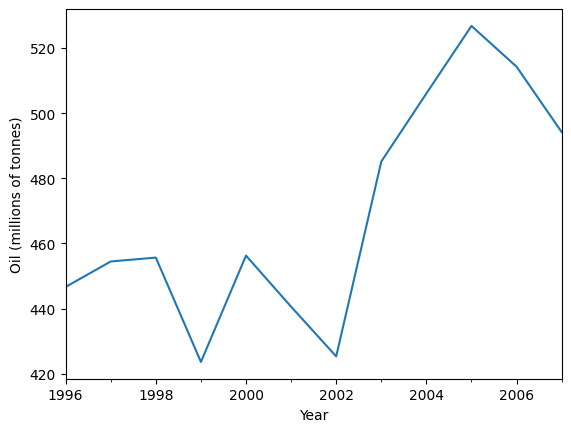

In [ ]:
ax = oildata.plot()
ax.set_xlabel("Year")
ax.set_ylabel("Oil (millions of tonnes)")
print("Figure 7.1: Oil production in Saudi Arabia from 1996 to 2007.")


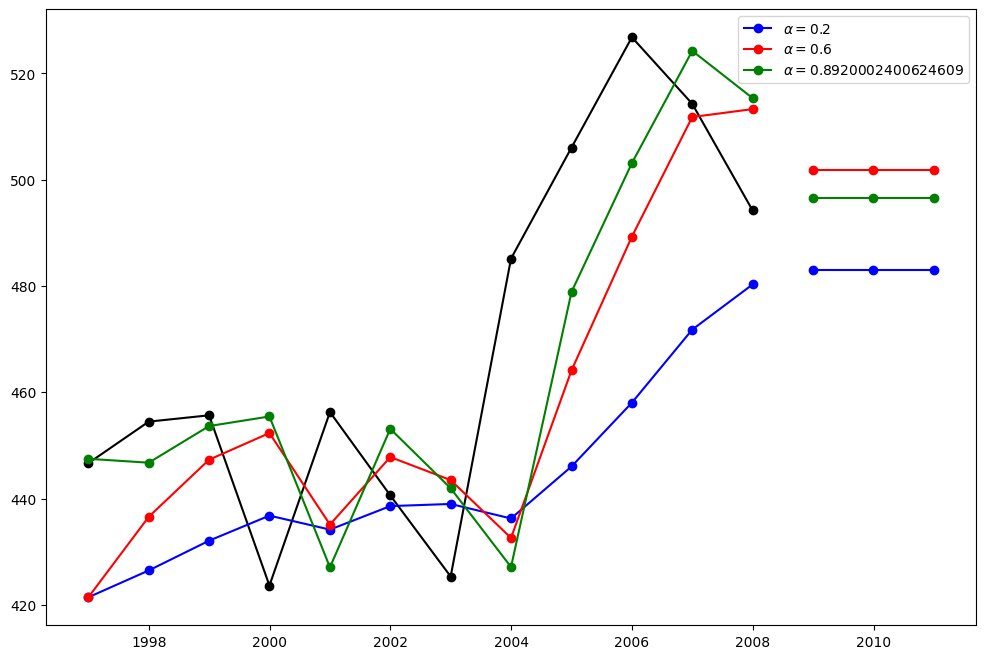

In [ ]:
fit1 = SimpleExpSmoothing(oildata, initialization_method="heuristic").fit(
    smoothing_level=0.2, optimized=False
)
fcast1 = fit1.forecast(3).rename(r"$\alpha=0.2$")
fit2 = SimpleExpSmoothing(oildata, initialization_method="heuristic").fit(
    smoothing_level=0.6, optimized=False
)
fcast2 = fit2.forecast(3).rename(r"$\alpha=0.6$")
fit3 = SimpleExpSmoothing(oildata, initialization_method="estimated").fit()
fcast3 = fit3.forecast(3).rename(r"$\alpha=%s$" % fit3.model.params["smoothing_level"])

plt.figure(figsize=(12, 8))
plt.plot(oildata, marker="o", color="black")
plt.plot(fit1.fittedvalues, marker="o", color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, marker="o", color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, marker="o", color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])


####Holt’s Method

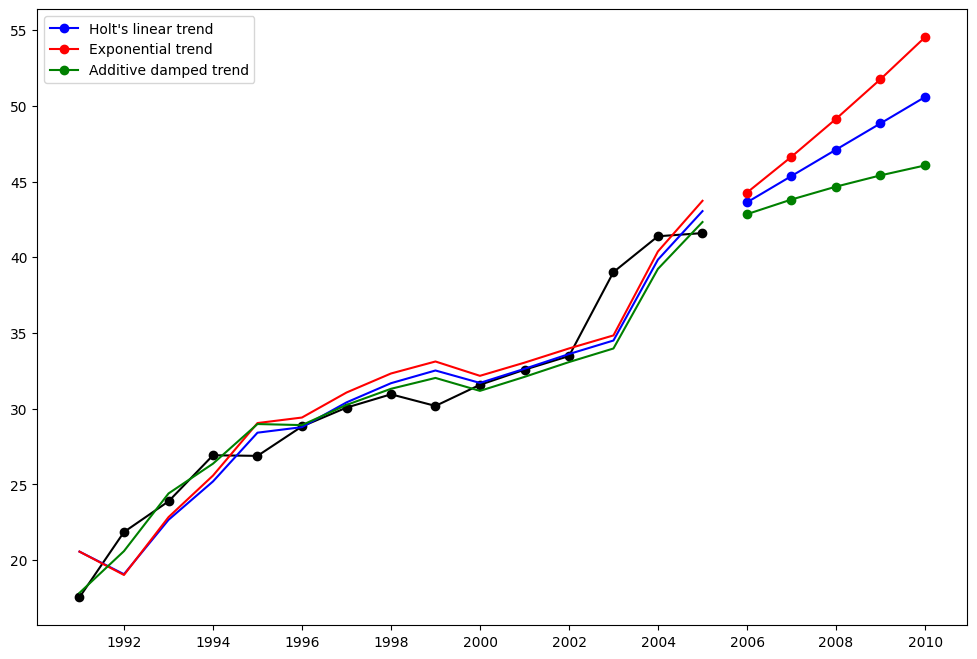

In [ ]:
fit1 = Holt(air, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2, optimized=False
)
fcast1 = fit1.forecast(5).rename("Holt's linear trend")
fit2 = Holt(air, exponential=True, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2, optimized=False
)
fcast2 = fit2.forecast(5).rename("Exponential trend")
fit3 = Holt(air, damped_trend=True, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2
)
fcast3 = fit3.forecast(5).rename("Additive damped trend")

plt.figure(figsize=(12, 8))
plt.plot(air, marker="o", color="black")
plt.plot(fit1.fittedvalues, color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])


####Seasonally adjusted data

In [ ]:
fit1 = SimpleExpSmoothing(livestock2, initialization_method="estimated").fit()
fit2 = Holt(livestock2, initialization_method="estimated").fit()
fit3 = Holt(livestock2, exponential=True, initialization_method="estimated").fit()
fit4 = Holt(livestock2, damped_trend=True, initialization_method="estimated").fit(
    damping_trend=0.98
)
fit5 = Holt(
    livestock2, exponential=True, damped_trend=True, initialization_method="estimated"
).fit()
params = [
    "smoothing_level",
    "smoothing_trend",
    "damping_trend",
    "initial_level",
    "initial_trend",
]
results = pd.DataFrame(
    index=[r"$\alpha$", r"$\beta$", r"$\phi$", r"$l_0$", "$b_0$", "SSE"],
    columns=["SES", "Holt's", "Exponential", "Additive", "Multiplicative"],
)
results["SES"] = [fit1.params[p] for p in params] + [fit1.sse]
results["Holt's"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Exponential"] = [fit3.params[p] for p in params] + [fit3.sse]
results["Additive"] = [fit4.params[p] for p in params] + [fit4.sse]
results["Multiplicative"] = [fit5.params[p] for p in params] + [fit5.sse]
results


,SES,Holt's,Exponential,Additive,Multiplicative
$\alpha$,1.000000,0.974338,0.977642,0.978843,0.974912
$\beta$,NaN,0.000000,0.000000,0.000008,0.000000
$\phi$,NaN,NaN,NaN,0.980000,0.981646
$l_0$,263.917703,258.882683,260.335599,257.357716,258.951817
$b_0$,NaN,5.010856,1.013780,6.645297,1.038144
SSE,6761.350235,6004.138207,6104.194782,6036.597169,6081.995045


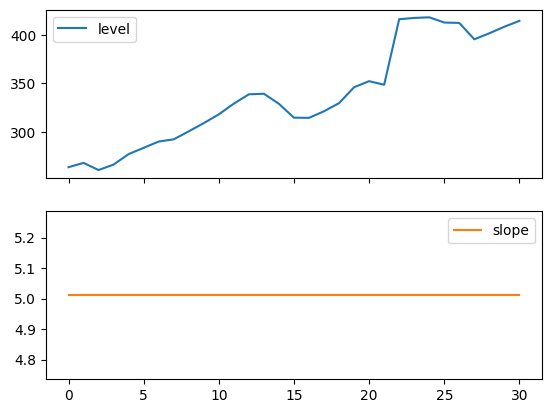

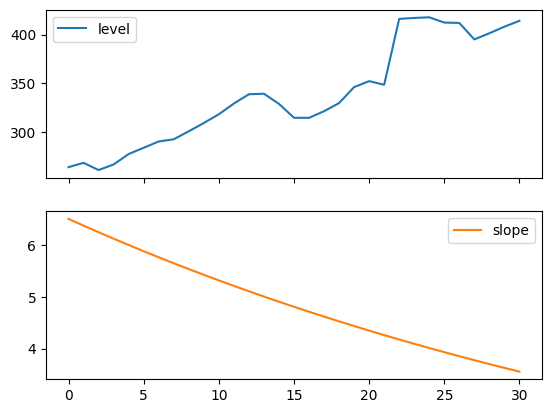

Figure 7.4: Level and slope components for Holt’s linear trend method and the additive damped trend method.


In [ ]:
for fit in [fit2, fit4]:
    pd.DataFrame(np.c_[fit.level, fit.trend]).rename(
        columns={0: "level", 1: "slope"}
    ).plot(subplots=True)
plt.show()
print(
    "Figure 7.4: Level and slope components for Holt’s linear trend method and the additive damped trend method."
)


####Comparison

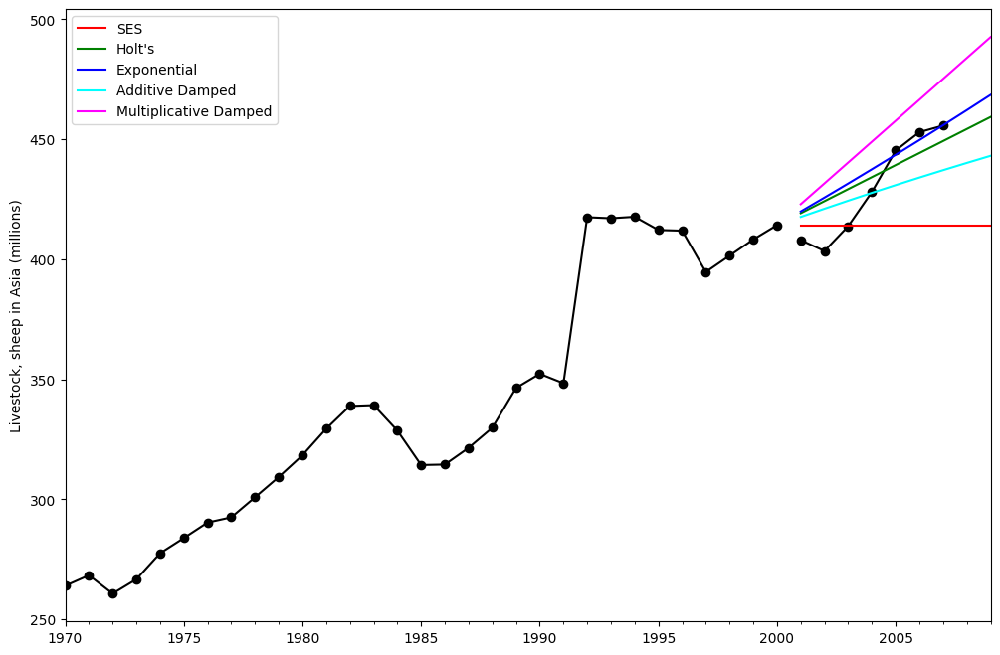

Figure 7.5: Forecasting livestock, sheep in Asia: comparing forecasting performance of non-seasonal methods.


In [ ]:
fit1 = SimpleExpSmoothing(livestock2, initialization_method="estimated").fit()
fcast1 = fit1.forecast(9).rename("SES")
fit2 = Holt(livestock2, initialization_method="estimated").fit()
fcast2 = fit2.forecast(9).rename("Holt's")
fit3 = Holt(livestock2, exponential=True, initialization_method="estimated").fit()
fcast3 = fit3.forecast(9).rename("Exponential")
fit4 = Holt(livestock2, damped_trend=True, initialization_method="estimated").fit(
    damping_trend=0.98
)
fcast4 = fit4.forecast(9).rename("Additive Damped")
fit5 = Holt(
    livestock2, exponential=True, damped_trend=True, initialization_method="estimated"
).fit()
fcast5 = fit5.forecast(9).rename("Multiplicative Damped")

ax = livestock2.plot(color="black", marker="o", figsize=(12, 8))
livestock3.plot(ax=ax, color="black", marker="o", legend=False)
fcast1.plot(ax=ax, color="red", legend=True)
fcast2.plot(ax=ax, color="green", legend=True)
fcast3.plot(ax=ax, color="blue", legend=True)
fcast4.plot(ax=ax, color="cyan", legend=True)
fcast5.plot(ax=ax, color="magenta", legend=True)
ax.set_ylabel("Livestock, sheep in Asia (millions)")
plt.show()
print(
    "Figure 7.5: Forecasting livestock, sheep in Asia: comparing forecasting performance of non-seasonal methods."
)


####Holt’s Winters Seasonal

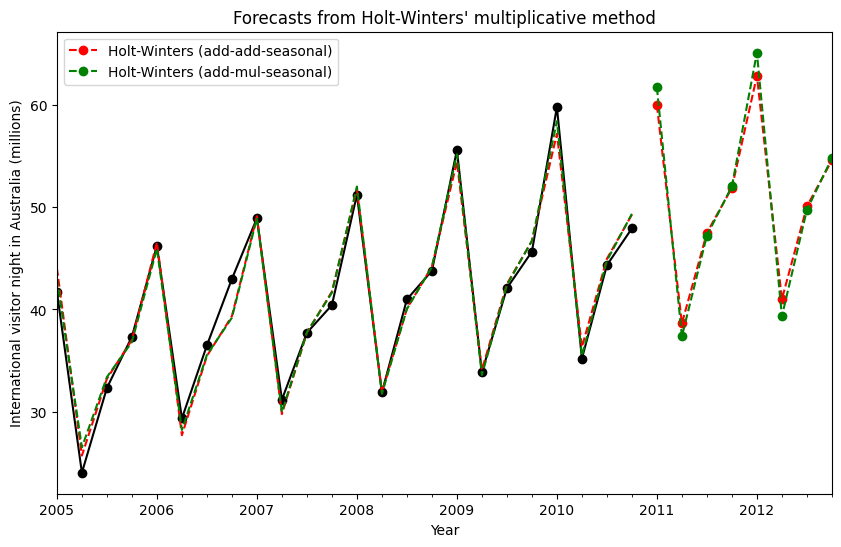

Figure 7.6: Forecasting international visitor nights in Australia using Holt-Winters method with both additive and multiplicative seasonality.


,Additive,Multiplicative,Additive Dam,Multiplica Dam
$\alpha$,1.490116e-08,1.490116e-08,1.490116e-08,1.490116e-08
$\beta$,1.409862e-08,3.449544e-23,6.490775e-09,5.042224e-09
$\phi$,NaN,NaN,9.430416e-01,9.536044e-01
$\gamma$,1.829110e-16,2.550777e-15,3.872323e-16,5.847315e-16
$l_0$,1.119347e+01,1.106378e+01,1.084021e+01,9.899276e+00
$b_0$,1.205396e-01,1.198959e-01,2.456749e-01,1.975442e-01
SSE,4.402746e+01,3.611262e+01,3.527619e+01,3.062033e+01


In [ ]:
fit1 = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="add",
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit2 = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit3 = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="add",
    damped_trend=True,
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit4 = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    damped_trend=True,
    use_boxcox=True,
    initialization_method="estimated",
).fit()
results = pd.DataFrame(
    index=[r"$\alpha$", r"$\beta$", r"$\phi$", r"$\gamma$", r"$l_0$", "$b_0$", "SSE"]
)
params = [
    "smoothing_level",
    "smoothing_trend",
    "damping_trend",
    "smoothing_seasonal",
    "initial_level",
    "initial_trend",
]
results["Additive"] = [fit1.params[p] for p in params] + [fit1.sse]
results["Multiplicative"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Additive Dam"] = [fit3.params[p] for p in params] + [fit3.sse]
results["Multiplica Dam"] = [fit4.params[p] for p in params] + [fit4.sse]

ax = aust.plot(
    figsize=(10, 6),
    marker="o",
    color="black",
    title="Forecasts from Holt-Winters' multiplicative method",
)
ax.set_ylabel("International visitor night in Australia (millions)")
ax.set_xlabel("Year")
fit1.fittedvalues.plot(ax=ax, style="--", color="red")
fit2.fittedvalues.plot(ax=ax, style="--", color="green")

fit1.forecast(8).rename("Holt-Winters (add-add-seasonal)").plot(
    ax=ax, style="--", marker="o", color="red", legend=True
)
fit2.forecast(8).rename("Holt-Winters (add-mul-seasonal)").plot(
    ax=ax, style="--", marker="o", color="green", legend=True
)

plt.show()
print(
    "Figure 7.6: Forecasting international visitor nights in Australia using Holt-Winters method with both additive and multiplicative seasonality."
)

results


In [ ]:
fit1 = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="add",
    initialization_method="estimated",
).fit()
fit2 = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    initialization_method="estimated",
).fit()


In [ ]:
df = pd.DataFrame(
    np.c_[aust, fit1.level, fit1.trend, fit1.season, fit1.fittedvalues],
    columns=[r"$y_t$", r"$l_t$", r"$b_t$", r"$s_t$", r"$\hat{y}_t$"],
    index=aust.index,
)
forecasts = fit1.forecast(8).rename(r"$\hat{y}_t$").to_frame()
df = pd.concat([df, forecasts], axis=0, sort=True)


In [ ]:
df = pd.DataFrame(
    np.c_[aust, fit2.level, fit2.trend, fit2.season, fit2.fittedvalues],
    columns=[r"$y_t$", r"$l_t$", r"$b_t$", r"$s_t$", r"$\hat{y}_t$"],
    index=aust.index,
)
forecasts = fit2.forecast(8).rename(r"$\hat{y}_t$").to_frame()
df = pd.concat([df, forecasts], axis=0, sort=True)


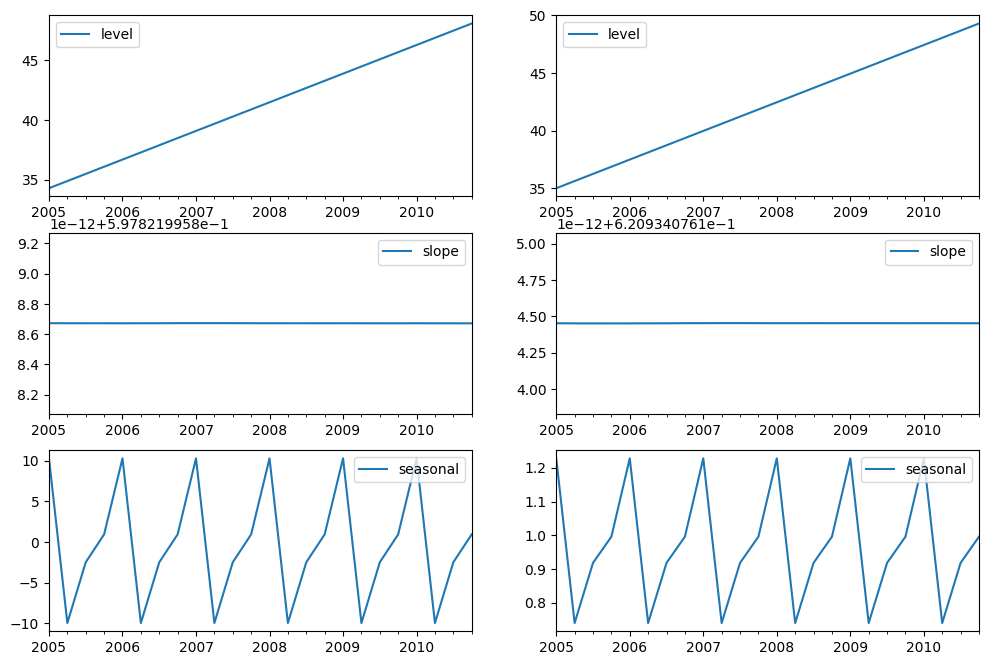

In [ ]:
states1 = pd.DataFrame(
    np.c_[fit1.level, fit1.trend, fit1.season],
    columns=["level", "slope", "seasonal"],
    index=aust.index,
)
states2 = pd.DataFrame(
    np.c_[fit2.level, fit2.trend, fit2.season],
    columns=["level", "slope", "seasonal"],
    index=aust.index,
)
fig, [[ax1, ax4], [ax2, ax5], [ax3, ax6]] = plt.subplots(3, 2, figsize=(12, 8))
states1[["level"]].plot(ax=ax1)
states1[["slope"]].plot(ax=ax2)
states1[["seasonal"]].plot(ax=ax3)
states2[["level"]].plot(ax=ax4)
states2[["slope"]].plot(ax=ax5)
states2[["seasonal"]].plot(ax=ax6)
plt.show()


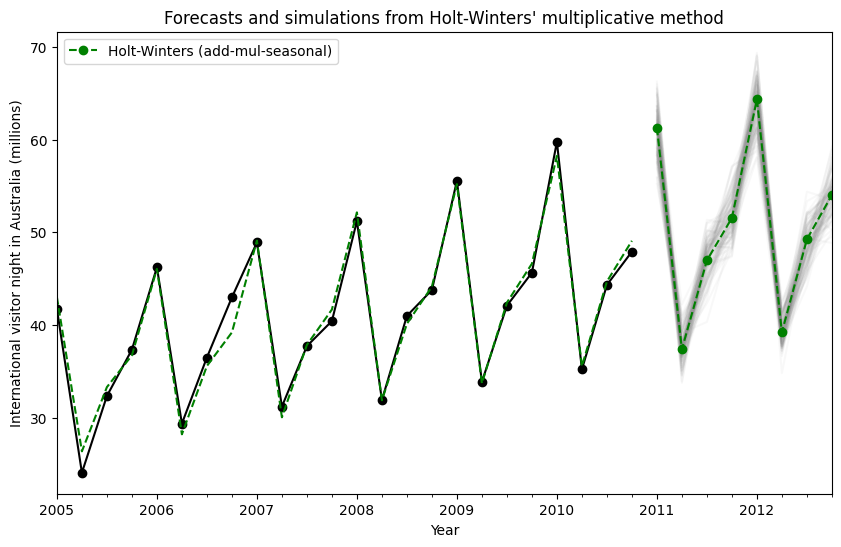

In [ ]:
fit = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    initialization_method="estimated",
).fit()
simulations = fit.simulate(8, repetitions=100, error="mul")

ax = aust.plot(
    figsize=(10, 6),
    marker="o",
    color="black",
    title="Forecasts and simulations from Holt-Winters' multiplicative method",
)
ax.set_ylabel("International visitor night in Australia (millions)")
ax.set_xlabel("Year")
fit.fittedvalues.plot(ax=ax, style="--", color="green")
simulations.plot(ax=ax, style="-", alpha=0.05, color="grey", legend=False)
fit.forecast(8).rename("Holt-Winters (add-mul-seasonal)").plot(
    ax=ax, style="--", marker="o", color="green", legend=True
)
plt.show()


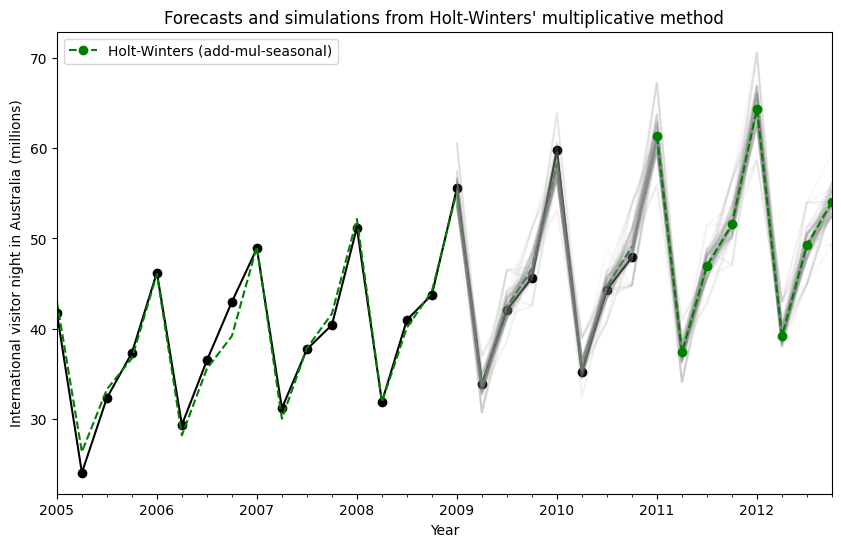

In [ ]:
fit = ExponentialSmoothing(
    aust,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    initialization_method="estimated",
).fit()
simulations = fit.simulate(
    16, anchor="2009-01-01", repetitions=100, error="mul", random_errors="bootstrap"
)

ax = aust.plot(
    figsize=(10, 6),
    marker="o",
    color="black",
    title="Forecasts and simulations from Holt-Winters' multiplicative method",
)
ax.set_ylabel("International visitor night in Australia (millions)")
ax.set_xlabel("Year")
fit.fittedvalues.plot(ax=ax, style="--", color="green")
simulations.plot(ax=ax, style="-", alpha=0.05, color="grey", legend=False)
fit.forecast(8).rename("Holt-Winters (add-mul-seasonal)").plot(
    ax=ax, style="--", marker="o", color="green", legend=True
)
plt.show()


### Моделирование данных о продаже вина в Австралии в statsmodels

In [ ]:
au = pd.read_csv('monthly_australian_wine_sales.csv')

In [ ]:
index = pd.date_range(start="1980-01-01", end="1994-08-01", freq="MS")
audata = pd.Series(list(au['sales']), index)


Text(0, 0.5, 'Sales')

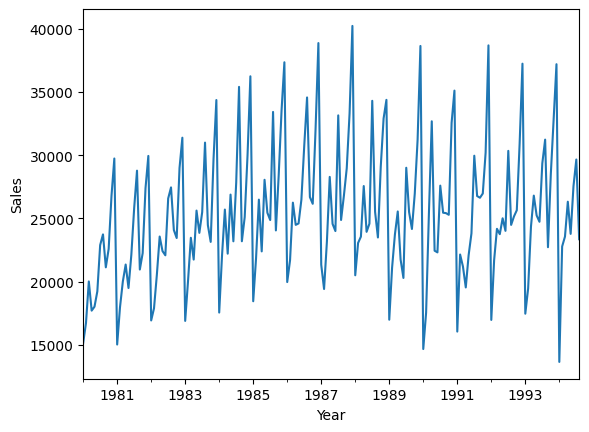

In [ ]:
ax = audata.plot()
ax.set_xlabel("Year")
ax.set_ylabel("Sales")

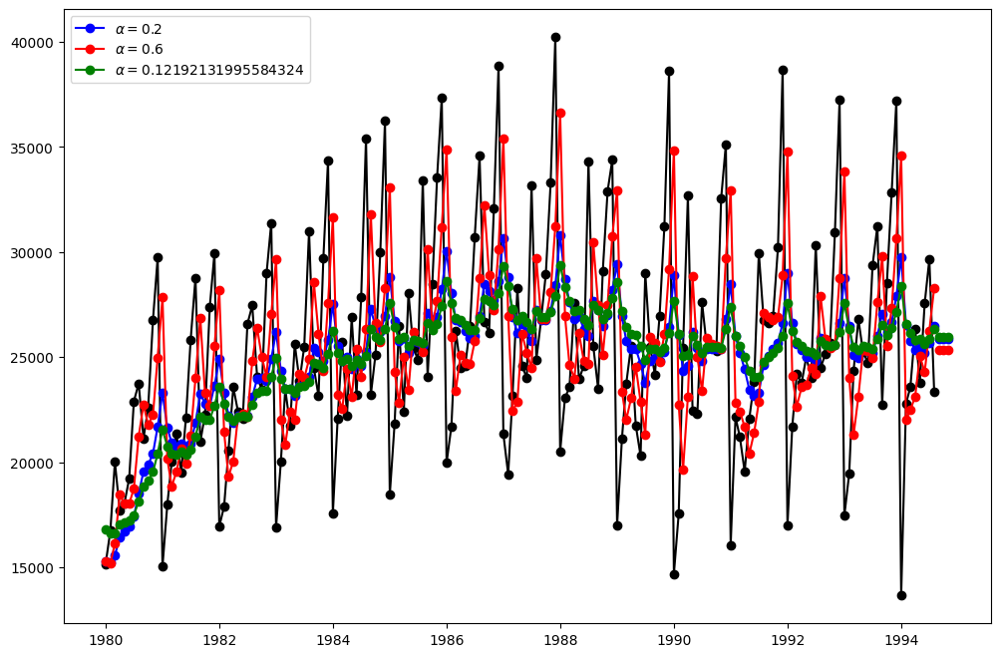

In [ ]:
fit1 = SimpleExpSmoothing(audata, initialization_method="heuristic").fit(
    smoothing_level=0.2, optimized=False
)
fcast1 = fit1.forecast(3).rename(r"$\alpha=0.2$")
fit2 = SimpleExpSmoothing(audata, initialization_method="heuristic").fit(
    smoothing_level=0.6, optimized=False
)
fcast2 = fit2.forecast(3).rename(r"$\alpha=0.6$")
fit3 = SimpleExpSmoothing(audata, initialization_method="estimated").fit()
fcast3 = fit3.forecast(3).rename(r"$\alpha=%s$" % fit3.model.params["smoothing_level"])

plt.figure(figsize=(12, 8))
plt.plot(audata, marker="o", color="black")
plt.plot(fit1.fittedvalues, marker="o", color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, marker="o", color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, marker="o", color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])

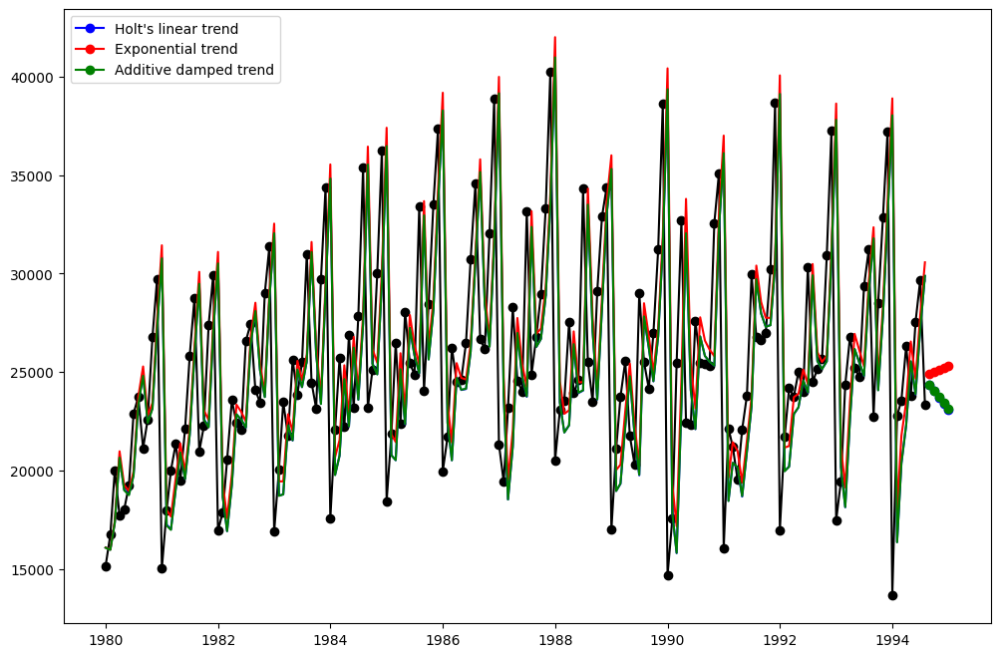

In [ ]:
fit1 = Holt(audata, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2, optimized=False
)
fcast1 = fit1.forecast(5).rename("Holt's linear trend")
fit2 = Holt(audata, exponential=True, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2, optimized=False
)
fcast2 = fit2.forecast(5).rename("Exponential trend")
fit3 = Holt(audata, damped_trend=True, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2
)
fcast3 = fit3.forecast(5).rename("Additive damped trend")

plt.figure(figsize=(12, 8))
plt.plot(audata, marker="o", color="black")
plt.plot(fit1.fittedvalues, color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])


In [ ]:
fit1 = SimpleExpSmoothing(audata, initialization_method="estimated").fit()
fit2 = Holt(audata, initialization_method="estimated").fit()
fit3 = Holt(audata, exponential=True, initialization_method="estimated").fit()
fit4 = Holt(audata, damped_trend=True, initialization_method="estimated").fit(
    damping_trend=0.98
)
fit5 = Holt(
    audata, exponential=True, damped_trend=True, initialization_method="estimated"
).fit()
params = [
    "smoothing_level",
    "smoothing_trend",
    "damping_trend",
    "initial_level",
    "initial_trend",
]
results = pd.DataFrame(
    index=[r"$\alpha$", r"$\beta$", r"$\phi$", r"$l_0$", "$b_0$", "SSE"],
    columns=["SES", "Holt's", "Exponential", "Additive", "Multiplicative"],
)
results["SES"] = [fit1.params[p] for p in params] + [fit1.sse]
results["Holt's"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Exponential"] = [fit3.params[p] for p in params] + [fit3.sse]
results["Additive"] = [fit4.params[p] for p in params] + [fit4.sse]
results["Multiplicative"] = [fit5.params[p] for p in params] + [fit5.sse]
results


,SES,Holt's,Exponential,Additive,Multiplicative
$\alpha$,1.219213e-01,9.928571e-02,1.464286e-01,7.571429e-02,1.228571e-01
$\beta$,NaN,9.928571e-02,1.372768e-01,7.571429e-02,1.228571e-01
$\phi$,NaN,NaN,NaN,9.800000e-01,9.900000e-01
$l_0$,1.682048e+04,1.527707e+04,1.527707e+04,1.527707e+04,1.527707e+04
$b_0$,NaN,8.077152e+02,1.052871e+00,8.077152e+02,1.062958e+00
SSE,4.938291e+09,5.122696e+09,5.441806e+09,4.946701e+09,5.328973e+09


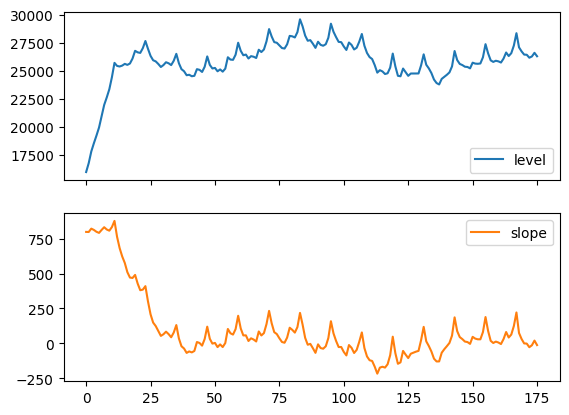

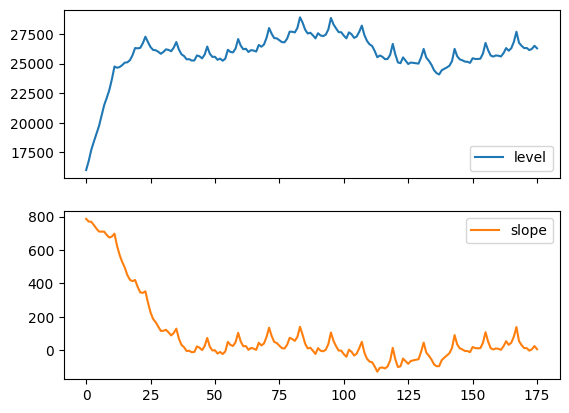

In [ ]:
for fit in [fit2, fit4]:
    pd.DataFrame(np.c_[fit.level, fit.trend]).rename(
        columns={0: "level", 1: "slope"}
    ).plot(subplots=True)
plt.show()

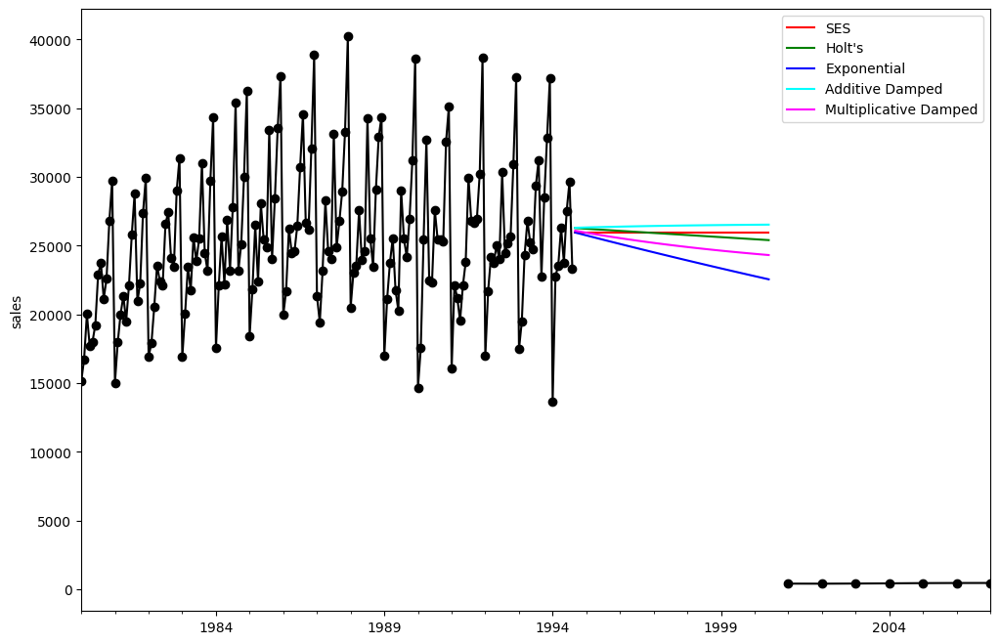

In [ ]:
fit1 = SimpleExpSmoothing(audata, initialization_method="estimated").fit()
fcast1 = fit1.forecast(70).rename("SES")
fit2 = Holt(audata, initialization_method="estimated").fit()
fcast2 = fit2.forecast(70).rename("Holt's")
fit3 = Holt(audata, exponential=True, initialization_method="estimated").fit()
fcast3 = fit3.forecast(70).rename("Exponential")
fit4 = Holt(audata, damped_trend=True, initialization_method="estimated").fit(
    damping_trend=0.98
)
fcast4 = fit4.forecast(70).rename("Additive Damped")
fit5 = Holt(
    audata, exponential=True, damped_trend=True, initialization_method="estimated"
).fit()
fcast5 = fit5.forecast(70).rename("Multiplicative Damped")

ax = audata.plot(color="black", marker="o", figsize=(12, 8))
livestock3.plot(ax=ax, color="black", marker="o", legend=False)
fcast1.plot(ax=ax, color="red", legend=True)
fcast2.plot(ax=ax, color="green", legend=True)
fcast3.plot(ax=ax, color="blue", legend=True)
fcast4.plot(ax=ax, color="cyan", legend=True)
fcast5.plot(ax=ax, color="magenta", legend=True)
ax.set_ylabel("sales")
plt.show()


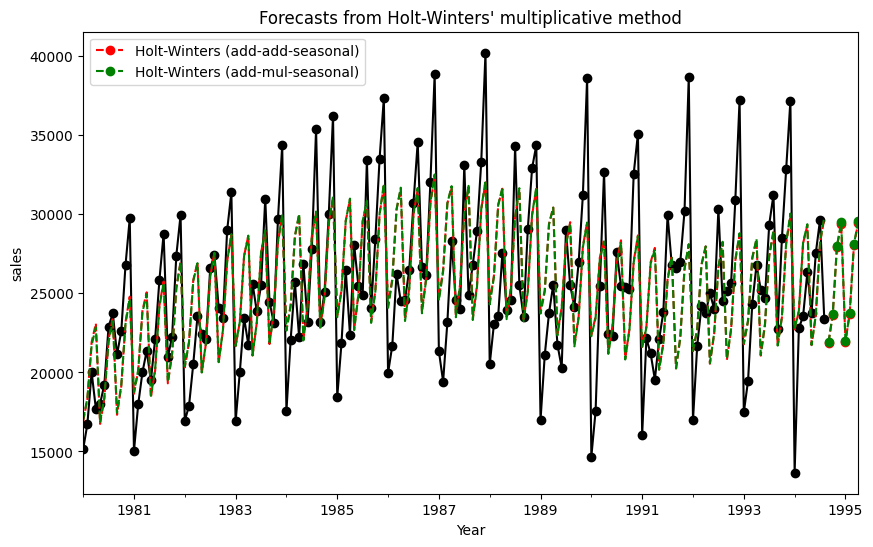

,Additive,Multiplicative,Additive Dam,Multiplica Dam
$\alpha$,5.962909e-02,6.137817e-02,1.490135e-08,2.343291e-08
$\beta$,5.962909e-02,6.137817e-02,1.411170e-08,1.286650e-08
$\phi$,NaN,NaN,9.455264e-01,9.451982e-01
$\gamma$,0.000000e+00,0.000000e+00,1.880106e-13,0.000000e+00
$l_0$,3.943651e+01,4.027435e+01,3.851401e+01,4.121954e+01
$b_0$,7.439135e-02,7.607970e-02,2.333476e-01,2.537572e-01
SSE,2.887656e+09,2.866193e+09,2.777510e+09,2.774060e+09


In [ ]:
fit1 = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="add",
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit2 = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit3 = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="add",
    damped_trend=True,
    use_boxcox=True,
    initialization_method="estimated",
).fit()
fit4 = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    damped_trend=True,
    use_boxcox=True,
    initialization_method="estimated",
).fit()
results = pd.DataFrame(
    index=[r"$\alpha$", r"$\beta$", r"$\phi$", r"$\gamma$", r"$l_0$", "$b_0$", "SSE"]
)
params = [
    "smoothing_level",
    "smoothing_trend",
    "damping_trend",
    "smoothing_seasonal",
    "initial_level",
    "initial_trend",
]
results["Additive"] = [fit1.params[p] for p in params] + [fit1.sse]
results["Multiplicative"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Additive Dam"] = [fit3.params[p] for p in params] + [fit3.sse]
results["Multiplica Dam"] = [fit4.params[p] for p in params] + [fit4.sse]

ax = audata.plot(
    figsize=(10, 6),
    marker="o",
    color="black",
    title="Forecasts from Holt-Winters' multiplicative method",
)
ax.set_ylabel("sales")
ax.set_xlabel("Year")
fit1.fittedvalues.plot(ax=ax, style="--", color="red")
fit2.fittedvalues.plot(ax=ax, style="--", color="green")

fit1.forecast(8).rename("Holt-Winters (add-add-seasonal)").plot(
    ax=ax, style="--", marker="o", color="red", legend=True
)
fit2.forecast(8).rename("Holt-Winters (add-mul-seasonal)").plot(
    ax=ax, style="--", marker="o", color="green", legend=True
)

plt.show()

results


In [ ]:
fit1 = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="add",
    initialization_method="estimated",
).fit()
fit2 = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    initialization_method="estimated",
).fit()


In [ ]:
df = pd.DataFrame(
    np.c_[audata, fit1.level, fit1.trend, fit1.season, fit1.fittedvalues],
    columns=[r"$y_t$", r"$l_t$", r"$b_t$", r"$s_t$", r"$\hat{y}_t$"],
    index=audata.index,
)
forecasts = fit1.forecast(8).rename(r"$\hat{y}_t$").to_frame()
df = pd.concat([df, forecasts], axis=0, sort=True)


In [ ]:
df = pd.DataFrame(
    np.c_[audata, fit2.level, fit2.trend, fit2.season, fit2.fittedvalues],
    columns=[r"$y_t$", r"$l_t$", r"$b_t$", r"$s_t$", r"$\hat{y}_t$"],
    index=audata.index,
)
forecasts = fit2.forecast(8).rename(r"$\hat{y}_t$").to_frame()
df = pd.concat([df, forecasts], axis=0, sort=True)


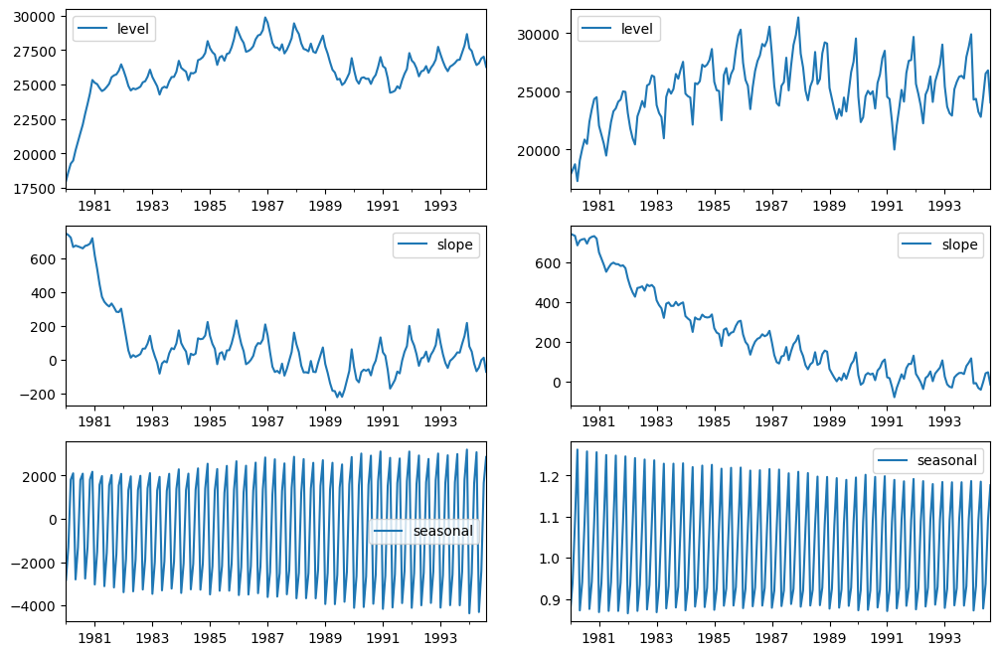

In [ ]:
states1 = pd.DataFrame(
    np.c_[fit1.level, fit1.trend, fit1.season],
    columns=["level", "slope", "seasonal"],
    index=audata.index,
)
states2 = pd.DataFrame(
    np.c_[fit2.level, fit2.trend, fit2.season],
    columns=["level", "slope", "seasonal"],
    index=audata.index,
)
fig, [[ax1, ax4], [ax2, ax5], [ax3, ax6]] = plt.subplots(3, 2, figsize=(12, 8))
states1[["level"]].plot(ax=ax1)
states1[["slope"]].plot(ax=ax2)
states1[["seasonal"]].plot(ax=ax3)
states2[["level"]].plot(ax=ax4)
states2[["slope"]].plot(ax=ax5)
states2[["seasonal"]].plot(ax=ax6)
plt.show()


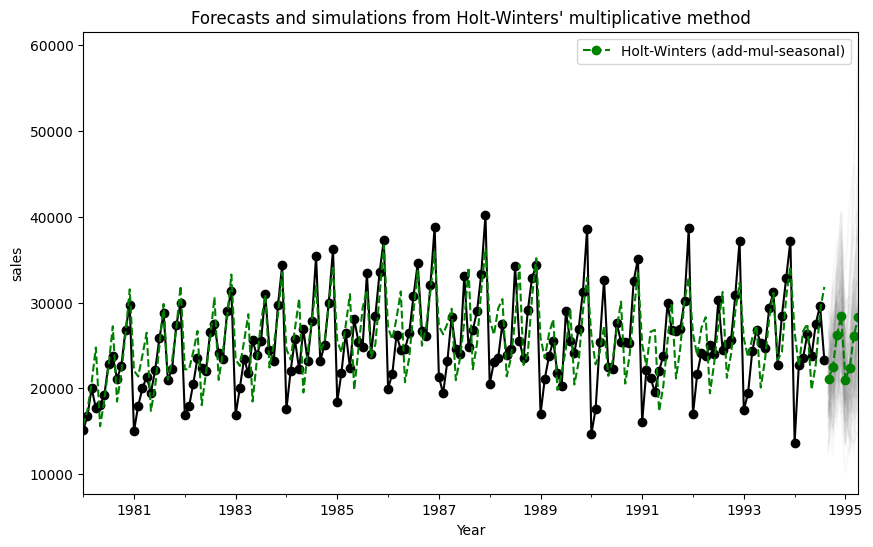

In [ ]:
fit = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    initialization_method="estimated",
).fit()
simulations = fit.simulate(8, repetitions=100, error="mul")

ax = audata.plot(
    figsize=(10, 6),
    marker="o",
    color="black",
    title="Forecasts and simulations from Holt-Winters' multiplicative method",
)
ax.set_ylabel("sales")
ax.set_xlabel("Year")
fit.fittedvalues.plot(ax=ax, style="--", color="green")
simulations.plot(ax=ax, style="-", alpha=0.05, color="grey", legend=False)
fit.forecast(8).rename("Holt-Winters (add-mul-seasonal)").plot(
    ax=ax, style="--", marker="o", color="green", legend=True
)
plt.show()


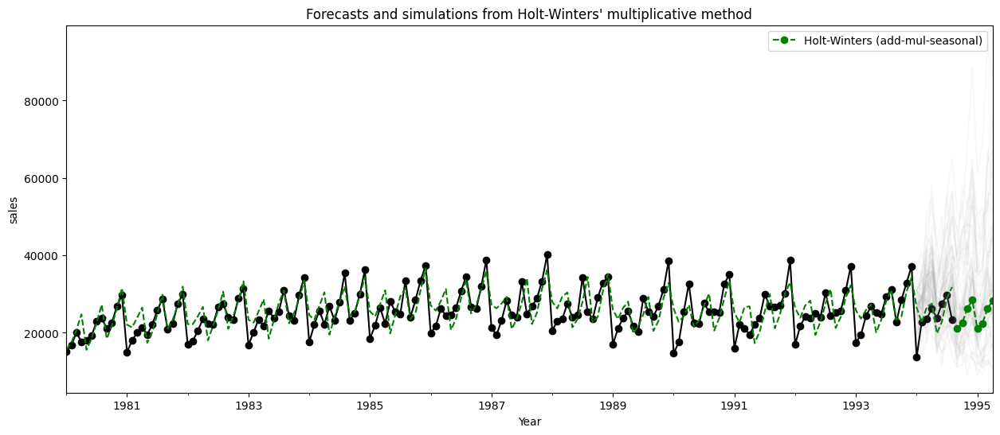

In [ ]:
fit = ExponentialSmoothing(
    audata,
    seasonal_periods=4,
    trend="add",
    seasonal="mul",
    initialization_method="estimated",
).fit()
simulations = fit.simulate(
    16, anchor="1994-01-01", repetitions=50, error="mul", random_errors="bootstrap"
)

ax = audata.plot(
    figsize=(15, 6),
    marker="o",
    color="black",
    title="Forecasts and simulations from Holt-Winters' multiplicative method",
)
ax.set_ylabel("sales")
ax.set_xlabel("Year")
fit.fittedvalues.plot(ax=ax, style="--", color="green")
simulations.plot(ax=ax, style="-", alpha=0.05, color="grey", legend=False)
fit.forecast(8).rename("Holt-Winters (add-mul-seasonal)").plot(
    ax=ax, style="--", marker="o", color="green", legend=True
)
plt.show()


## ETNA. Прогнозирование данных о прожае вина в Австралии

Пример работы с моделью Хольта-Винтерса

### HoltWintersModel

In [ ]:
df = pd.read_csv('monthly_australian_wine_sales.csv')
df.head()

df['timestamp'] = pd.to_datetime(df['month'])
df['target'] = df['sales']
df.drop(columns=['month', 'sales'], inplace = True)
df['segment'] = 'main'
df.head()

,timestamp,target,segment
0,1980-01-01,15136,main
1,1980-02-01,16733,main
2,1980-03-01,20016,main
3,1980-04-01,17708,main
4,1980-05-01,18019,main


In [ ]:
df2 = TSDataset.to_dataset(df)
df2.head()

segment,main
feature,target
timestamp,
1980-01-01,15136
1980-02-01,16733
1980-03-01,20016
1980-04-01,17708
1980-05-01,18019


In [ ]:
ts = TSDataset(df2, 'MS')

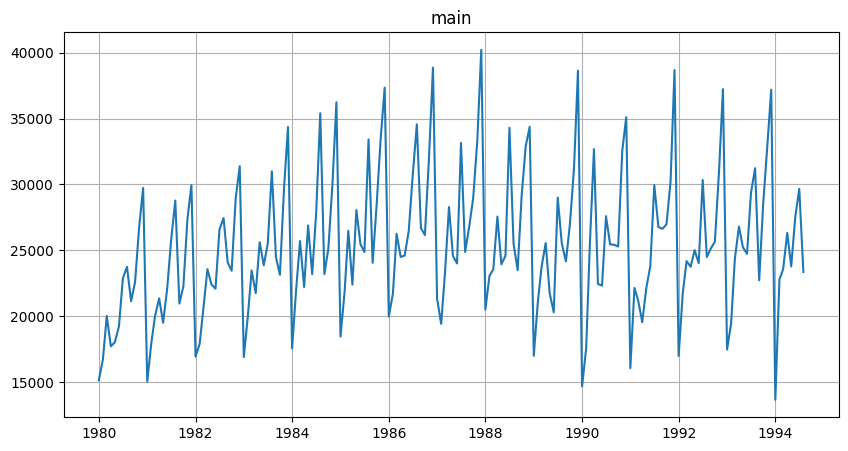

In [ ]:
ts.plot()

In [ ]:
HORIZON = 8

In [ ]:
# Разбиваем набор на обучающую и тестовую выборки с учетом временной структуры.
train_ts, test_ts = ts.train_test_split(
    train_start='1980-01-01',
    train_end='1993-12-01',
    test_start='1994-01-01',
    test_end='1994-08-01'
)

In [ ]:
from etna.models import HoltWintersModel

In [ ]:
# создаем модель
model = HoltWintersModel(
    seasonal='additive',
    trend='additive',
    seasonal_periods=12,
    smoothing_level=0.05,
    smoothing_trend=0.01,
    smoothing_seasonal=0.35
)

In [ ]:
# обучаем модель
model.fit(train_ts)
# формируем набор, для которого нужно получить прогнозы,
# длина набора определяется горизонтом прогнозирования
future_ts = train_ts.make_future(HORIZON)
# получаем прогнозы
forecast_ts = model.forecast(future_ts)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,17816.784840
1994-02-01,21239.066370
1994-03-01,24640.906207
1994-04-01,26170.241624
1994-05-01,24933.699510
1994-06-01,24651.297061
1994-07-01,30434.862128
1994-08-01,28558.901073


In [ ]:
smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'main': 9.624965013905875}

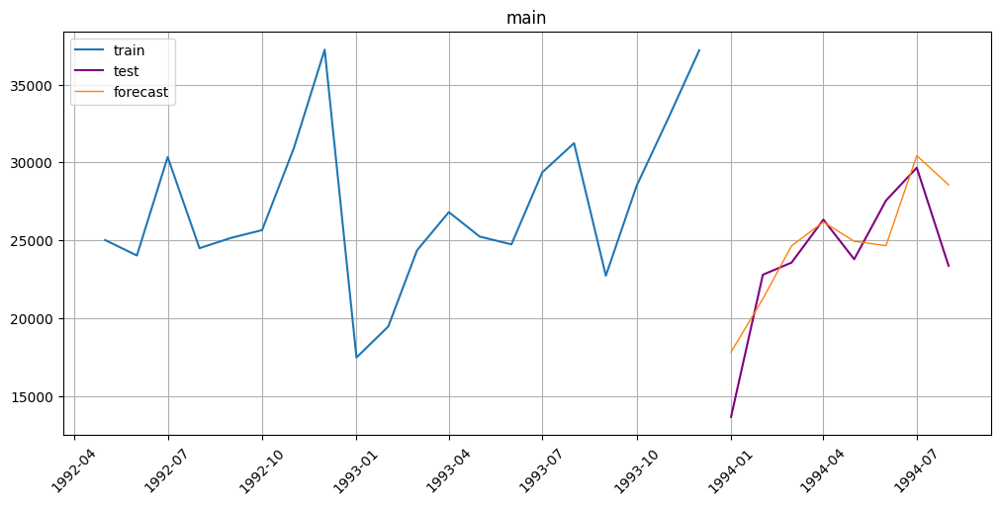

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=20)

[Документация библиотеки Etna](https://etna-docs.netlify.app/)

В документации по библиотеке etna найти инфу о моделях `SimpleExpSmoothingModel`, `HoltModel`, `HoltWintersModel`. Подобрать параметры и выстроить модели со значением метрики `smape` не больше `9.7`.

###SimpleExpSmoothingModel

In [ ]:
from etna.models import SimpleExpSmoothingModel

In [ ]:
# создаем модель
model = SimpleExpSmoothingModel(
    seasonal='additive',
    trend='additive',
    initialization_method = 'heuristic',
    smoothing_level=0.3,
)

In [ ]:
# обучаем модель
model.fit(train_ts)
# формируем набор, для которого нужно получить прогнозы,
# длина набора определяется горизонтом прогнозирования
future_ts = train_ts.make_future(HORIZON)
# получаем прогнозы
forecast_ts = model.forecast(future_ts)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,17885.675960
1994-02-01,21312.969734
1994-03-01,24643.840276
1994-04-01,26048.954851
1994-05-01,24697.625168
1994-06-01,24432.792047
1994-07-01,30263.014022
1994-08-01,28509.466278


In [ ]:
smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'main': 9.588381032625854}

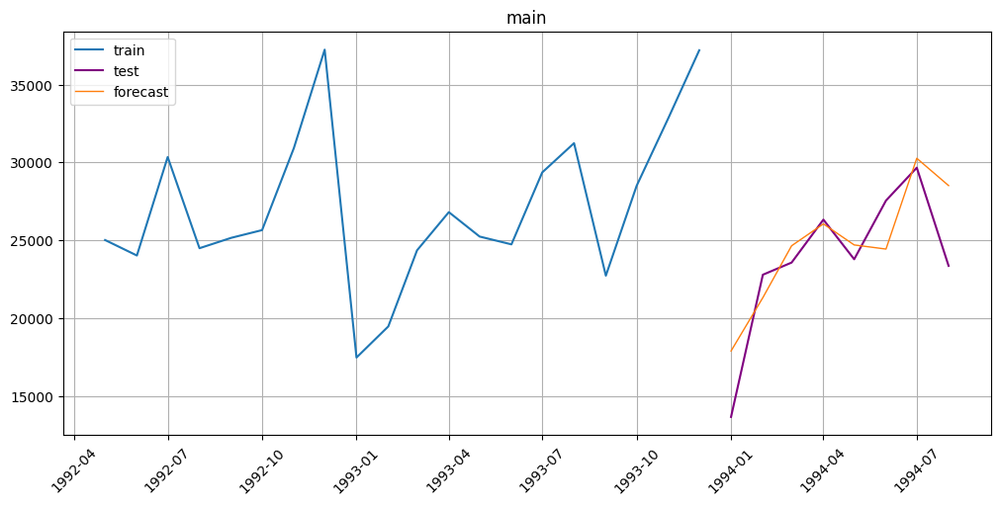

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=20)

###HoltModel

In [ ]:
from etna.models import HoltModel

In [ ]:
# создаем модель
model = HoltModel(
    seasonal='additive',
    exponential = False,
    seasonal_periods=12,
    smoothing_level=0.25,
    smoothing_trend=0.01,
)

In [ ]:
# обучаем модель
model.fit(train_ts)
# формируем набор, для которого нужно получить прогнозы,
# длина набора определяется горизонтом прогнозирования
future_ts = train_ts.make_future(HORIZON)
# получаем прогнозы
forecast_ts = model.forecast(future_ts)
forecast_ts

segment,main
feature,target
timestamp,
1994-01-01,17969.080899
1994-02-01,21391.651198
1994-03-01,24723.283685
1994-04-01,26161.045600
1994-05-01,24803.493665
1994-06-01,24516.915749
1994-07-01,30350.835585
1994-08-01,28523.741866


In [ ]:
smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'main': 9.639039277460974}

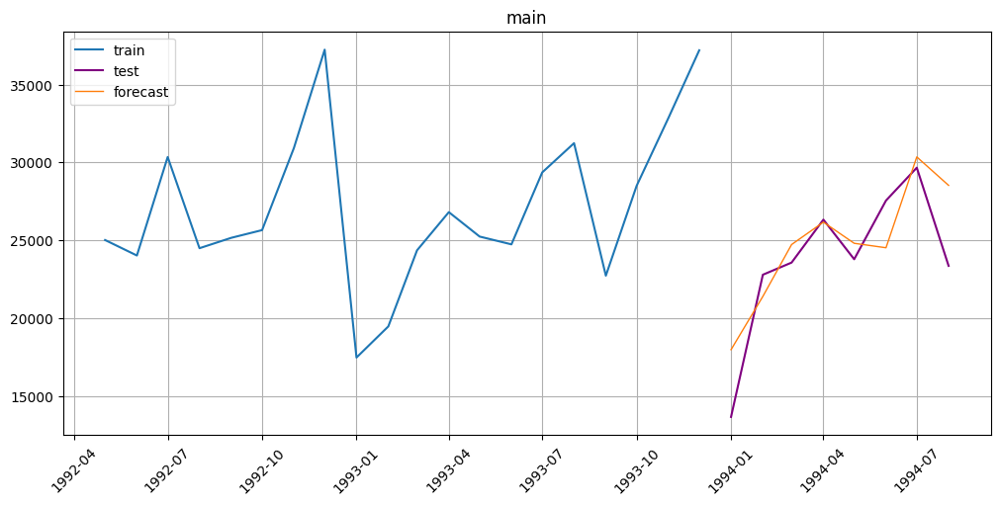

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=20)

## РГР

In [ ]:
import pandas as pd
from etna.datasets.tsdataset import TSDataset
from etna.metrics import SMAPE
from etna.analysis import plot_forecast
df = pd.read_csv('DelhiClimate.csv', index_col=[0])

In [ ]:
df.drop(index = 1461, inplace = True)

In [ ]:
df1 = df.drop(columns = ['humidity', 'wind_speed', 'meanpressure'])
df2 = df.drop(columns = ['meantemp', 'wind_speed', 'meanpressure'])
df3 = df.drop(columns = ['humidity', 'meantemp', 'meanpressure'])
#df4 = df.drop(columns = ['humidity', 'wind_speed', 'meantemp'])
df1['segment'] = 'meantemp'
df2['segment'] = 'humidity'
df3['segment'] = 'windspeed'
#df4['segment'] = 'meanpressure'
df1.rename(columns={"meantemp": "target"}, inplace = True)
df2.rename(columns={"humidity": "target"}, inplace = True)
df3.rename(columns={"wind_speed": "target"}, inplace = True)
#df4.rename(columns={"meanpressure": "target"}, inplace = True)
df5 = pd.concat([df1, df2, df3])
df5.rename(columns={"date": "timestamp"}, inplace = True)
df5['timestamp'] = pd.to_datetime(df5['timestamp'])

In [ ]:
df6 = TSDataset.to_dataset(df5)

In [ ]:
ts = TSDataset(df6, 'D')

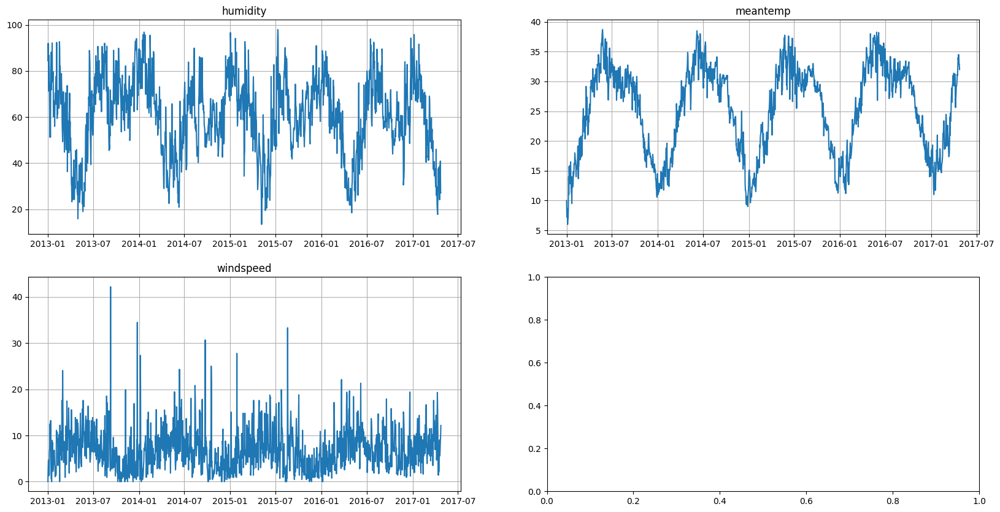

In [ ]:
ts.plot()

In [ ]:
from etna.models import HoltWintersModel
from etna.models import SimpleExpSmoothingModel
from etna.models import HoltModel

In [ ]:
HORIZON = 31
train_ts, test_ts = ts.train_test_split(test_size=HORIZON)


In [ ]:
# создаем модель
model = HoltWintersModel(
    seasonal='additive',
    trend='additive',
    seasonal_periods=12,
    smoothing_level=0.05,
    smoothing_trend=0.01,
    smoothing_seasonal=0.35
)

In [ ]:
model.fit(train_ts)
future_ts = train_ts.make_future(HORIZON)
forecast_ts = model.forecast(future_ts)
forecast_ts

segment,humidity,meantemp,windspeed
feature,target,target,target
timestamp,,,
2017-03-25,49.165013,22.234120,8.191173
2017-03-26,53.119541,22.350036,6.414012
2017-03-27,50.027719,22.057986,7.600681
2017-03-28,47.302343,23.430983,7.218285
2017-03-29,52.681181,22.017505,10.746687
2017-03-30,47.367367,22.838476,8.421397
2017-03-31,46.648891,23.394399,8.568481
2017-04-01,50.325409,22.669263,10.242727


In [ ]:
smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'humidity': 44.119915481675385,
 'meantemp': 28.90860921439123,
 'windspeed': 41.193640915446665}

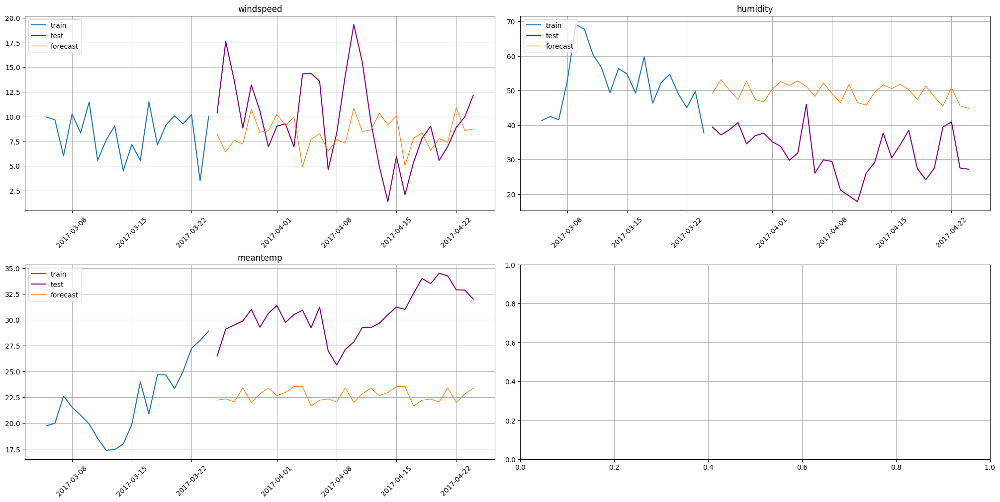

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=20)

In [ ]:
# создаем модель
model = SimpleExpSmoothingModel(
    seasonal='additive',
    trend='additive',
    initialization_method = 'heuristic',
    smoothing_level=0.5,
)
model.fit(train_ts)
future_ts = train_ts.make_future(HORIZON)
forecast_ts = model.forecast(future_ts)
forecast_ts

segment,humidity,meantemp,windspeed
feature,target,target,target
timestamp,,,
2017-03-25,44.960256,27.783250,8.158134
2017-03-26,44.807498,27.733531,7.702689
2017-03-27,43.573999,27.887931,8.464929
2017-03-28,43.334828,27.940028,8.503278
2017-03-29,42.820099,28.076520,8.371908
2017-03-30,42.522008,28.023146,8.327696
2017-03-31,43.299496,27.971454,8.361829
2017-04-01,44.770599,27.870387,8.188903


In [ ]:
smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'humidity': 32.30031188042304,
 'meantemp': 9.252779683238662,
 'windspeed': 39.77544653516058}

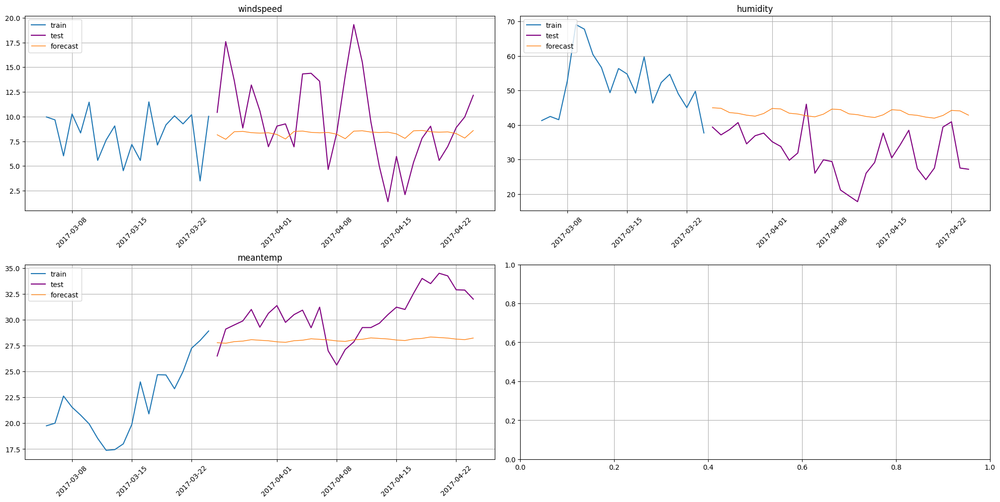

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=20)


In [ ]:
# создаем модель
model = HoltModel(
    seasonal='additive',
    exponential = False,
    seasonal_periods=12,
    smoothing_level=0.5,
    smoothing_trend=0.01,
)
model.fit(train_ts)
future_ts = train_ts.make_future(HORIZON)
forecast_ts = model.forecast(future_ts)
forecast_ts

segment,humidity,meantemp,windspeed
feature,target,target,target
timestamp,,,
2017-03-25,42.511112,28.017981,8.593103
2017-03-26,42.326272,28.064780,8.494405
2017-03-27,41.248148,28.116569,9.299793
2017-03-28,41.305979,28.183818,9.149517
2017-03-29,41.434385,28.229361,9.070069
2017-03-30,41.047163,28.428850,8.403117
2017-03-31,40.577980,28.537336,8.555824
2017-04-01,40.731808,28.717390,8.256105


In [ ]:
smape = SMAPE()
smape(y_true=test_ts, y_pred=forecast_ts)

{'humidity': 24.224460639424723,
 'meantemp': 6.831547454258842,
 'windspeed': 38.696051535889595}

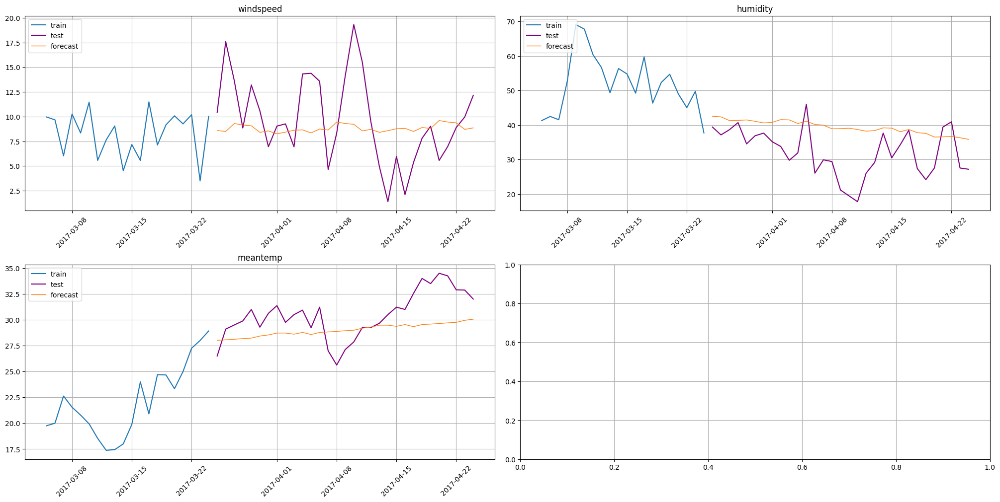

In [ ]:
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=20)


#**Лабораторное занятие 7**

#NBEATS

В отличие от DeepAR в данной архитектуре используются не рекуррентные слои, а полносвязные.

Сеть получает на вход временной ряд и пропускает его через несколько полносвязных слоев. Затем выход с последнего слоя направляется по двум путям: backcast (моделирует прошлые значения) и forecast (моделирует будущие значения). Эта часть называется блоком сети.

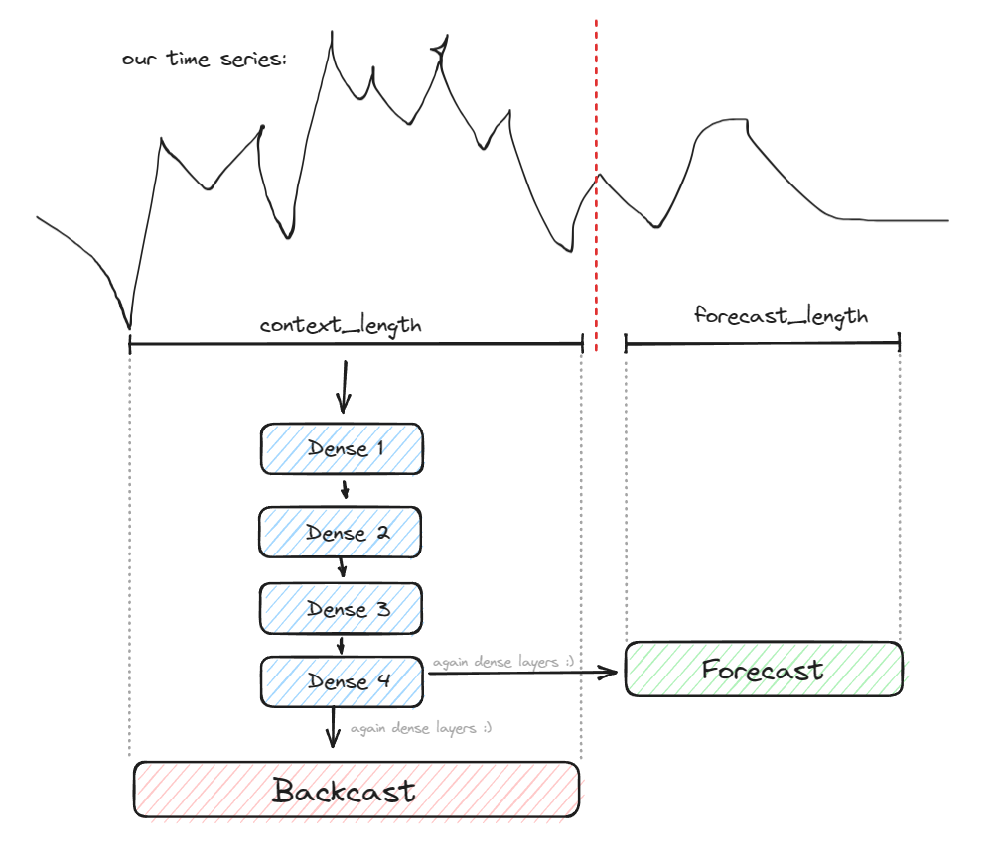

Теперь смотрим на картинку снизу, часть слева. Выход backcast (левая стрелка от блока) вычитается из входного вектора перед следующим блоком, а выход forecast прибавляется к вектору прогноза от предыдущего блока. Такая архитектура позволяет backcast отфильтровать только необходимую информацию из входных данных, а forecast скорректировать прогноз и уменьшить ошибку (сильно напоминает идею градиентного бустинга, не правда ли?). Такая последовательность блоков называется стеком. Выходы со всех стеков также суммируются, и мы получаем глобальный прогноз.

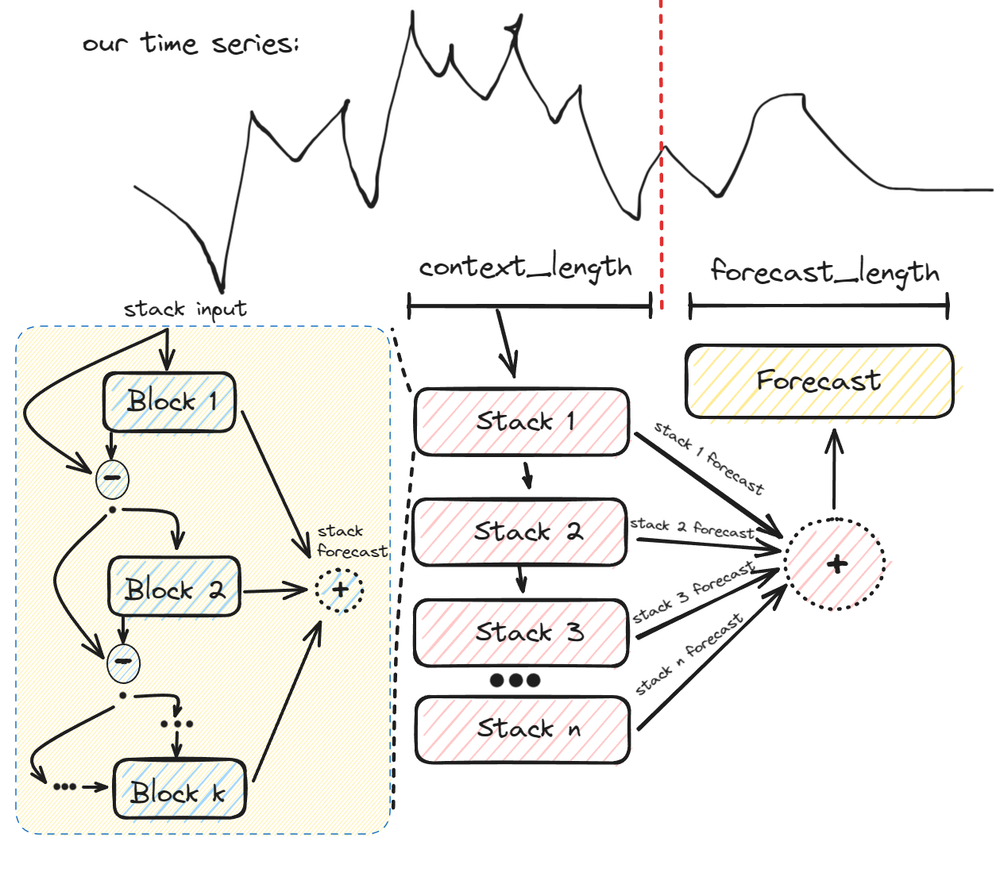

Такая архитектура имеет ряд преимуществ, а именно: быстрее обучается, поскольку нет рекуррентных блоков, а также обладает возможностью тонкой настройки путей backast и forecast, что позволяет достичь очень высокой точности прогнозирования.

У архитектуры NBEATS есть еще одно важное преимущество. Модель способна выделить тренд и сезонную компоненту из каждого исследуемого временного ряда, что повышает интерпретируемость прогнозов. Это особенно важно при непосредственном анализе временных рядов, чтобы заметить изменения в поведении трафика, возможно, обосновать их причины.

# DEEPAR

Первая модель, которой мы коснемся - DeepAR (deep auto regression). Эта модель состоит из нескольких рекуррентных блоков(как правило используются ячейки LSTM или GRU). При этом, тип ячейки, размер скрытого слоя и количество рекуррентных ячеек - это настраиваемые гиперпараметры модели.

Модель называется авторегрессионной, потому что на каждом временном шаге мы передаем в ячейку не только значение скрытого слоя с предыдущего шага(как в обычных рекуррентных сетях), но и предыдущее значение временного ряда/прогноз с предыдущего шага (во время обучения/прогноза на тесте).

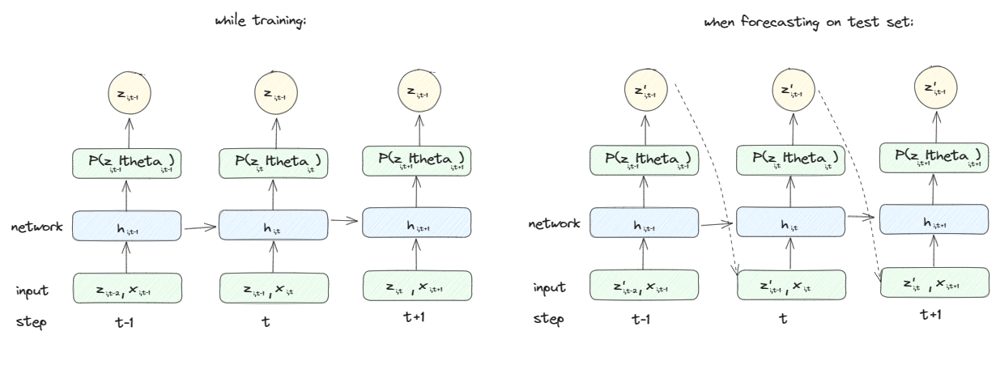

Вторая важная идея, на которой построена модель - мы учим ее предсказывать не действительное значение временного ряда, а параметры распределения значений временного ряда таким образом, чтобы максимизировать правдоподобие полученной выборки. В качестве прогноза мы берем среднее значение полученного распределения.

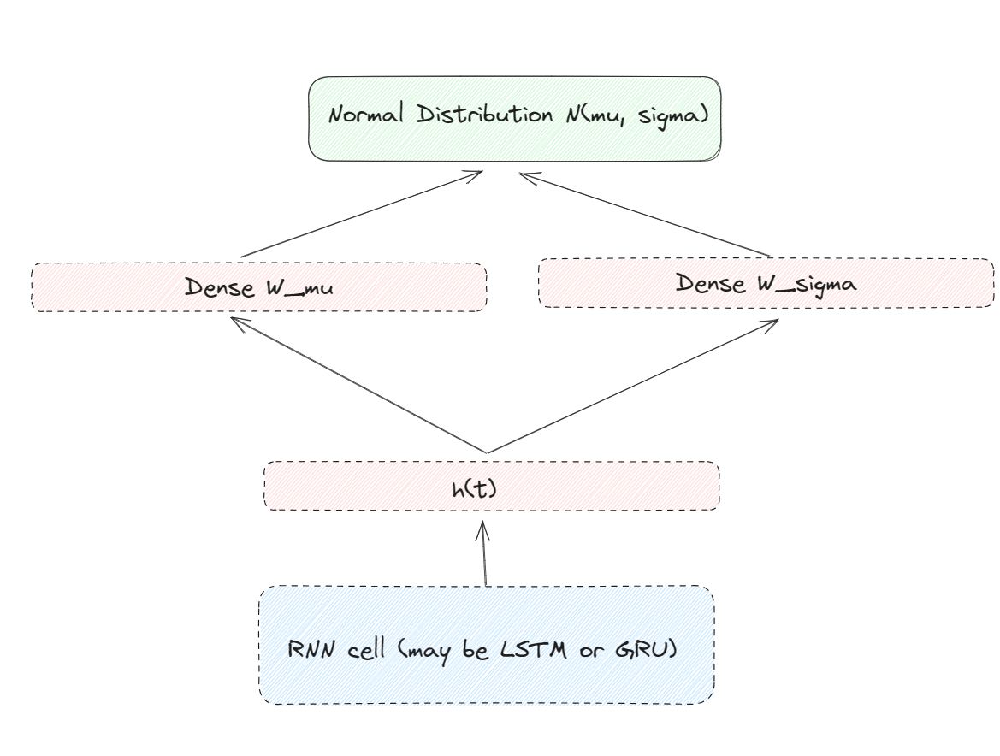

За счет того, что модель возвращает при прогнозе параметры распределения, мы можем осуществлять вероятностный прогноз - то есть возвращать интервалы, в которые с заданной точностью попадает будущее значение временного ряда. Такая возможность может быть очень полезной во многих задачах.

Стоит также отметить, что DeepAR позволяет использовать дополнительные признаки при прогнозировании и обучаться на многих временных рядах одновременно.

## РГР

#**Лабораторное занятие 8**

https://drive.google.com/drive/folders/11tGh1z7XfKEceQluF13vMmTLbta7RZ2w

## Анализ данных

In [ ]:
import warnings

# Settings the warnings to be ignored
warnings.filterwarnings('ignore')

from tqdm.notebook import tqdm
import datetime

# second part
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

from scipy import stats

import statsmodels.tsa.api as ts
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler

import statsmodels as sm
from statsmodels.tsa.statespace.varmax import VARMAX
from statsmodels.tsa.api import VAR


import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})

In [ ]:
!wget https://media.githubusercontent.com/media/THECODEDEMOGORGON/TS_DL_workshop/main/data/full_data_sum.csv

--2024-05-19 18:59:56--  https://media.githubusercontent.com/media/THECODEDEMOGORGON/TS_DL_workshop/main/data/full_data_sum.csv
Resolving media.githubusercontent.com (media.githubusercontent.com)... 185.199.111.133, 185.199.108.133, 185.199.110.133, ...
Connecting to media.githubusercontent.com (media.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 344159591 (328M) [text/plain]
Saving to: ‘full_data_sum.csv’

full_data_sum.csv   100%[===================>] 328.22M   271MB/s    in 1.2s    

2024-05-19 19:00:01 (271 MB/s) - ‘full_data_sum.csv’ saved [344159591/344159591]



In [ ]:
%%time
df = pd.read_csv('./full_data_sum.csv')
df['date'] = pd.to_datetime(df['date'])
df['dt'] = pd.to_datetime(df.date) + df.hour.astype('timedelta64[h]')

CPU times: user 3.92 s, sys: 374 ms, total: 4.29 s
Wall time: 4.35 s


In [ ]:
df

,square_id,date,hour,sms_in,sms_out,call_in,call_out,internet,dt
0,48,2013-10-31,23,10.466148,5.085509,4.017373,3.098583,921.901244,2013-10-31 23:00:00
1,48,2013-11-01,0,4.657351,3.054674,2.605716,2.348039,804.563753,2013-11-01 00:00:00
2,48,2013-11-01,1,4.883931,3.289720,1.509068,0.316719,806.867571,2013-11-01 01:00:00
3,48,2013-11-01,2,2.522158,0.806494,0.274891,0.585070,812.316221,2013-11-01 02:00:00
4,48,2013-11-01,3,2.053634,0.888435,1.104906,0.497522,639.142303,2013-11-01 03:00:00
...,...,...,...,...,...,...,...,...,...
3137828,9987,2014-01-01,18,20.552035,10.466213,13.017935,24.573671,402.703638,2014-01-01 18:00:00
3137829,9987,2014-01-01,19,21.248123,16.718503,12.415021,10.591490,410.096122,2014-01-01 19:00:00
3137830,9987,2014-01-01,20,15.456689,8.256480,5.809288,8.035154,411.594966,2014-01-01 20:00:00
3137831,9987,2014-01-01,21,10.774990,10.883610,5.936621,7.315528,394.161006,2014-01-01 21:00:00


In [ ]:
print(len(df.square_id.unique()))

2109


In [ ]:
df.square_id.value_counts()

square_id
48      1488
7086    1488
7079    1488
7078    1488
7077    1488
        ... 
4672    1486
4875    1484
4471    1479
5439    1319
5440    1319
Name: count, Length: 2109, dtype: int64

In [ ]:
series = ['internet', 'sms_in', 'sms_out', 'call_in', 'call_out']
nans = df[series].isna().sum()
nans

internet    0
sms_in      0
sms_out     0
call_in     0
call_out    0
dtype: int64

In [ ]:
def standardize_group(series):
    """
    Стандартизация значений в группе.

    Параметры:
    - series (pandas.Series): Входной столбец данных.

    Возвращает:
    - pandas.Series: Стандартизированные значения входного столбца данных.
    """
    return (series - series.mean()) / series.std()

def vis_col(input_data: pd.DataFrame,
            col: str,
            scaled=False):
    """
    Визуализация данных для определенного столбца в DataFrame.

    Параметры:
    - input_data (pd.DataFrame): Исходные данные в виде DataFrame.
    - col (str): Название столбца данных, который нужно визуализировать.
    - scaled (bool, optional): Флаг для стандартизации значений столбца. По умолчанию False.

    Возвращает:
    - None: Ничего не возвращает, но рисует графики для визуализации данных.

    Пример использования:
    vis_col(data_frame, 'column_name', scaled=True)
    """

    df_ = input_data.copy()

    # Стандартизация значений колонки, если флаг установлен
    if scaled:
        df_[col] = df_.groupby('square_id')[col].transform(standardize_group)

    # Инициализация подграфиков
    fig, axs = plt.subplots(ncols=4, nrows=2, figsize=(30,15))
    ax1 = axs[0, 0]  # График 1
    ax2 = axs[0, 1]  # График 2
    gs = axs[0, 1].get_gridspec()
    axs[1, 0].remove()
    axs[1, 1].remove()
    axs[0, 2].remove()
    axs[0, 3].remove()
    axs[1, 2].remove()
    axs[1, 3].remove()
    ax3 = fig.add_subplot(gs[1, 0:2])  # График 3
    ax4 = fig.add_subplot(gs[0:1, 2:4])  # График 4 (АКФ)
    ax5 = fig.add_subplot(gs[1, 2:4])  # График 5 (Частная АКФ)

    example = df_[df_.square_id==1150].set_index('date')[col]

    # Усредненное значение интернет-нагрузки за каждый час
    _agg = df_.groupby(['date', 'hour'])[col].mean()
    _agg = _agg.reset_index().set_index('date')[col]

    # График 1: Распределение значений столбца
    sns.histplot(df_[col], bins=100, ax=ax1).set(title=f'Распределение значений {col}');

    # График 2: Пример изменения столбца на одной станции
    sns.lineplot(x=example.index,
                 y=example.values,
                 errorbar='ci',
                 err_style='band', ax=ax2).set(title=f'Пример изменения {col} на одной станции');
    ax2.tick_params(axis='x', rotation=45)

    # График 3: Изменение среднего значения столбца за исследуемый период
    sns.lineplot(data=_agg,
                 errorbar='ci',
                 err_style='band', ax=ax3).set(title=f'Изменение среднего значения {col} за исследуемый период');
    ax3.tick_params(axis='x', rotation=45)

    # График 4: Автокорреляционная функция (АКФ) столбца
    nlags = 24 * 7
    corrs, ccnf_intervals = ts.acf(_agg, nlags=nlags, alpha=.05)
    sns.barplot(x=np.arange(0,nlags+1), y=corrs, ax=ax4).set(title=f'АКФ признака {col} за периоды от 1 до {nlags} часов');
    ax4.xaxis.set_ticks(np.arange(0, nlags+1, 10))
    ax4.tick_params(axis='x', rotation=45)

    # График 5: Частная автокорреляционная функция (Частная АКФ) столбца
    nlags = 72
    corrs, ccnf_intervals = ts.pacf(_agg, nlags=nlags, alpha=.05)
    sns.barplot(x=np.arange(0,nlags+1), y=corrs, ax=ax5).set(title=f'Частная АКФ признака {col} за периоды от 1 до {nlags} часов');
    ax5.xaxis.set_ticks(np.arange(0, nlags+1, 10))
    ax5.tick_params(axis='x', rotation=45)

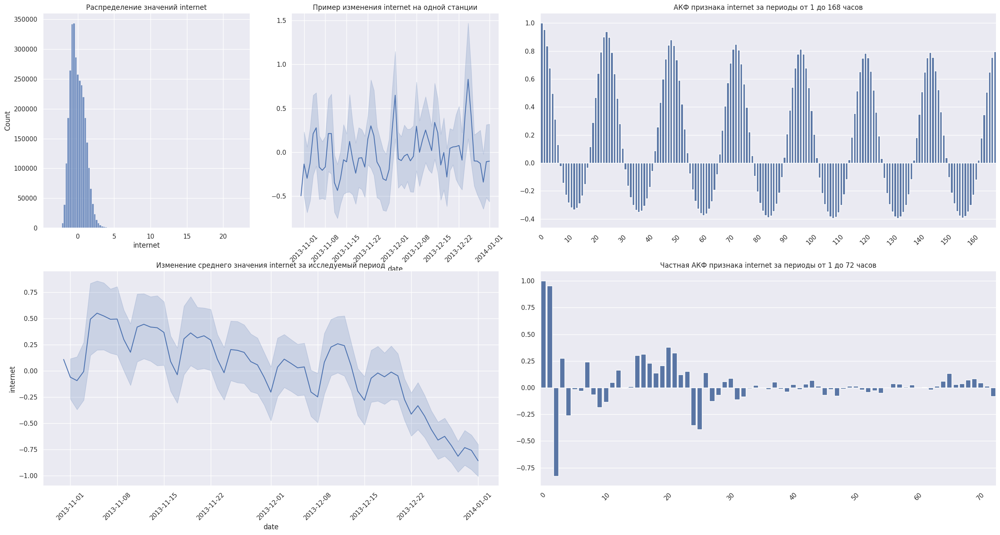

In [ ]:
vis_col(df, 'internet', scaled=True)

In [ ]:
from statsmodels.tsa.stattools import adfuller

In [ ]:
# Проверка стационарности для изначальных данных
p_vals = []
for s in tqdm(df.square_id.unique()[:200]):
    row = df[df.square_id == s].internet
    p = sm.tsa.stattools.adfuller(row)[1]
    p_vals.append(p)

  0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:
# Проверка стационарности для данных после преобразования Бокса-Кокса
p_vals_box = []
for s in tqdm(df.square_id.unique()[:200]):
    row, lmbda = stats.boxcox(df[df.square_id == s].internet)
    p = sm.tsa.stattools.adfuller(row)[1]
    p_vals_box.append(p)

  0%|          | 0/200 [00:00<?, ?it/s]

In [ ]:
# Проверка стационарности для данных после сезонного дифференцирования
p_vals_stationary = []
for s in tqdm(df.square_id.unique()[:200]):
    row, lmbda = stats.boxcox(df[df.square_id == s].internet)
    row = pd.Series(row) - pd.Series(row).shift(24)
    p = sm.tsa.stattools.adfuller(row[24:])[1]
    p_vals_stationary.append(p)

  0%|          | 0/200 [00:00<?, ?it/s]

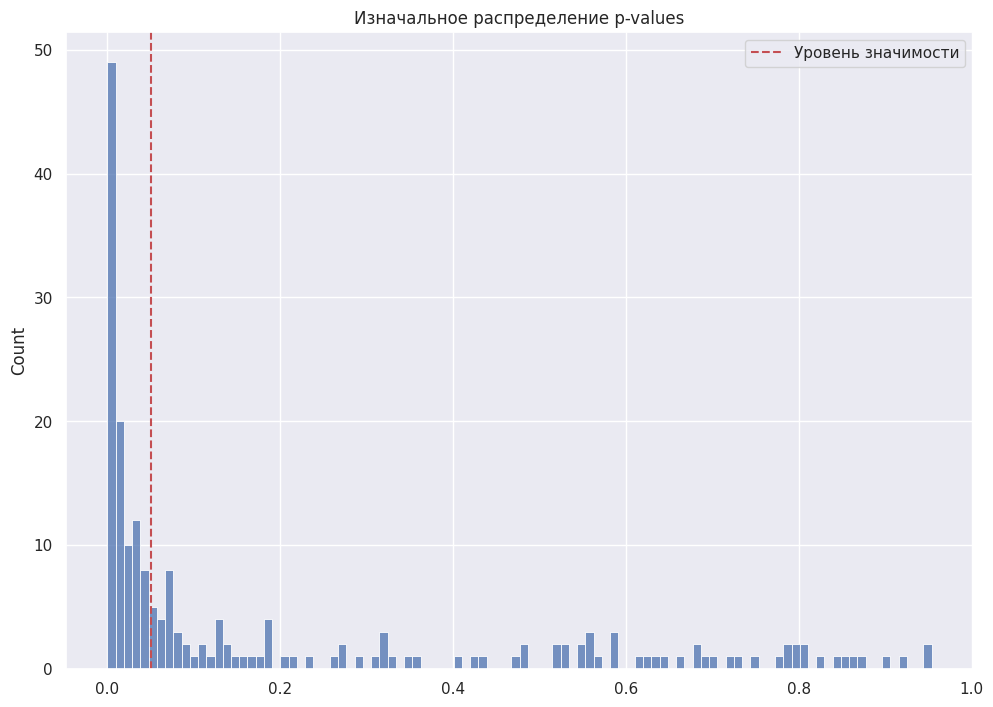

In [ ]:

plt.title('Изначальное распределение p-values')
sns.histplot(p_vals, bins=100)
plt.axvline(x=0.05, color='r', linestyle='--', label='Уровень значимости')
plt.legend();

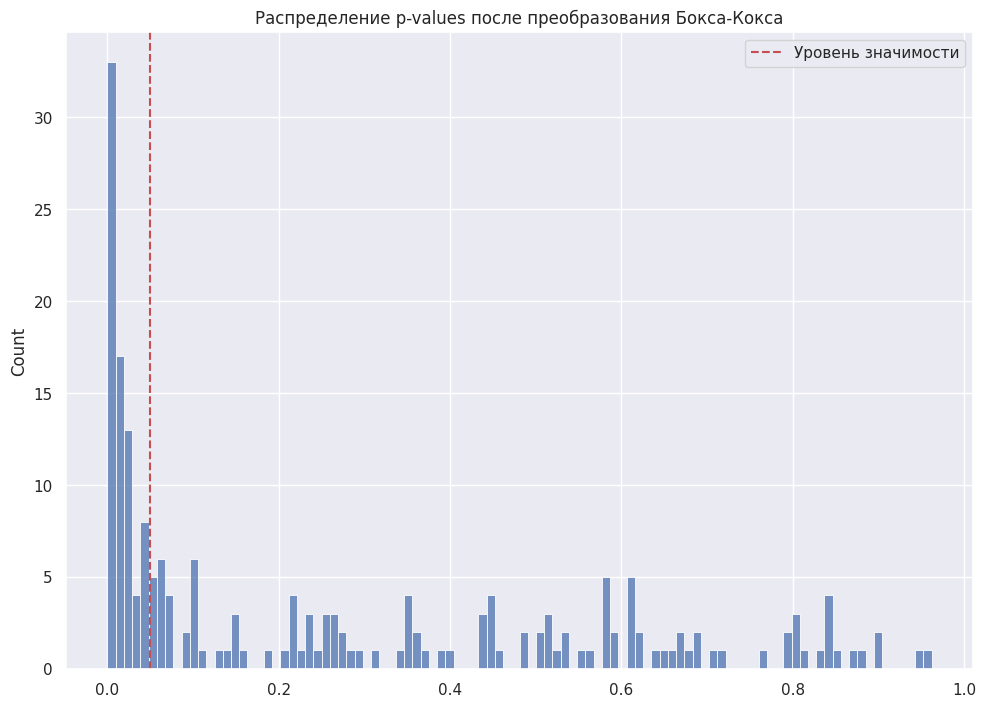

In [ ]:
plt.title('Распределение p-values после преобразования Бокса-Кокса')
sns.histplot(p_vals_box, bins=100)
plt.axvline(x=0.05, color='r', linestyle='--', label='Уровень значимости')
plt.legend();

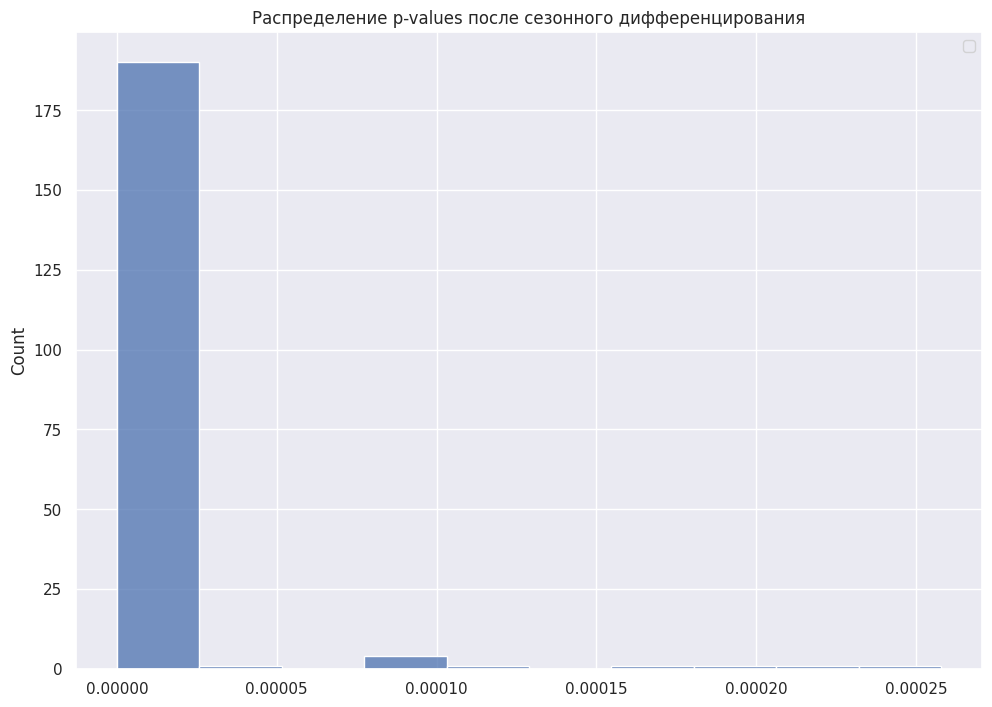

In [ ]:
plt.title('Распределение p-values после сезонного дифференцирования')
sns.histplot(p_vals_stationary, bins=10)
# plt.axvline(x=0.05, color='r', linestyle='--', label='Уровень значимости')
plt.legend();

## Работа с DEEPAR

In [ ]:
!pip install pytorch-forecasting

# Clearing outputs in Jupyter Notebook
from IPython.display import clear_output
clear_output()

# Checking if the package is installed correctly
try:
    import pytorch_forecasting
    print("pytorch-forecasting is installed successfully.")
except ImportError:
    print("Failed to import pytorch-forecasting.")

pytorch-forecasting is installed successfully.


In [ ]:
import warnings
warnings.filterwarnings('ignore')
import random

#utils
from tqdm.notebook import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec

from sklearn.metrics import r2_score
from sklearn.preprocessing import LabelEncoder


import torch
from torchmetrics.functional import r2_score

import lightning.pytorch as pl
from lightning.pytorch.callbacks import EarlyStopping
from lightning.pytorch.tuner import Tuner


from pytorch_forecasting import Baseline, DeepAR, NBeats, TimeSeriesDataSet
from pytorch_forecasting.data import NaNLabelEncoder
from pytorch_forecasting.data.examples import generate_ar_data
from pytorch_forecasting.metrics import RMSE, MAE, SMAPE, MultivariateNormalDistributionLoss
from pytorch_lightning.loggers import TensorBoardLogger

In [ ]:
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,8.27)})

In [ ]:
def fix_random_seeds(seed=42):
    # Set Python random seed
    random.seed(seed)

    # Set NumPy random seed
    np.random.seed(seed)

    # Set PyTorch random seed for CPU and CUDA devices
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

fix_random_seeds()

### 1. Импорт данных, предобработка

In [ ]:
%%time
df = pd.read_csv('./full_data_sum.csv')

CPU times: user 4.27 s, sys: 282 ms, total: 4.56 s
Wall time: 4.68 s


In [ ]:
# Предобработаем даты к удобному формату
df['date'] = pd.to_datetime(df['date'])
df['dt'] = pd.to_datetime(df.date) + df.hour.astype('timedelta64[h]')

# Для создания датасета нужно перейти от действительных значений времени к временным шагам
dates_transformer = LabelEncoder()
df['time_idx'] = dates_transformer.fit_transform(df.dt)
df['time_idx'] += 1

# Категориальные переменные должны быть в строковом типе
df['square_id'] = df['square_id'].astype(str)

In [ ]:
dates = sorted(df.date.unique())
train_dates = dates[:49]
val_dates = dates[49:-1]
test_dates = dates[-1:]

train = df[df.date.isin(train_dates)]
val = df[df.date.isin(val_dates)]
test = df[df.date.isin(test_dates)]

train_cutoff = train['time_idx'].max()
validation_cutoff = test['time_idx'].max() - 25

In [ ]:
# Заранее отобранные станции с низкой корреляцией
to_select = ['6974', '6554', '8966', '7445', '9361', '5557', '8847', '6875', '3862', '3527', '6274', '7155', '8087', '6071', '5445', '6745', '9986', '4349', '4972', '3234', '8045', '8380', '9877', '4639', '7987', '4657', '9398', '6077', '4478', '1684', '3958', '3258', '3554', '6754', '8176', '5473', '6846', '8502', '4144', '2247', '4664', '3957', '4973', '6472', '8046', '8242', '2145', '9778', '7552', '9869', '8958', '7055', '6836', '5451', '4040', '3532', '8891', '8757', '7167', '9150', '6467', '9474', '7154', '4345', '8558', '3928', '5443', '9785', '7424', '6664', '6546', '4830', '2654', '5245', '4128', '5368', '5447', '48', '7161', '8152', '4446', '4341', '4667', '5646', '7271', '6766', '6250', '6662', '7173', '7769', '6050', '4061', '8273', '4367', '3755', '3334', '8561', '4578', '3462', '8311', '7085', '3966', '3551', '6473', '8464', '8283', '8247', '7672', '8148', '4464', '7786', '4563', '3945', '6252', '4874', '6466', '5047', '3929', '8673', '6465', '5649', '7562', '3674', '8534', '3558', '7722', '4550', '8056', '3353', '7389', '5344', '4047', '6470', '3967', '6053', '4279', '8332', '6854', '7226', '8854', '6852', '3233', '6054', '7144', '4658', '7980', '6270', '5848', '6585', '7306', '5457', '7468', '6645', '5145', '6055', '5357', '4343', '4029', '3118', '3553', '4058', '6052', '4129', '3836', '5851', '3868', '4362', '6953', '6451', '4443', '3360', '4444', '5544', '4351', '9483', '9684', '6775', '3659', '4669', '7822', '851', '4642', '7341', '8776', '4452', '5847', '4056', '2960', '5957', '3632', '4876', '4350', '6444', '3759', '6447', '7754', '7240', '8286', '6972', '8177', '3863', '8459', '4742', '5636', '3954', '8278', '6297', '6461', '6869', '3871', '7073', '9770', '6695', '7375', '8011', '6647', '7143', '7753', '7540', '6833', '8885', '8934', '4889', '1150', '4158', '4526', '4378', '9598', '8856', '5669', '4354', '3655', '6961', '4748', '1147', '8004', '3763', '8274', '1349', '8562', '6976', '9155', '8751', '5865', '7172', '6648', '4826', '3748', '8791', '4948', '4542', '3285', '4428', '4951', '5437', '7684', '7354', '6355', '5551', '4147', '7163', '7156', '8744', '4057', '7724', '3960', '6459', '4327', '9143', '4777', '5458', '3255', '1555', '4743', '5953', '4066', '7324', '4851', '6154', '4666', '6769', '5450', '7273', '7075', '4678', '8746', '5755', '4453', '8013', '7551', '3432', '5947', '7046', '4871', '3661', '3854', '3767', '8374', '5948', '7556', '4852', '3845', '6663', '4243', '8688', '9351', '6260', '6371', '4027', '4565', '5543', '3962', '3828', '4344', '5372', '7256', '5977', '8049', '6877', '4726', '6572', '8441', '5550', '4379', '6966', '8410', '7305', '4143', '8051', '8833', '5741', '3427', '8085', '7453', '7353', '8435', '6872', '5273', '6756', '4068', '3347', '7852', '5750', '6862', '6046', '5653', '4276', '5753', '7813', '9266', '5146', '8835', '8271', '3671', '6150', '8071', '6671', '3765', '3654', '6152', '7065', '8635', '6153', '3733', '7265', '7064', '5028', '6971', '3970', '4733', '6151', '4228', '6533', '8312', '8756', '3548', '7623', '6372', '4553', '3959', '3673', '4226', '7342', '6755', '6771', '6367', '8047', '6853']

df = df[df.square_id.isin(to_select)]
train = train[train.square_id.isin(to_select)]
val = val[val.square_id.isin(to_select)]
test = test[test.square_id.isin(to_select)]

### 2. Создание TimeSeriesDataSet, DataLoader

In [ ]:
# Инициализируем датасеты

max_encoder_length = 60
max_prediction_length = 24


context_length = max_encoder_length
prediction_length = max_prediction_length

training = TimeSeriesDataSet(
    train,
    time_idx="time_idx",
    target="internet",
    categorical_encoders={"square_id": NaNLabelEncoder().fit(train.square_id)},
    group_ids=["square_id"],
    static_categoricals=["square_id"], # Deep AR позволяет учитывать статичные
                                       # категориальные признаки, в нашем случае это id станции
    time_varying_unknown_reals=["internet"],
    max_encoder_length=context_length,
    max_prediction_length=prediction_length,
    allow_missing_timesteps=False
)

validation = TimeSeriesDataSet.from_dataset(training,
                                            df,
                                            min_prediction_idx=train_cutoff + 1)

Для каждого элемента батча у нас есть:
- вектор значений временного ряда, который подается на вход декодеру (encoder_target)
- вектор категориальных фичей (encoder_cat)
- длина входа (encoder_lenghts)
- вектор непрерывных фичей (encoder_cont)

*И все то же самое есть для выхода с приставкой 'decoder_'*

In [ ]:
print(len(train))

447364


In [ ]:
batch_size = 128
train_dataloader = training.to_dataloader(
    train=True,
    batch_size=batch_size,
    num_workers=4,
    drop_last=True,
    batch_sampler="synchronized"
)
val_dataloader = validation.to_dataloader(
    train=False, batch_size=batch_size, num_workers=4, batch_sampler="synchronized"
)

# Выведем содержимое батча из датасета
x, y = next(iter(val_dataloader))
for key, value in x.items():
    print(f"\t{key} = {value.size()}")

	encoder_cat = torch.Size([128, 60, 1])
	encoder_cont = torch.Size([128, 60, 1])
	encoder_target = torch.Size([128, 60])
	encoder_lengths = torch.Size([128])
	decoder_cat = torch.Size([128, 24, 1])
	decoder_cont = torch.Size([128, 24, 1])
	decoder_target = torch.Size([128, 24])
	decoder_lengths = torch.Size([128])
	decoder_time_idx = torch.Size([128, 24])
	groups = torch.Size([128, 1])
	target_scale = torch.Size([128, 2])


In [ ]:
%%time
random_bs = np.random.choice(df.square_id.unique(), 150)

train_sample = TimeSeriesDataSet.from_dataset(training, train[train.square_id.isin(random_bs)])
validation_sample = TimeSeriesDataSet.from_dataset(training, val[val.square_id.isin(random_bs)], min_prediction_idx=train_cutoff + 1)


train_subset_loader = train_sample.to_dataloader(
    train=True,
    batch_size=batch_size,
    num_workers=4,
    drop_last=True,
    batch_sampler="synchronized")

val_subset_loader = validation_sample.to_dataloader(
    train=False, batch_size=batch_size, num_workers=4, batch_sampler="synchronized"
)

# Проверим, что данные внутри такие же как и в полной валидации
x, y = next(iter(val_subset_loader))
for key, value in x.items():
    print(f"\t{key} = {value.size()}")

	encoder_cat = torch.Size([123, 60, 1])
	encoder_cont = torch.Size([123, 60, 1])
	encoder_target = torch.Size([123, 60])
	encoder_lengths = torch.Size([123])
	decoder_cat = torch.Size([123, 24, 1])
	decoder_cont = torch.Size([123, 24, 1])
	decoder_target = torch.Size([123, 24])
	decoder_lengths = torch.Size([123])
	decoder_time_idx = torch.Size([123, 24])
	groups = torch.Size([123, 1])
	target_scale = torch.Size([123, 2])
CPU times: user 788 ms, sys: 164 ms, total: 952 ms
Wall time: 6.84 s


### 3. Расчет бейзлайна

In [ ]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(DEVICE)

cuda


In [ ]:
%%time
# Запишем ответы из валидации в один тензор, чтобы быстрее считать метрики
val_answers = torch.cat([y[0] for x, y in iter(val_subset_loader)]).to(DEVICE)

CPU times: user 1.27 s, sys: 698 ms, total: 1.97 s
Wall time: 36.8 s


In [ ]:
%%time
# Запустим бейзлайн на валидационной выборке, а качество такого прогноза посмотрим чуть позже
baseline_predictions = Baseline().predict(val_subset_loader,
                                          trainer_kwargs=dict(accelerator=DEVICE),
                                          return_y=False)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


CPU times: user 7.14 s, sys: 1.22 s, total: 8.36 s
Wall time: 45.2 s


### 4. Обучение сети

In [ ]:
pl.seed_everything(42)

trainer = pl.Trainer(accelerator=DEVICE, gradient_clip_val=1e-1)
net = DeepAR.from_dataset(
    training,
    learning_rate=3e-2,
    hidden_size=60,
    rnn_layers=5,
    loss=MultivariateNormalDistributionLoss(rank=30),
    optimizer="Adam",
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.0011481536214968827
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.0011481536214968827
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_89a6e17f-fde2-403b-b94a-fcbdc2c09f30.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_89a6e17f-fde2-403b-b94a-fcbdc2c09f30.ckpt


suggested learning rate: 0.0011481536214968827


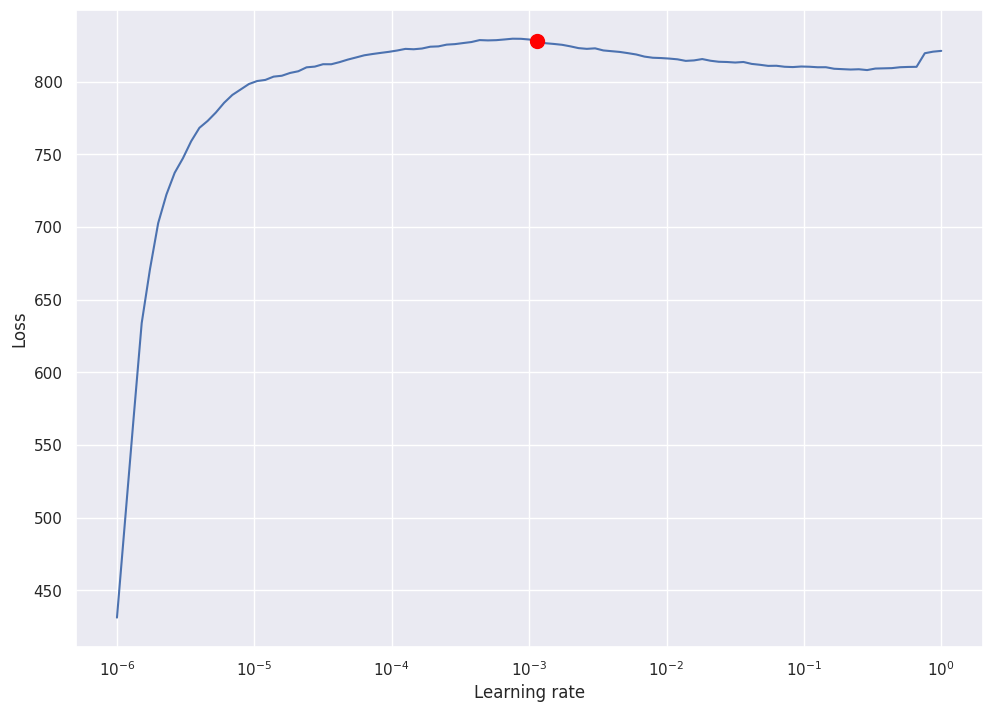

In [ ]:
res = Tuner(trainer).lr_find(
    net,
    train_dataloaders=train_subset_loader,
    val_dataloaders=val_subset_loader,
    min_lr=1e-6,
    max_lr=1e0,
    early_stop_threshold=10,
)
print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = res.suggestion()

In [ ]:
%%time
logger = TensorBoardLogger('DeepAR_Fit', name='result_deepAR_model')

early_stop_callback = EarlyStopping(monitor="val_loss",
                                    min_delta=1e-4,
                                    patience=10,
                                    verbose=False,
                                    mode="min")
trainer = pl.Trainer(
    max_epochs=3,
    accelerator=DEVICE,
    enable_model_summary=True,
    gradient_clip_val=0.1,
    callbacks=[early_stop_callback],
    # limit_train_batches=200,
    limit_val_batches=200,
    enable_checkpointing=True,
    logger=logger
)

trainer.fit(
    net,
    train_dataloaders=train_subset_loader,
    val_dataloaders=val_subset_loader
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 17.5 K
3 | rnn                    | LSTM                               | 143 K 
4 | distribution_projector | Linear                             | 2.0 K 
---------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


CPU times: user 2min 54s, sys: 9.1 s, total: 3min 3s
Wall time: 8min 52s


In [ ]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_model = DeepAR.load_from_checkpoint(best_model_path)

### 5. Валидация

In [ ]:
def evaluate(predictions, answers):
    rmse = RMSE()(predictions, answers).item()
    smape = SMAPE()(predictions, answers).item()
    mae = MAE()(predictions, answers).item()
    r2 = r2_score(predictions, answers).item()

    print(f"Evaluation Metrics:")
    print(f"RMSE: {rmse:.3f}")
    print(f"SMAPE: {smape:.3f}")
    print(f"MAE: {mae:.3f}")
    print(f"R-squared: {r2:.3f}")

In [ ]:
%%time
predictions = best_model.predict(val_subset_loader,
                                 trainer_kwargs=dict(accelerator=DEVICE), )

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


CPU times: user 1min 18s, sys: 933 ms, total: 1min 18s
Wall time: 1min 32s


In [ ]:
evaluate(predictions, val_answers)

Evaluation Metrics:
RMSE: 187.921
SMAPE: 0.185
MAE: 119.160
R-squared: 0.856


In [ ]:
evaluate(baseline_predictions, val_answers)

Evaluation Metrics:
RMSE: 350.233
SMAPE: 0.339
MAE: 229.037
R-squared: 0.497


### 6. Инференс на тестовой выборке

In [ ]:
test_dataset = TimeSeriesDataSet.from_dataset(training,
                                      df,
                                      min_prediction_idx=validation_cutoff + 1,
                                      predict_mode=True)

test_loader = test_dataset.to_dataloader(
    train=False, batch_size=batch_size, num_workers=4, batch_sampler="synchronized"
)


In [ ]:
test_answers = torch.cat([y[0] for x, y in iter(test_loader)]).to('cpu')

In [ ]:
raw_predictions = net.predict(test_loader, mode="prediction", return_x=True)
test_preds = raw_predictions[0].to('cpu')
x = raw_predictions[1]['encoder_target'].to('cpu')

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


In [ ]:
#Зафиксируем финальные метрики
evaluate(test_preds, test_answers)

Evaluation Metrics:
RMSE: 188.632
SMAPE: 0.222
MAE: 119.764
R-squared: 0.716


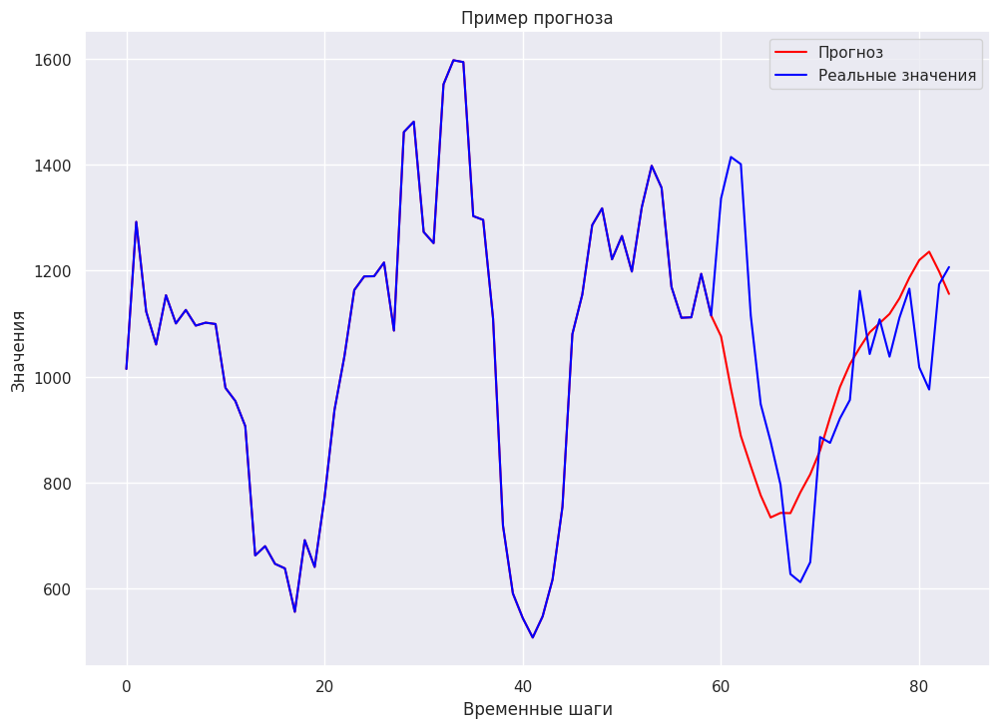

In [ ]:
# Номер базовой станции для визуализации
base_station_num = 60

# Можно визуализировать отдельные прогнозы
base_station_num = 60
plt.plot(np.concatenate([x[base_station_num], test_preds[base_station_num]]), color='red', label='Прогноз')
plt.plot(np.concatenate([x[base_station_num], test_answers[base_station_num]]), color='blue', label='Реальные значения')


# Добавляем подписи к осям и легенду
plt.xlabel('Временные шаги')
plt.ylabel('Значения')
plt.legend()
plt.title(f'Пример прогноза')

# Отображаем график
plt.show()

In [ ]:
raw_predictions = net.predict(test_loader, mode="quantiles", return_x=True)
test_preds = raw_predictions[0].to('cpu')
x = raw_predictions[1]['encoder_target'].to('cpu')

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


In [ ]:
test_preds.size()

torch.Size([388, 24, 7])

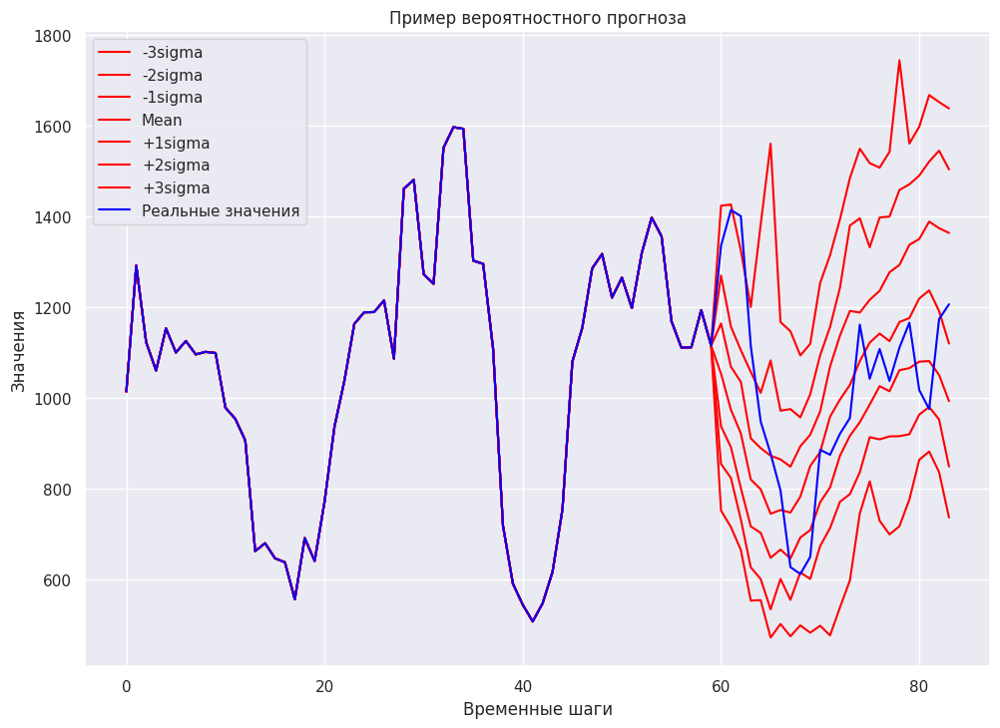

In [ ]:
base_station_num = 60

num_quantiles = test_preds.size(2)
quantile_names = ['-3sigma', '-2sigma', '-1sigma', 'Mean', '+1sigma', '+2sigma', '+3sigma']

for i in range(num_quantiles):
    plt.plot(np.concatenate([x[base_station_num], test_preds[base_station_num, :, i]]), color='red', label=f'{quantile_names[i]}')

# Реальные значения
plt.plot(np.concatenate([x[base_station_num], test_answers[base_station_num]]), color='blue', label='Реальные значения')

# Добавляем подписи к осям и легенду
plt.xlabel('Временные шаги')
plt.ylabel('Значения')
plt.legend()
plt.title(f'Пример вероятностного прогноза')

# Отображаем график
plt.show()

In [ ]:
raw_predictions = best_model.predict(test_loader,
                              trainer_kwargs=dict(accelerator="cpu"),
                              mode="raw", return_x=True)

test_preds = raw_predictions[0]['prediction']
x = raw_predictions[1]['encoder_target']

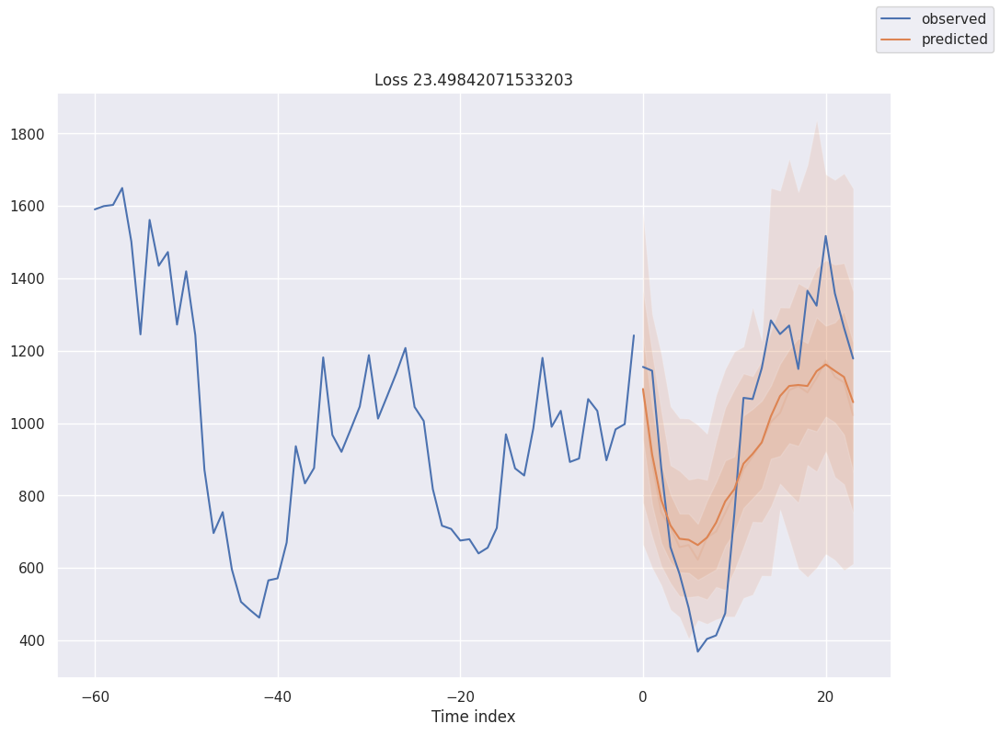

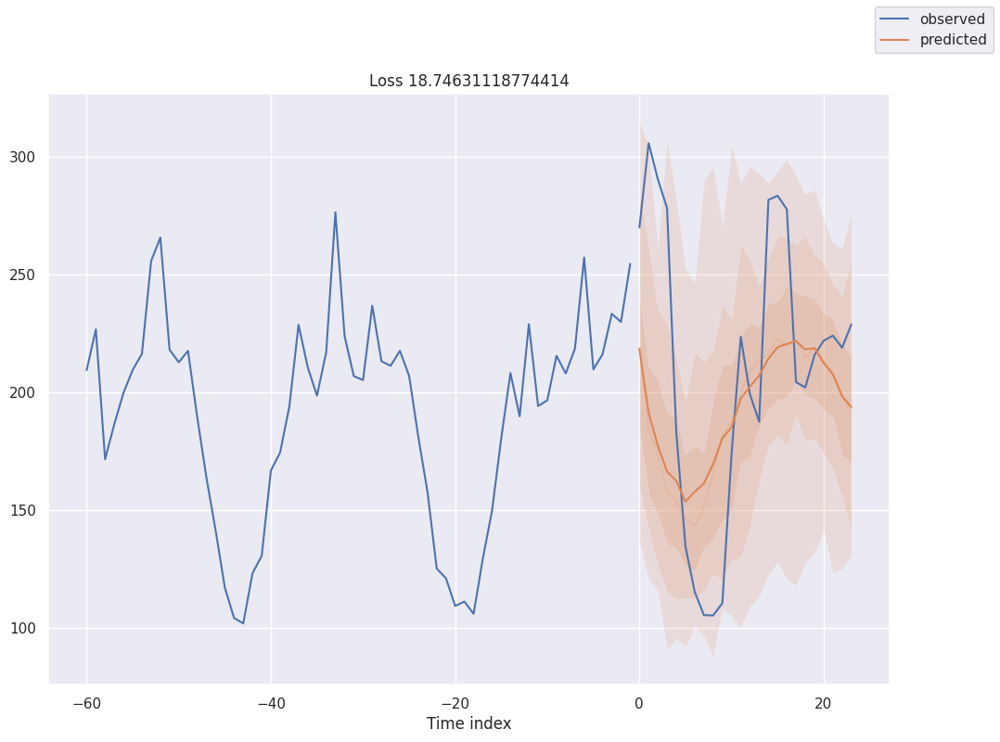

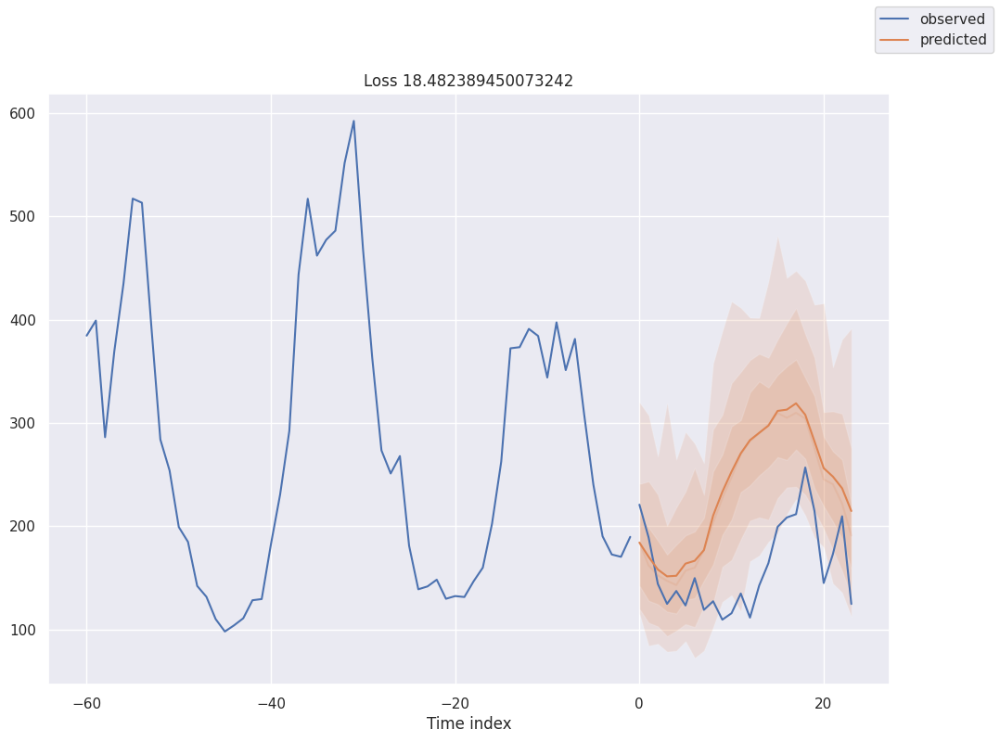

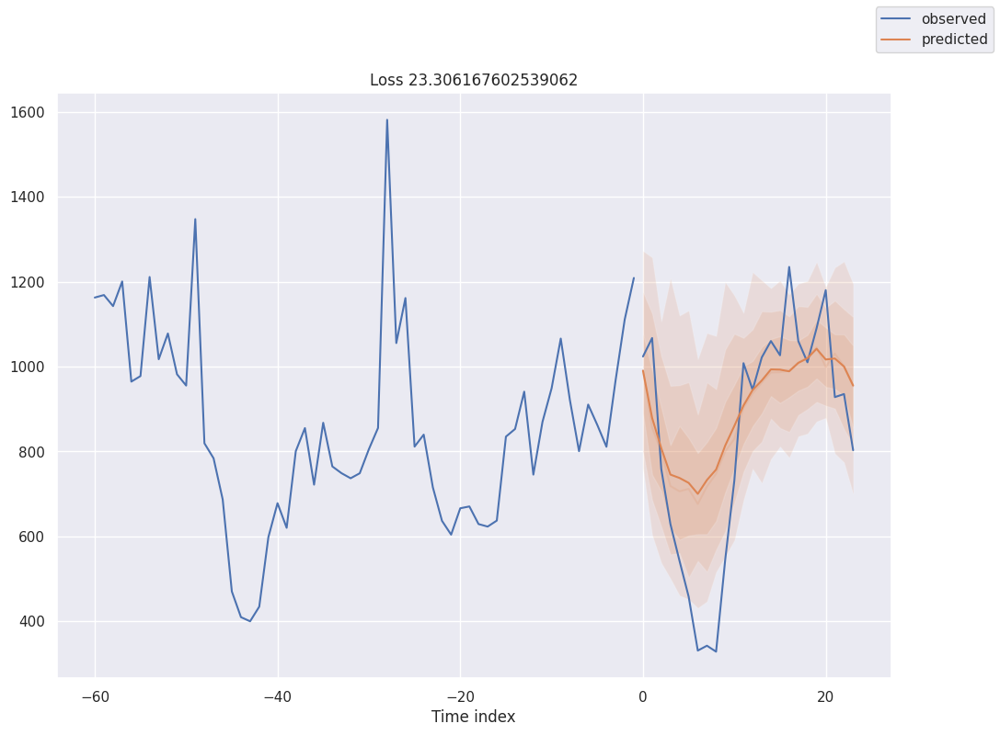

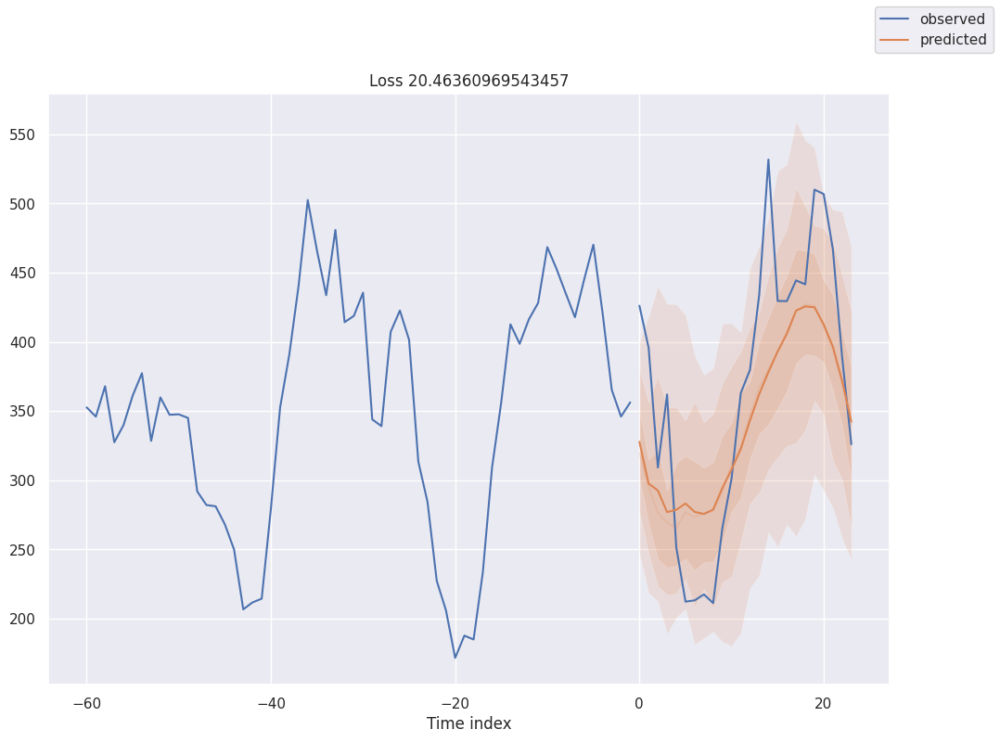

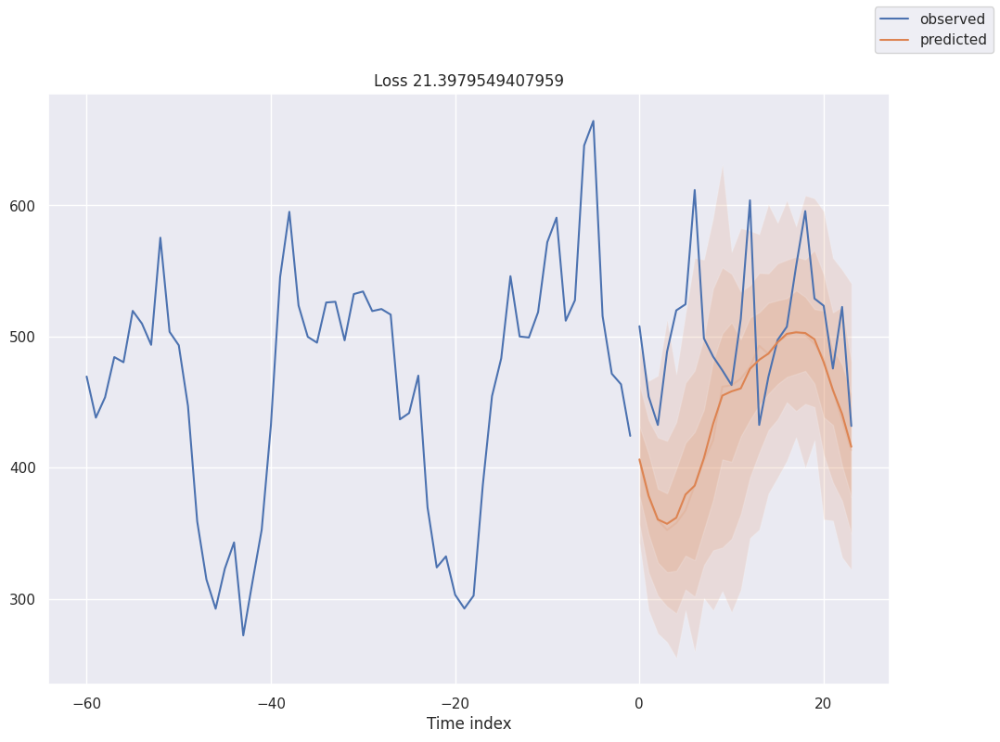

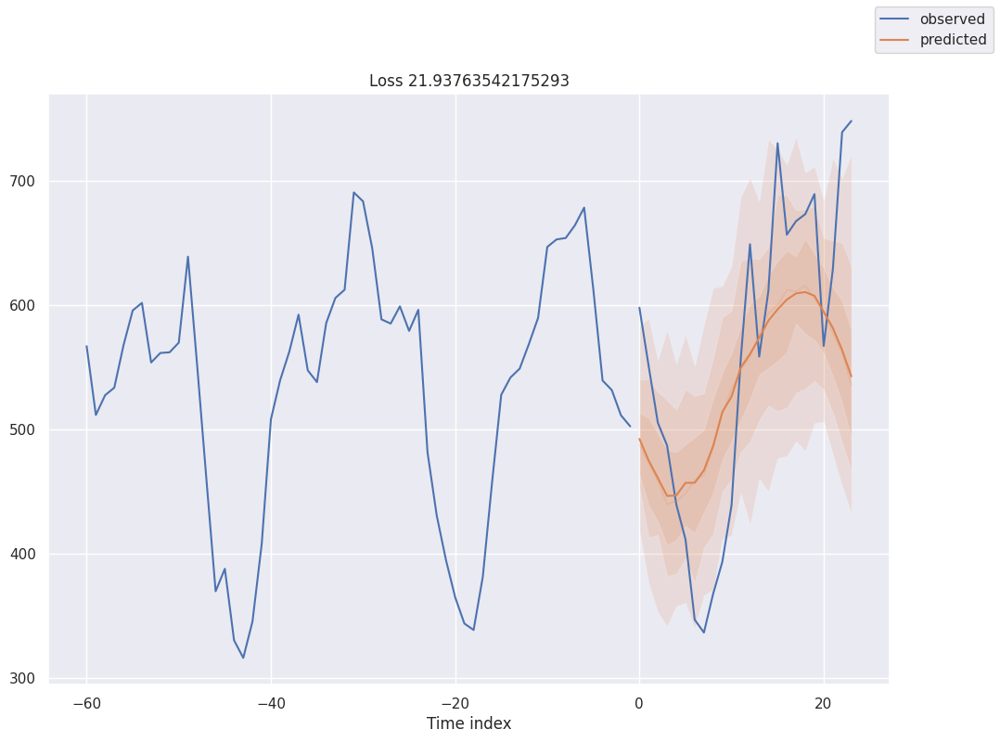

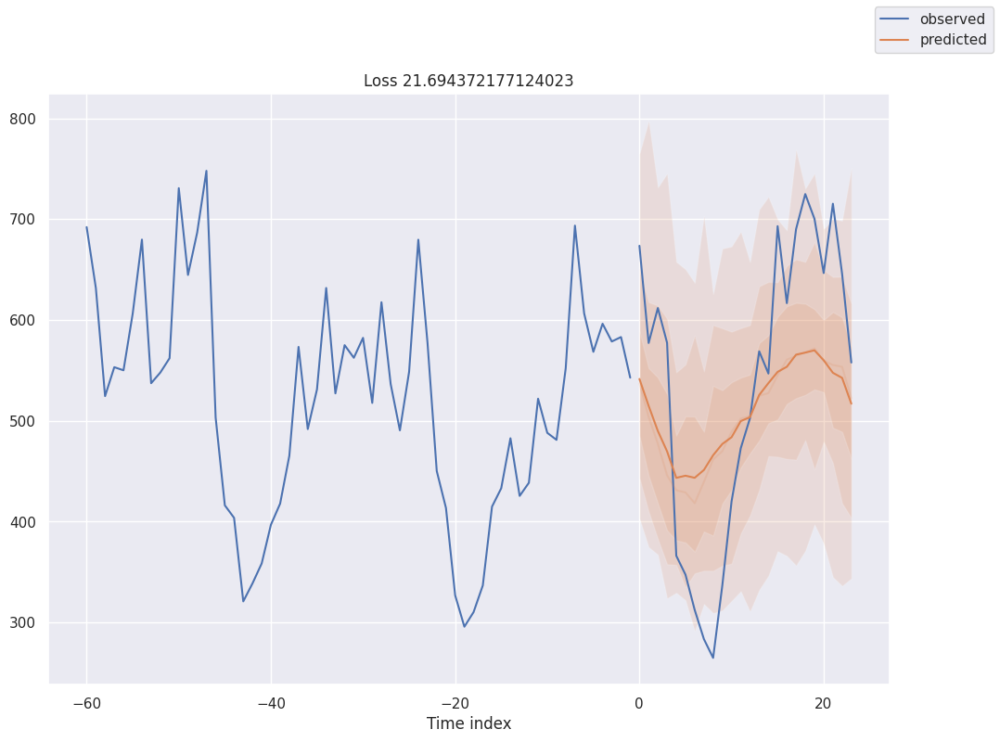

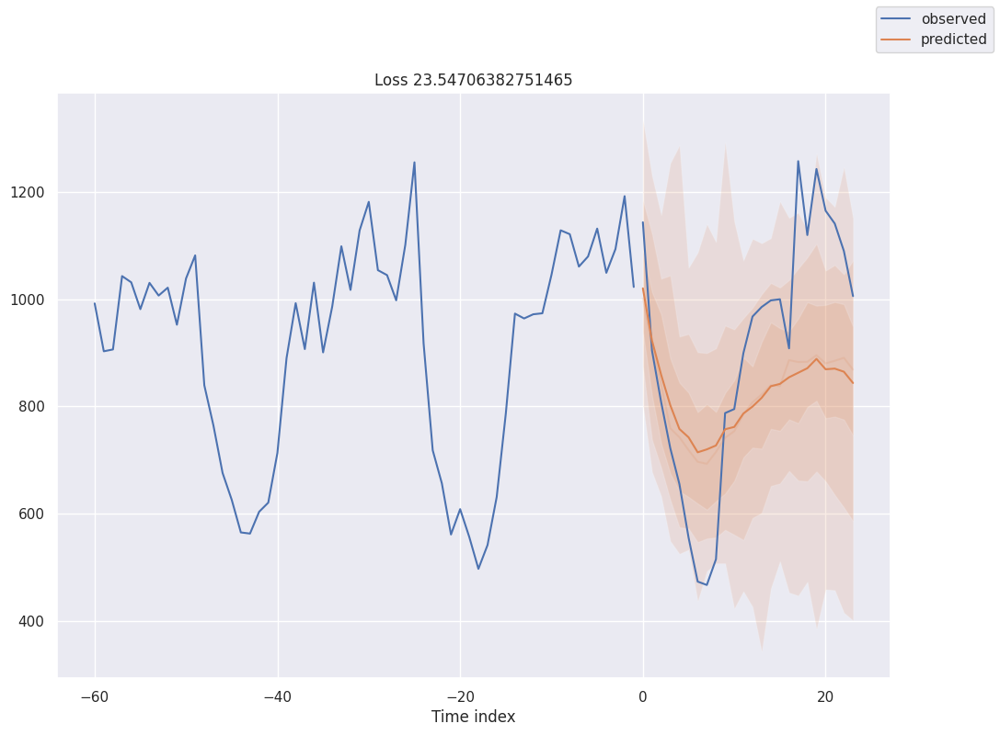

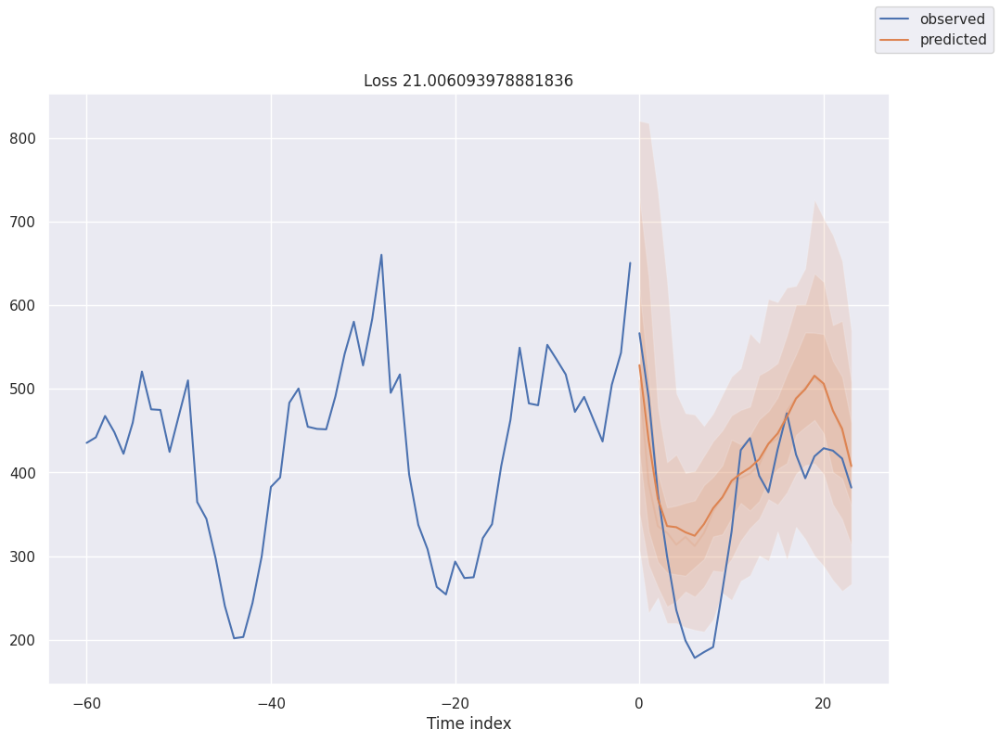

In [ ]:
for idx in range(20,30):
    best_model.plot_prediction(raw_predictions.x, raw_predictions.output, idx=idx, add_loss_to_title=True)

### 7. Постпроцессинг данных

In [ ]:
raw_predictions = net.predict(test_loader, mode="prediction", return_x=True)
test_preds = raw_predictions[0].to('cpu')
x = raw_predictions[1]

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


In [ ]:
encoder = test_dataset.categorical_encoders['square_id']
ids = encoder.inverse_transform(x['decoder_cat'].to('cpu'))
time_steps = list(range(1, test_dataset.max_prediction_length+1))

result = pd.DataFrame(columns=['square_id', 'internet', 'time_idx'])
for base in tqdm(range(test.square_id.nunique())):
    base_id = ids[base]
    forecast = pd.DataFrame({'internet': test_preds[base].numpy().tolist(),
                              'square_id': [i[0] for i in base_id],
                              'time_idx': time_steps})
    result = pd.concat([result, forecast], axis=0)

  0%|          | 0/388 [00:00<?, ?it/s]

In [ ]:
result

,square_id,internet,time_idx
0,1147,564.251892,1
1,1147,505.321869,2
2,1147,456.094635,3
3,1147,440.215698,4
4,1147,443.181366,5
...,...,...,...
19,9986,442.637970,20
20,9986,434.365875,21
21,9986,408.430389,22
22,9986,379.147400,23


## РГР

In [ ]:
# Инициализируем датасеты

max_encoder_length = 60
max_prediction_length = 24


context_length = max_encoder_length
prediction_length = max_prediction_length

training = TimeSeriesDataSet(
    train,
    time_idx="time_idx",
    target="sms_in",
    categorical_encoders={"square_id": NaNLabelEncoder().fit(train.square_id)},
    group_ids=["square_id"],
    static_categoricals=["square_id"], # Deep AR позволяет учитывать статичные
                                       # категориальные признаки, в нашем случае это id станции
    time_varying_unknown_reals=["sms_in"],
    max_encoder_length=context_length,
    max_prediction_length=prediction_length,
    allow_missing_timesteps=False
)

validation = TimeSeriesDataSet.from_dataset(training,
                                            df,
                                            min_prediction_idx=train_cutoff + 1)

In [ ]:
print(len(train))

447364


In [ ]:
batch_size = 128
train_dataloader = training.to_dataloader(
    train=True,
    batch_size=batch_size,
    num_workers=4,
    drop_last=True,
    batch_sampler="synchronized"
)
val_dataloader = validation.to_dataloader(
    train=False, batch_size=batch_size, num_workers=4, batch_sampler="synchronized"
)

# Выведем содержимое батча из датасета
x, y = next(iter(val_dataloader))
for key, value in x.items():
    print(f"\t{key} = {value.size()}")

	encoder_cat = torch.Size([128, 60, 1])
	encoder_cont = torch.Size([128, 60, 1])
	encoder_target = torch.Size([128, 60])
	encoder_lengths = torch.Size([128])
	decoder_cat = torch.Size([128, 24, 1])
	decoder_cont = torch.Size([128, 24, 1])
	decoder_target = torch.Size([128, 24])
	decoder_lengths = torch.Size([128])
	decoder_time_idx = torch.Size([128, 24])
	groups = torch.Size([128, 1])
	target_scale = torch.Size([128, 2])


In [ ]:
%%time
random_bs = np.random.choice(df.square_id.unique(), 150)

train_sample = TimeSeriesDataSet.from_dataset(training, train[train.square_id.isin(random_bs)])
validation_sample = TimeSeriesDataSet.from_dataset(training, val[val.square_id.isin(random_bs)], min_prediction_idx=train_cutoff + 1)


train_subset_loader = train_sample.to_dataloader(
    train=True,
    batch_size=batch_size,
    num_workers=4,
    drop_last=True,
    batch_sampler="synchronized")

val_subset_loader = validation_sample.to_dataloader(
    train=False, batch_size=batch_size, num_workers=4, batch_sampler="synchronized"
)

# Проверим, что данные внутри такие же как и в полной валидации
x, y = next(iter(val_subset_loader))
for key, value in x.items():
    print(f"\t{key} = {value.size()}")

	encoder_cat = torch.Size([128, 60, 1])
	encoder_cont = torch.Size([128, 60, 1])
	encoder_target = torch.Size([128, 60])
	encoder_lengths = torch.Size([128])
	decoder_cat = torch.Size([128, 24, 1])
	decoder_cont = torch.Size([128, 24, 1])
	decoder_target = torch.Size([128, 24])
	decoder_lengths = torch.Size([128])
	decoder_time_idx = torch.Size([128, 24])
	groups = torch.Size([128, 1])
	target_scale = torch.Size([128, 2])
CPU times: user 515 ms, sys: 218 ms, total: 733 ms
Wall time: 1.23 s


### 3. Расчет бейзлайна

In [ ]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print(DEVICE)

cuda


In [ ]:
%%time
# Запишем ответы из валидации в один тензор, чтобы быстрее считать метрики
val_answers = torch.cat([y[0] for x, y in iter(val_subset_loader)]).to(DEVICE)

CPU times: user 1.94 s, sys: 801 ms, total: 2.74 s
Wall time: 24.5 s


In [ ]:
%%time
# Запустим бейзлайн на валидационной выборке, а качество такого прогноза посмотрим чуть позже
baseline_predictions = Baseline().predict(val_subset_loader,
                                          trainer_kwargs=dict(accelerator=DEVICE),
                                          return_y=False)

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


CPU times: user 3.04 s, sys: 860 ms, total: 3.9 s
Wall time: 24.9 s


### 4. Обучение сети

In [ ]:
pl.seed_everything(42)

trainer = pl.Trainer(accelerator=DEVICE, gradient_clip_val=1e-1)
net = DeepAR.from_dataset(
    training,
    learning_rate=3e-2,
    hidden_size=60,
    rnn_layers=5,
    loss=MultivariateNormalDistributionLoss(rank=30),
    optimizer="Adam",
)

INFO: Seed set to 42
INFO:lightning.fabric.utilities.seed:Seed set to 42
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Finding best initial lr:   0%|          | 0/100 [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_steps=100` reached.
INFO: Learning rate set to 0.003467368504525315
INFO:lightning.pytorch.tuner.lr_finder:Learning rate set to 0.003467368504525315
INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at /content/.lr_find_2044d91b-6f48-4a0e-baa4-69f3cae36bcb.ckpt
INFO:pytorch_lightning.utilities.rank_zero:Restored all states from the checkpoint at /content/.lr_find_2044d91b-6f48-4a0e-baa4-69f3cae36bcb.ckpt


suggested learning rate: 0.003467368504525315


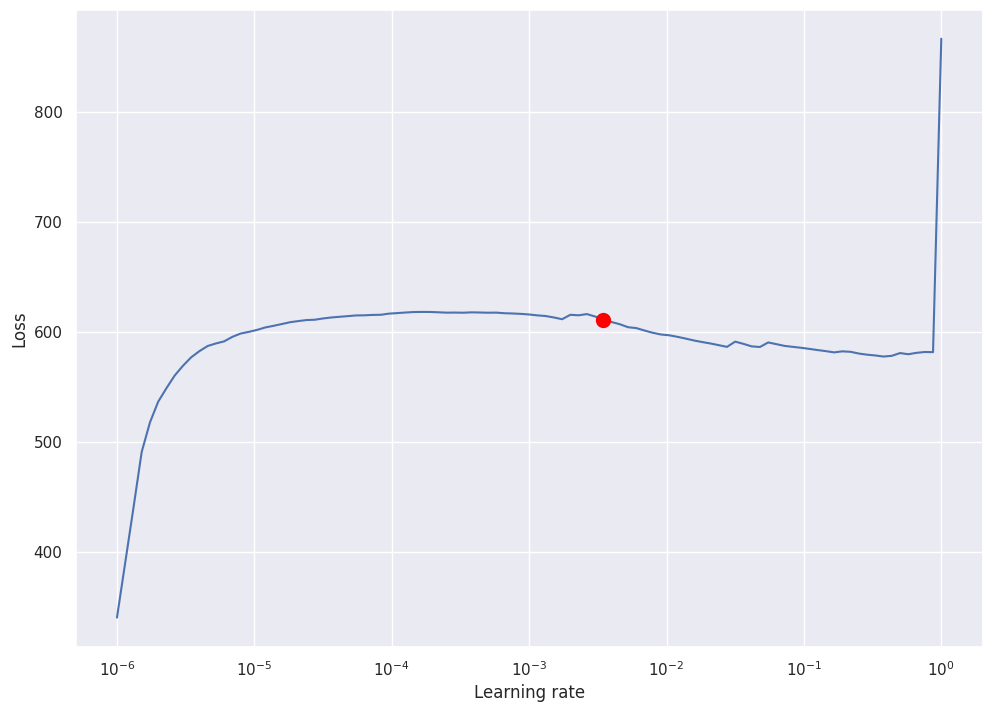

In [ ]:
res = Tuner(trainer).lr_find(
    net,
    train_dataloaders=train_subset_loader,
    val_dataloaders=val_subset_loader,
    min_lr=1e-6,
    max_lr=1e0,
    early_stop_threshold=10,
)
print(f"suggested learning rate: {res.suggestion()}")
fig = res.plot(show=True, suggest=True)
fig.show()
net.hparams.learning_rate = res.suggestion()

In [ ]:
%%time
logger = TensorBoardLogger('DeepAR_Fit', name='result_deepAR_model')

early_stop_callback = EarlyStopping(monitor="val_loss",
                                    min_delta=1e-4,
                                    patience=10,
                                    verbose=False,
                                    mode="min")
trainer = pl.Trainer(
    max_epochs=3,
    accelerator=DEVICE,
    enable_model_summary=True,
    gradient_clip_val=0.1,
    callbacks=[early_stop_callback],
    # limit_train_batches=200,
    limit_val_batches=200,
    enable_checkpointing=True,
    logger=logger
)

trainer.fit(
    net,
    train_dataloaders=train_subset_loader,
    val_dataloaders=val_subset_loader
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name                   | Type                               | Params
------------------------------------------------------------------------------
0 | loss                   | MultivariateNormalDistributionLoss | 0     
1 | logging_metrics        | ModuleList                         | 0     
2 | embeddings             | MultiEmbedding                     | 17.5 K
3 | rnn                    | LSTM                               | 143 K 
4 | distribution_projector | Linear                             | 2.0 K 
---------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=3` reached.


CPU times: user 2min 52s, sys: 8.89 s, total: 3min 1s
Wall time: 8min 1s


In [ ]:
best_model_path = trainer.checkpoint_callback.best_model_path
best_model = DeepAR.load_from_checkpoint(best_model_path)

### 5. Валидация

In [ ]:
def evaluate(predictions, answers):
    rmse = RMSE()(predictions, answers).item()
    smape = SMAPE()(predictions, answers).item()
    mae = MAE()(predictions, answers).item()
    r2 = r2_score(predictions, answers).item()

    print(f"Evaluation Metrics:")
    print(f"RMSE: {rmse:.3f}")
    print(f"SMAPE: {smape:.3f}")
    print(f"MAE: {mae:.3f}")
    print(f"R-squared: {r2:.3f}")

In [ ]:
%%time
predictions = best_model.predict(val_subset_loader,
                                 trainer_kwargs=dict(accelerator=DEVICE), )

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


CPU times: user 1min 34s, sys: 1.35 s, total: 1min 35s
Wall time: 1min 49s


In [ ]:
evaluate(predictions, val_answers)

Evaluation Metrics:
RMSE: 40.235
SMAPE: 0.687
MAE: 27.221
R-squared: 0.540


In [ ]:
evaluate(baseline_predictions, val_answers)

Evaluation Metrics:
RMSE: 67.008
SMAPE: 0.976
MAE: 44.330
R-squared: -0.289


### 6. Инференс на тестовой выборке

In [ ]:
test_dataset = TimeSeriesDataSet.from_dataset(training,
                                      df,
                                      min_prediction_idx=validation_cutoff + 1,
                                      predict_mode=True)

test_loader = test_dataset.to_dataloader(
    train=False, batch_size=batch_size, num_workers=4, batch_sampler="synchronized"
)


In [ ]:
test_answers = torch.cat([y[0] for x, y in iter(test_loader)]).to('cpu')

In [ ]:
raw_predictions = net.predict(test_loader, mode="prediction", return_x=True)
test_preds = raw_predictions[0].to('cpu')
x = raw_predictions[1]['encoder_target'].to('cpu')

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


In [ ]:
#Зафиксируем финальные метрики
evaluate(test_preds, test_answers)

Evaluation Metrics:
RMSE: 51.557
SMAPE: 0.545
MAE: 27.723
R-squared: -2.194


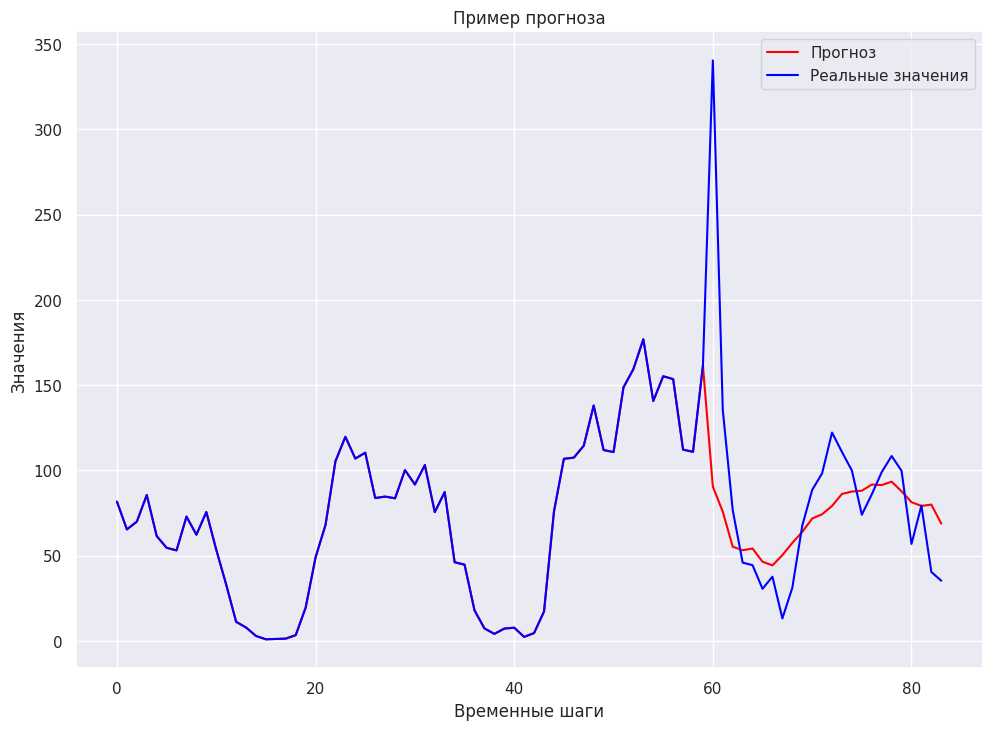

In [ ]:
# Номер базовой станции для визуализации
base_station_num = 60

# Можно визуализировать отдельные прогнозы
base_station_num = 60
plt.plot(np.concatenate([x[base_station_num], test_preds[base_station_num]]), color='red', label='Прогноз')
plt.plot(np.concatenate([x[base_station_num], test_answers[base_station_num]]), color='blue', label='Реальные значения')


# Добавляем подписи к осям и легенду
plt.xlabel('Временные шаги')
plt.ylabel('Значения')
plt.legend()
plt.title(f'Пример прогноза')

# Отображаем график
plt.show()

In [ ]:
raw_predictions = net.predict(test_loader, mode="quantiles", return_x=True)
test_preds = raw_predictions[0].to('cpu')
x = raw_predictions[1]['encoder_target'].to('cpu')

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


In [ ]:
test_preds.size()

torch.Size([388, 24, 7])

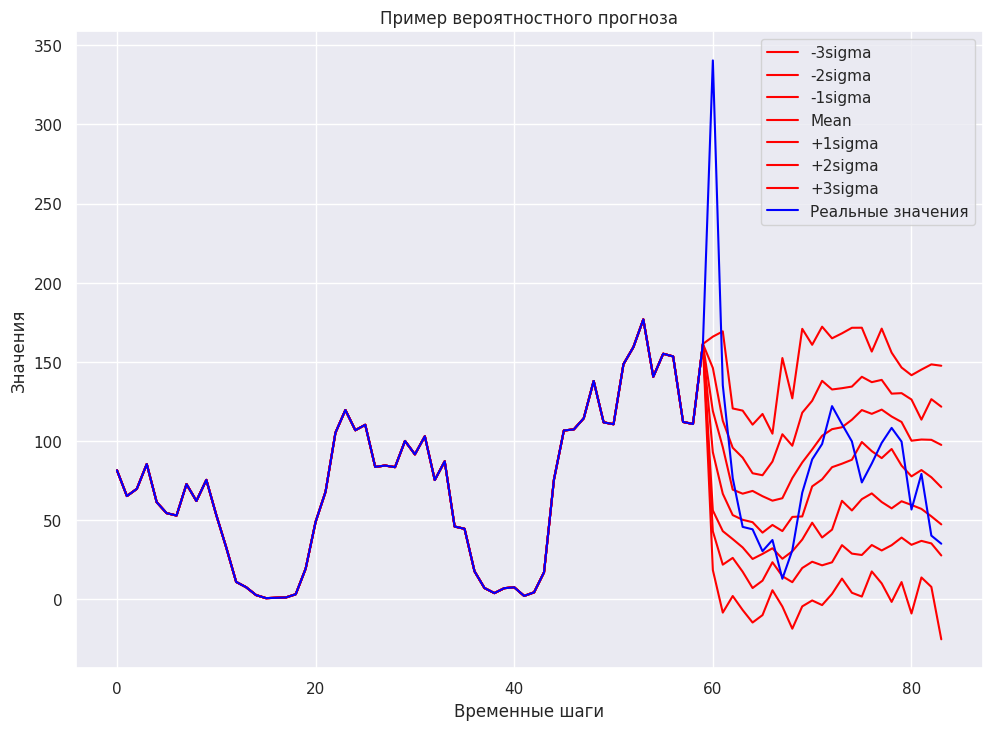

In [ ]:
base_station_num = 60

num_quantiles = test_preds.size(2)
quantile_names = ['-3sigma', '-2sigma', '-1sigma', 'Mean', '+1sigma', '+2sigma', '+3sigma']

for i in range(num_quantiles):
    plt.plot(np.concatenate([x[base_station_num], test_preds[base_station_num, :, i]]), color='red', label=f'{quantile_names[i]}')

# Реальные значения
plt.plot(np.concatenate([x[base_station_num], test_answers[base_station_num]]), color='blue', label='Реальные значения')

# Добавляем подписи к осям и легенду
plt.xlabel('Временные шаги')
plt.ylabel('Значения')
plt.legend()
plt.title(f'Пример вероятностного прогноза')

# Отображаем график
plt.show()

In [ ]:
raw_predictions = best_model.predict(test_loader,
                              trainer_kwargs=dict(accelerator="cpu"),
                              mode="raw", return_x=True)

test_preds = raw_predictions[0]['prediction']
x = raw_predictions[1]['encoder_target']

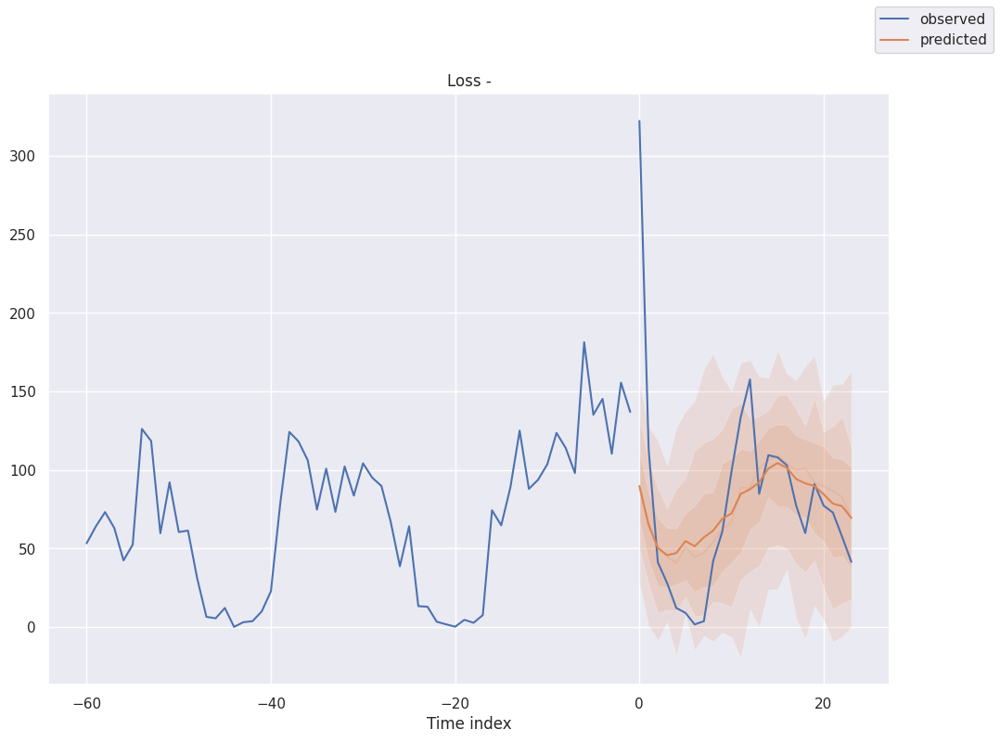

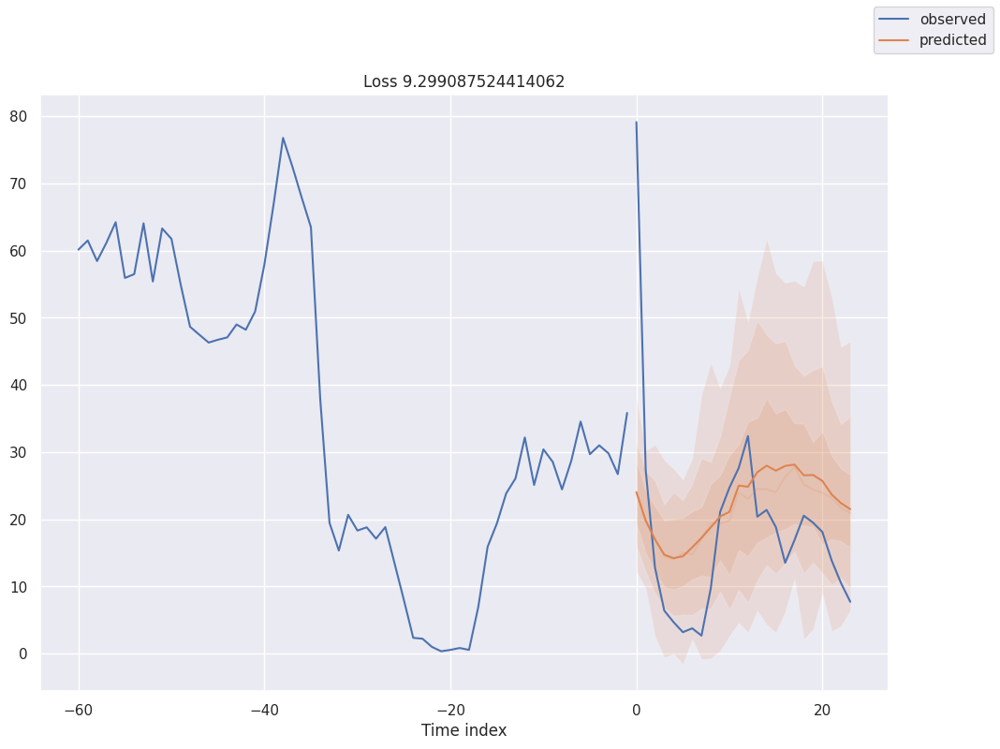

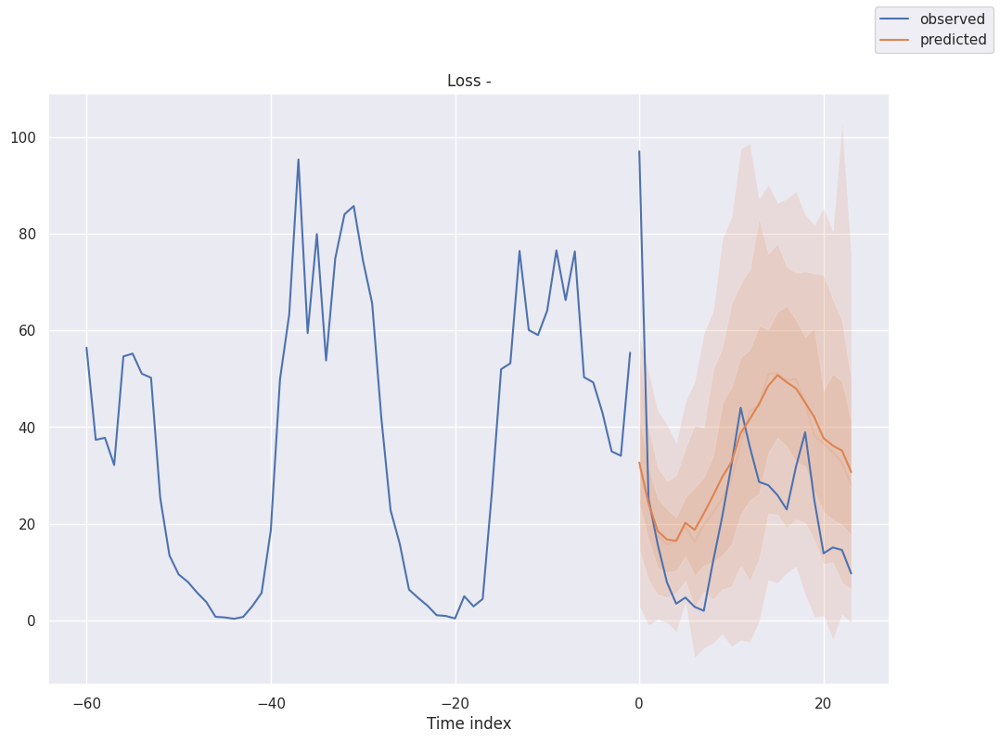

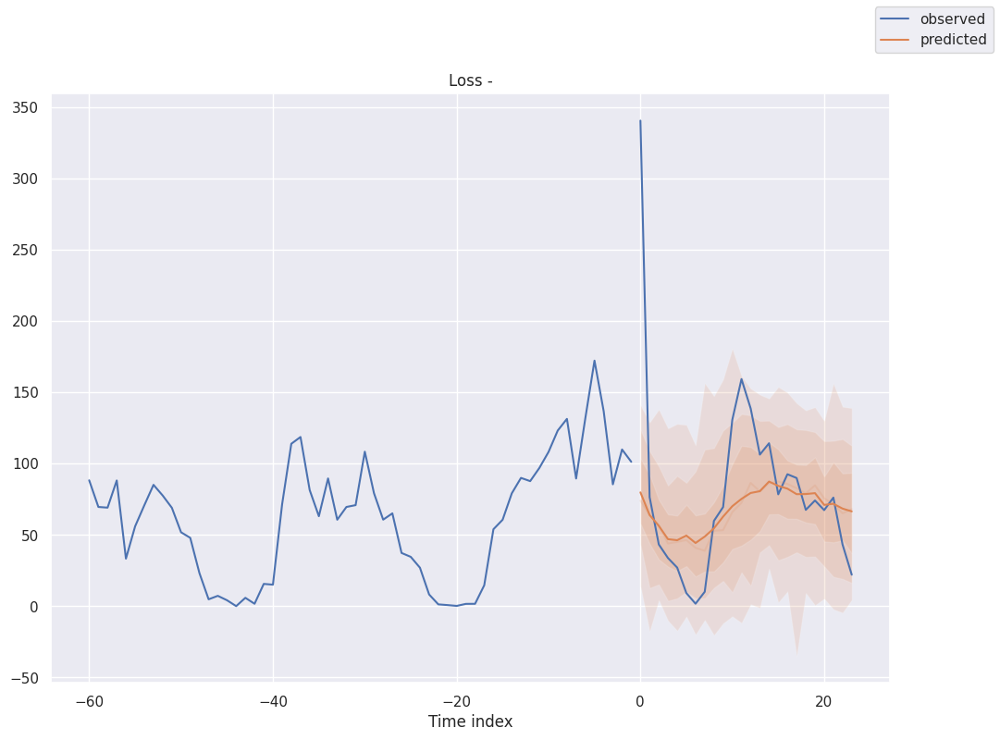

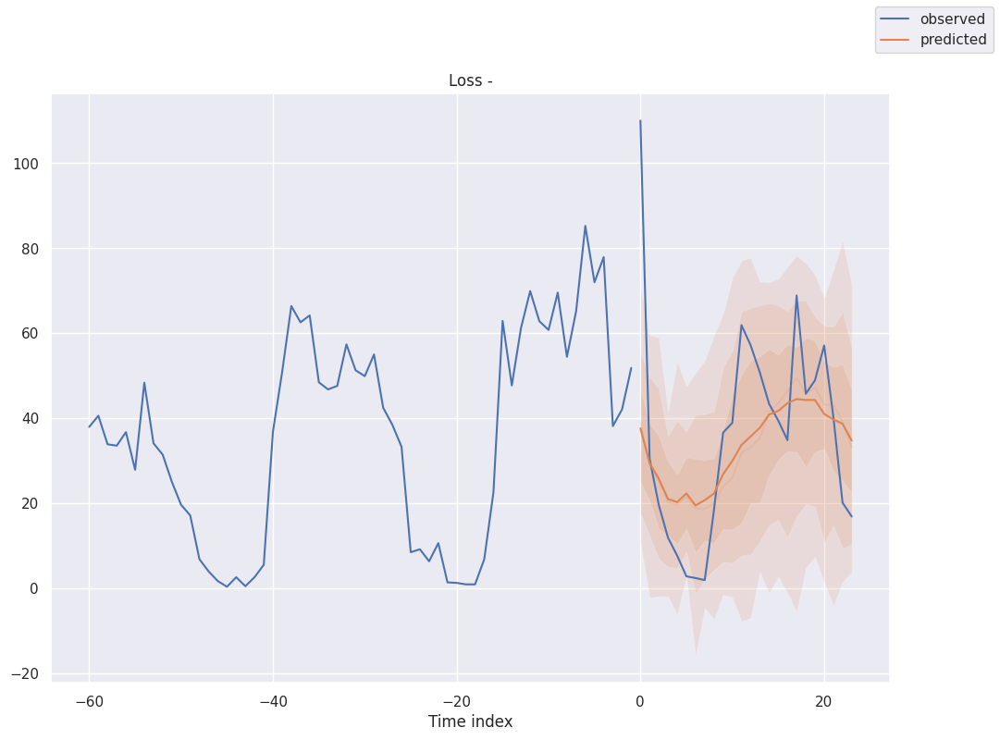

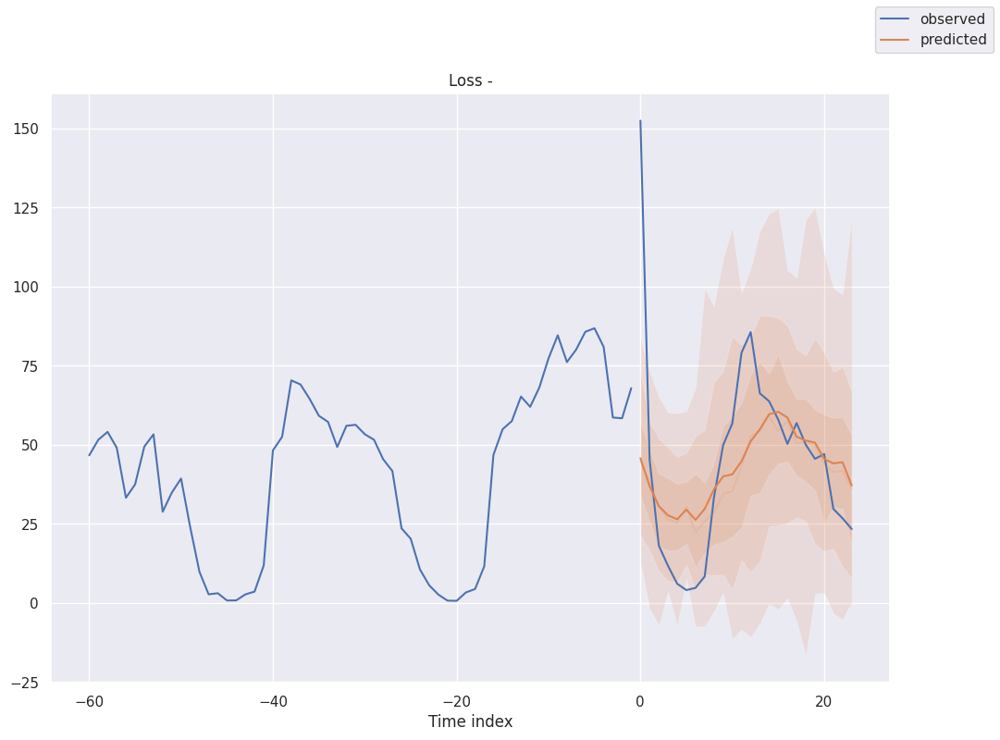

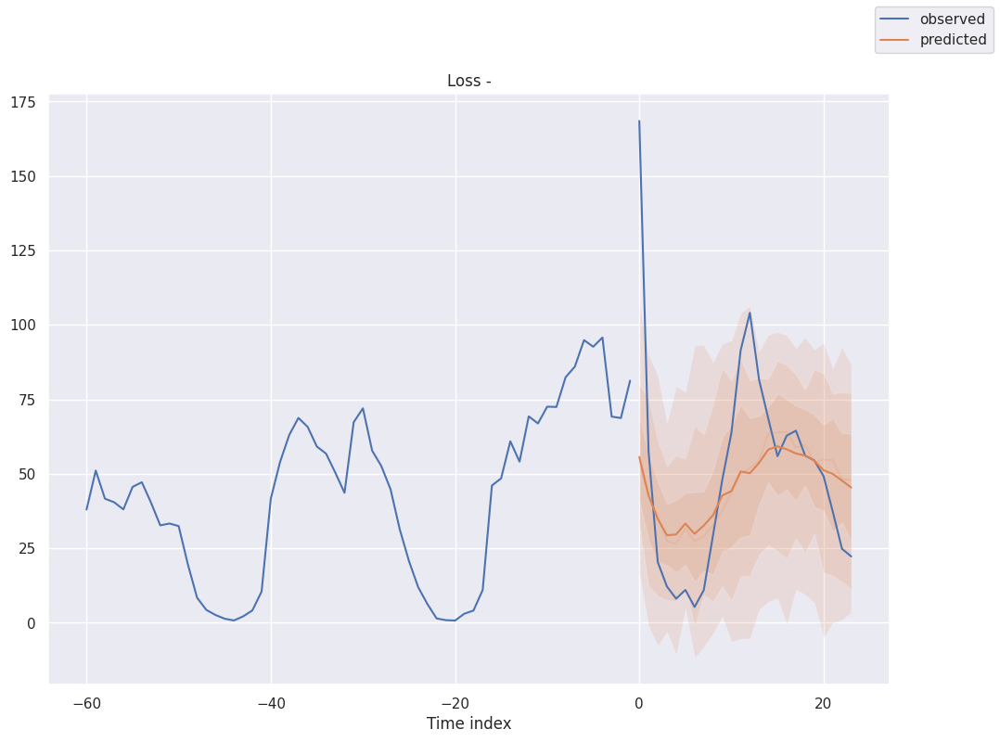

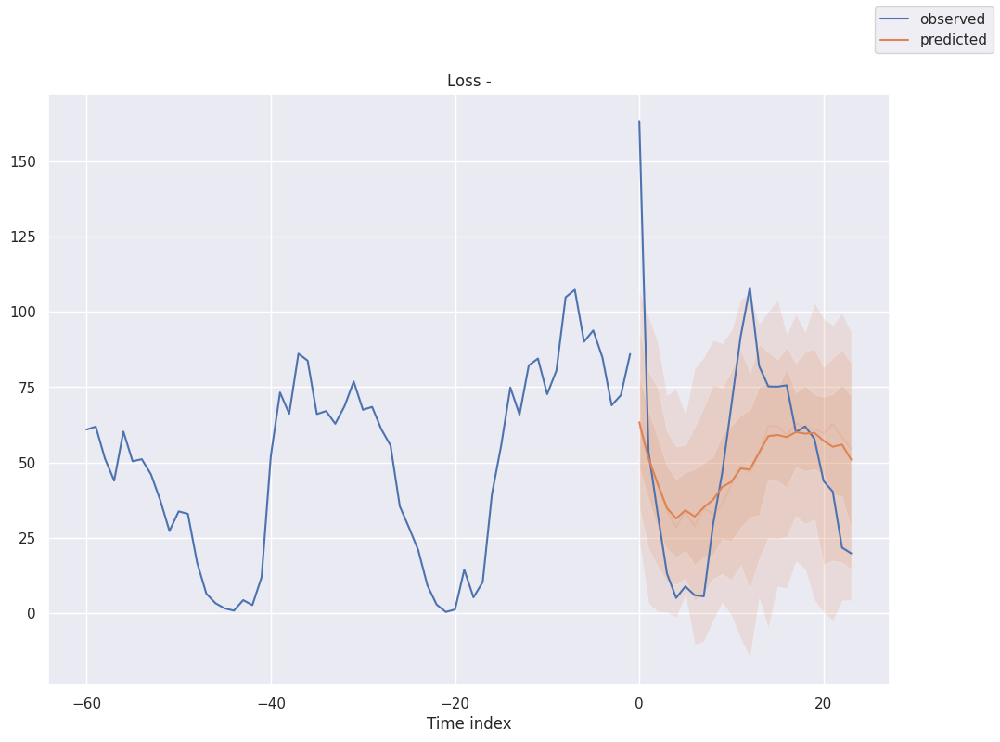

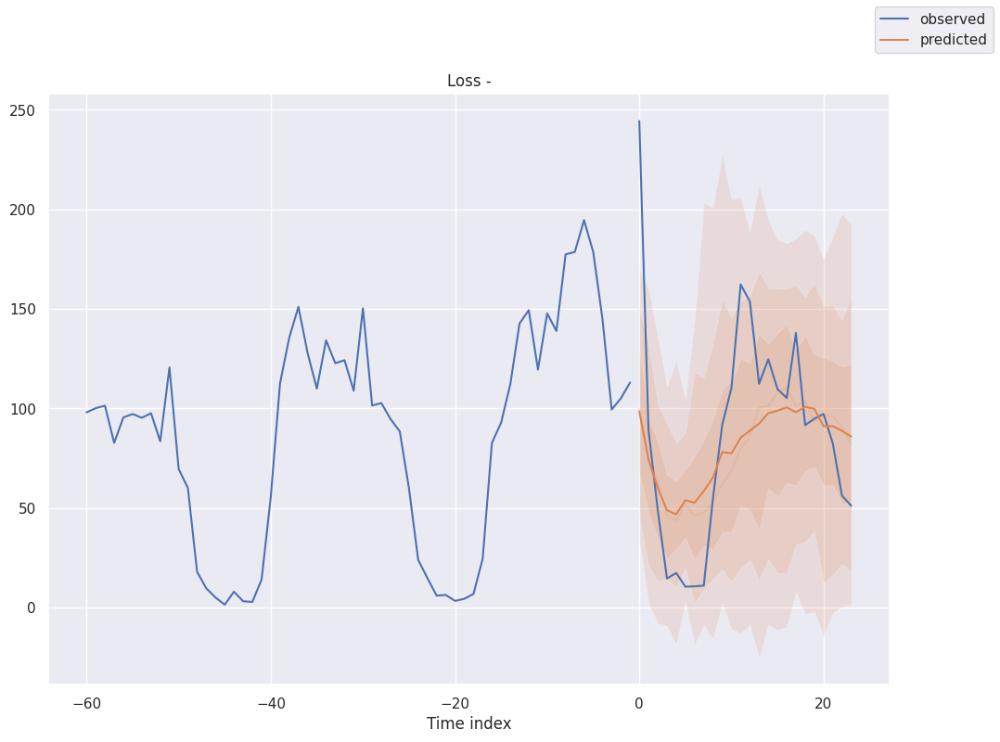

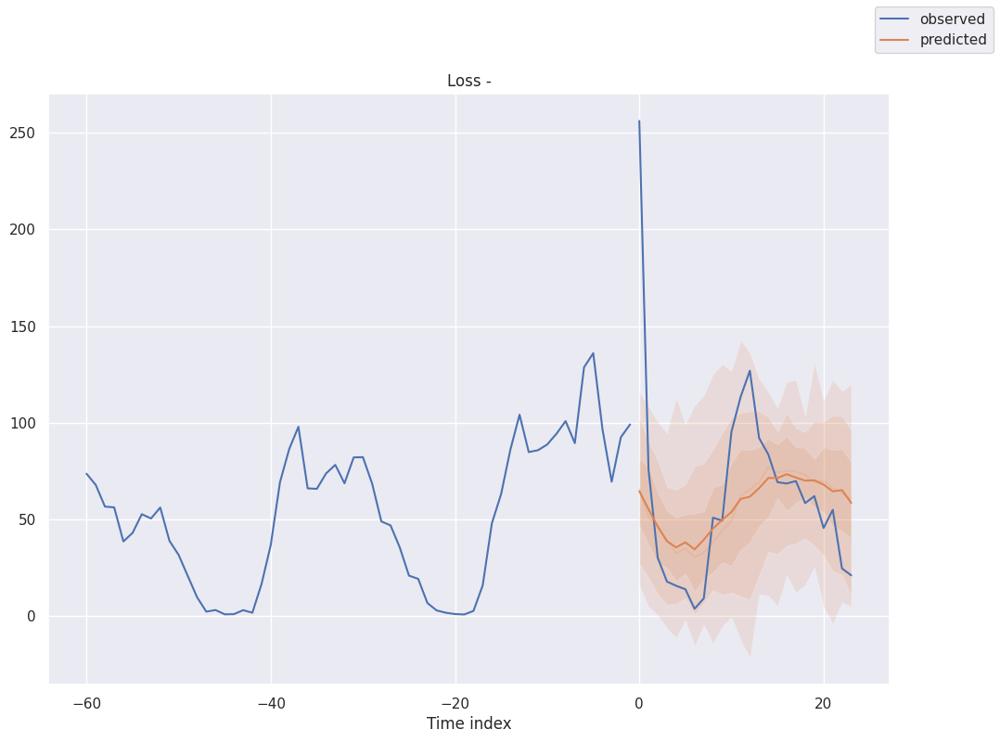

In [ ]:
for idx in range(20,30):
    best_model.plot_prediction(raw_predictions.x, raw_predictions.output, idx=idx, add_loss_to_title=True)

### 7. Постпроцессинг данных

In [ ]:
raw_predictions = net.predict(test_loader, mode="prediction", return_x=True)
test_preds = raw_predictions[0].to('cpu')
x = raw_predictions[1]

INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:lightning.pytorch.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


In [ ]:
encoder = test_dataset.categorical_encoders['square_id']
ids = encoder.inverse_transform(x['decoder_cat'].to('cpu'))
time_steps = list(range(1, test_dataset.max_prediction_length+1))

result = pd.DataFrame(columns=['square_id', 'sms_in', 'time_idx'])
for base in tqdm(range(test.square_id.nunique())):
    base_id = ids[base]
    forecast = pd.DataFrame({'sms_in': test_preds[base].numpy().tolist(),
                              'square_id': [i[0] for i in base_id],
                              'time_idx': time_steps})
    result = pd.concat([result, forecast], axis=0)

  0%|          | 0/388 [00:00<?, ?it/s]

In [ ]:
result

,square_id,sms_in,time_idx
0,1147,48.721149,1
1,1147,43.850662,2
2,1147,36.021912,3
3,1147,31.624586,4
4,1147,28.468214,5
...,...,...,...
19,9986,35.884743,20
20,9986,34.133919,21
21,9986,32.458584,22
22,9986,32.185249,23
